In [5]:
import pandas as pd                  # Wrangling
import numpy as np                   # Wrangling
from matplotlib import pyplot as plt # Graphs
import seaborn as sns                # Graphs
from time import strptime            # Wrangling
%matplotlib inline 
import calendar
import nltk
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator


In [6]:
# Load 'review.csv' as reviews
# Load 'profile.csv' as profiles; to be joined with reviews
reviews = pd.read_excel('EmployeeReviews.xlsx')
profiles = pd.read_excel('CompanyProfileFinal.xlsx')

print(reviews.head())
profiles

            company  reviewRating  \
0  Costco Wholesale           5.0   
1  Costco Wholesale           5.0   
2  Costco Wholesale           4.0   
3  Costco Wholesale           3.0   
4  Costco Wholesale           3.0   

                                         reviewTitle  \
0  Company as a whole is great, but I didn’t like...   
1                 Costco can be a good place to work   
2              Fast paced and very customer oriented   
3                      Great Company, bad management   
4                                    poor management   

                          jobTitle         location         reviewDate  \
0               Deli Service Clerk       Dublin, OH  December 19, 2017   
1             Front-end Supervisor       Murray, UT     March 18, 2019   
2                       Deli Clerk       Baxter, MN     March 18, 2019   
3  Major Appliance Sales Associate    Charlotte, NC     March 18, 2019   
4                          Cashier  Baton Rouge, LA     March 18, 2019

,company,headquarter,industry,overallRating,work_life_balance,compensations_benefits,job_security,management,culture,reviewCount
0,Costco Wholesale,"Headquartered in Issaquah, Washington",Retail,4.2,3.9,4.3,3.9,3.7,4.0,8517
1,Kaiser Permanente,"Headquartered in Oakland California, United St...",Health Care,4.2,4.0,4.3,3.8,3.6,3.9,8790
2,Verizon,"Headquartered in New York New York, United States",Telecommunications,3.9,3.5,4.2,3.4,3.4,3.6,22867
3,Capital One,Headquartered in 1680 Capital One Dr. \nMclean...,Banks and Financial Services,4.0,3.9,4.0,3.4,3.5,3.9,7306
4,In-N-Out Burger,"Headquartered in Irvine California, United States","Restaurants, Travel and Leisure",4.5,4.2,4.4,4.4,4.1,4.4,1461
5,FedEx Express,Headquartered in World Headquarters is located...,Transport and Freight,4.0,3.8,4.1,3.8,3.6,3.8,2097
6,HEB,Headquartered in 646 South Main Avenue\r\nSan ...,Retail,4.3,4.0,4.1,4.0,3.8,4.2,5787
7,Advance Financial,Headquartered in Tennessee,Banks and Financial Services,4.1,3.5,4.3,3.9,3.8,4.1,592
8,Apple,"Headquartered in Cupertino, California, United...",Computers and Electronics,4.2,3.8,4.1,3.7,3.7,4.1,7069
9,GEICO,"Headquartered in One GEICO Plaza,\r\nWashingto...",Insurance,3.5,3.1,4.0,3.6,3.1,3.3,3642


In [7]:
# Join profiles.industry into reviews
reviews = pd.merge(reviews, profiles,  on='company')
reviews.head()

,company,reviewRating,reviewTitle,jobTitle,location,reviewDate,comment,pros,cons,headquarter,industry,overallRating,work_life_balance,compensations_benefits,job_security,management,culture,reviewCount
0,Costco Wholesale,5.0,"Company as a whole is great, but I didn’t like...",Deli Service Clerk,"Dublin, OH","December 19, 2017","I worked in the deli, and that was the most st...",Great pay and benefits.,Stressful work environment,"Headquartered in Issaquah, Washington",Retail,4.2,3.9,4.3,3.9,3.7,4.0,8517
1,Costco Wholesale,5.0,Costco can be a good place to work,Front-end Supervisor,"Murray, UT","March 18, 2019",Costco can be a good place to work because- It...,- It pays well - the benefits are amazing - co...,"Management can be a hinderance to your work, E...","Headquartered in Issaquah, Washington",Retail,4.2,3.9,4.3,3.9,3.7,4.0,8517
2,Costco Wholesale,4.0,Fast paced and very customer oriented,Deli Clerk,"Baxter, MN","March 18, 2019",Costco is an exceptional company with above av...,No Pros,"Management can be a hinderance to your work, E...","Headquartered in Issaquah, Washington",Retail,4.2,3.9,4.3,3.9,3.7,4.0,8517
3,Costco Wholesale,3.0,"Great Company, bad management",Major Appliance Sales Associate,"Charlotte, NC","March 18, 2019",need I say more? The company is great to work ...,No Pros,"Management can be a hinderance to your work, E...","Headquartered in Issaquah, Washington",Retail,4.2,3.9,4.3,3.9,3.7,4.0,8517
4,Costco Wholesale,3.0,poor management,Cashier,"Baton Rouge, LA","March 18, 2019",i left because of being unfairly treated by ma...,breaks,poor management,"Headquartered in Issaquah, Washington",Retail,4.2,3.9,4.3,3.9,3.7,4.0,8517


In [8]:
# Check for duplicate observations
# (Note: We can expect duplicate observations in the dataset because during the web scraping process, 
# the featured review for each firm is repeated on each page)
reviews.duplicated().sum()

628

In [9]:
# Drop duplicate observations
reviews = reviews.drop_duplicates()

In [10]:
# Check for NaN values
reviews.isnull().sum()

company                    0
reviewRating               0
reviewTitle               21
jobTitle                   1
location                   0
reviewDate                 0
comment                    0
pros                       8
cons                      61
headquarter                0
industry                   0
overallRating              0
work_life_balance          0
compensations_benefits     0
job_security               0
management                 0
culture                    0
reviewCount                0
dtype: int64

In [11]:
# Replace NaN values with empty strings
reviews = reviews.replace(np.nan, '')

In [12]:
# Extract month from date into new column month; this is used for analysis later
#dates = reviews_retail['reviewDate'].tolist()
#print(dates)
#month = reviews['month'].map(lambda x: strptime(x, '%B %d, %Y').tm_mon, dates)

reviews['month'] =pd.DatetimeIndex(reviews['reviewDate']).month
#reviews['month'] =datetime.datetime.strftime(pd.datetime(reviews['reviewDate']), '%b')

reviews.head()

,company,reviewRating,reviewTitle,jobTitle,location,reviewDate,comment,pros,cons,headquarter,industry,overallRating,work_life_balance,compensations_benefits,job_security,management,culture,reviewCount,month
0,Costco Wholesale,5.0,"Company as a whole is great, but I didn’t like...",Deli Service Clerk,"Dublin, OH","December 19, 2017","I worked in the deli, and that was the most st...",Great pay and benefits.,Stressful work environment,"Headquartered in Issaquah, Washington",Retail,4.2,3.9,4.3,3.9,3.7,4.0,8517,12
1,Costco Wholesale,5.0,Costco can be a good place to work,Front-end Supervisor,"Murray, UT","March 18, 2019",Costco can be a good place to work because- It...,- It pays well - the benefits are amazing - co...,"Management can be a hinderance to your work, E...","Headquartered in Issaquah, Washington",Retail,4.2,3.9,4.3,3.9,3.7,4.0,8517,3
2,Costco Wholesale,4.0,Fast paced and very customer oriented,Deli Clerk,"Baxter, MN","March 18, 2019",Costco is an exceptional company with above av...,No Pros,"Management can be a hinderance to your work, E...","Headquartered in Issaquah, Washington",Retail,4.2,3.9,4.3,3.9,3.7,4.0,8517,3
3,Costco Wholesale,3.0,"Great Company, bad management",Major Appliance Sales Associate,"Charlotte, NC","March 18, 2019",need I say more? The company is great to work ...,No Pros,"Management can be a hinderance to your work, E...","Headquartered in Issaquah, Washington",Retail,4.2,3.9,4.3,3.9,3.7,4.0,8517,3
4,Costco Wholesale,3.0,poor management,Cashier,"Baton Rouge, LA","March 18, 2019",i left because of being unfairly treated by ma...,breaks,poor management,"Headquartered in Issaquah, Washington",Retail,4.2,3.9,4.3,3.9,3.7,4.0,8517,3


In [13]:
# Reorder columns
#cols = reviews.columns.tolist()
#cols = ['company', 'industry', 'jobtitle', 'date', 'month', 'location', 'rating', 'header', 'comment', 'pro', 'con']
#reviews_retail = reviews_retail[cols]

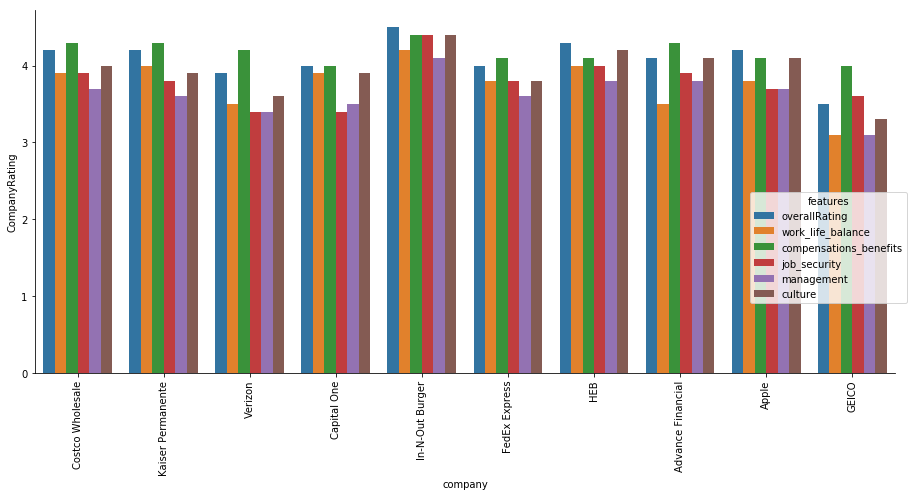

In [14]:
profiles.head()
profiles_df = profiles[["company","overallRating","work_life_balance","compensations_benefits","job_security","management","culture"]]
#print(profiles_df)
# Plot bar graph of company profiles
profiles_melt = pd.melt(profiles_df, id_vars="company", var_name="features", value_name="CompanyRating")
#print(profiles_melt)

companyFeatures = sns.factorplot(x='company', y='CompanyRating', hue='features', 
                                 data=profiles_melt, kind='bar',legend=True,size = 7,aspect = 1.5)
companyFeatures.set_xticklabels(rotation=90)
#companyFeatures.ax.legend(loc=1)
#sns.factorplot("features", "CompanyRating", col="company", data=profiles_melt, kind="bar")
plt.tight_layout()
plt.savefig('fig100.png', format='png', dpi=300)

In [15]:
# Create dataframe with total review counts by company
countbyfirm = profiles.reviewCount
company = profiles.company
countbyfirm_df = pd.DataFrame( {'Company': company, 'Count': countbyfirm })

print(countbyfirm_df)


             Company  Count
0   Costco Wholesale   8517
1  Kaiser Permanente   8790
2            Verizon  22867
3        Capital One   7306
4    In-N-Out Burger   1461
5      FedEx Express   2097
6                HEB   5787
7  Advance Financial    592
8              Apple   7069
9              GEICO   3642


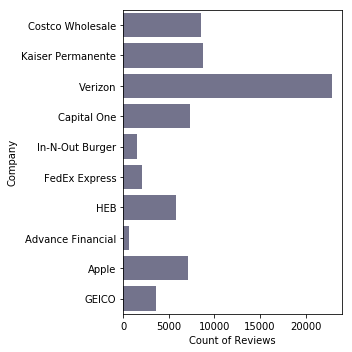

In [16]:
# Plot bar graph of review counts by company
plt.figure(figsize=(5,5))
reviewcounts_firm = sns.barplot(countbyfirm_df.Count, countbyfirm_df.Company, color="blue", saturation=0.1)
reviewcounts_firm.set(xlabel='Count of Reviews', ylabel='Company')
plt.tight_layout()
plt.savefig('fig101.png', format='png', dpi=300)

In [30]:
# Create dataframe with review counts by month 
countbymonth = reviews.month.value_counts()
print(countbymonth)
month = countbymonth.index


monthName = []
for m in month:
    mon = calendar.month_name[m]
    monthName.append(mon)
countbymonth_df = pd.DataFrame( {'Month': monthName, 'Count': countbymonth})
countbymonth_df




1     1529
2     1161
10    1065
9     1064
3      936
8      891
11     879
12     872
7      500
6      441
5      284
4      178
Name: month, dtype: int64


,Count,Month
1,1529,January
2,1161,February
10,1065,October
9,1064,September
3,936,March
8,891,August
11,879,November
12,872,December
7,500,July
6,441,June


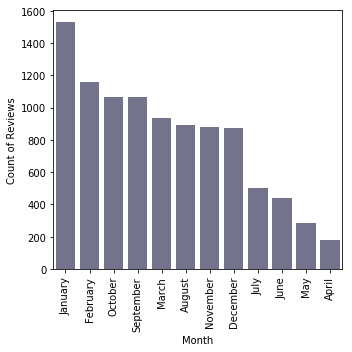

In [28]:
# Plot bar graph of review counts by month
plt.figure(figsize=(5,5))
reviewcounts_mth = sns.barplot(countbymonth_df.Month, countbymonth_df.Count, color="blue", saturation=0.1)
reviewcounts_mth.set_xticklabels(countbymonth_df.Month,rotation=90)
reviewcounts_mth.set(xlabel='Month', ylabel='Count of Reviews')

plt.tight_layout()
plt.savefig('fig102.png', format='png', dpi=300)

In [32]:
# Create dataframe with review counts by rating 
countbyrating = reviews.reviewRating.value_counts(sort = False)
print(countbyrating)
rating = countbyrating.index

countbyrating_df = pd.DataFrame({'ReviewRating': rating, 'Count': countbyrating})

5.0    4361
4.0    2854
3.0    1616
1.0     462
2.0     507
Name: reviewRating, dtype: int64


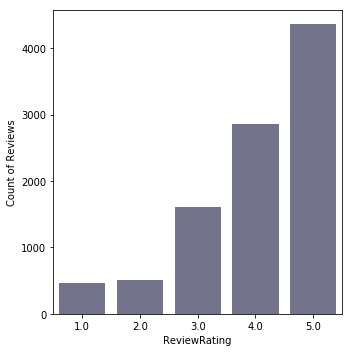

In [33]:
# Plot bar graph of review counts by rating
plt.figure(figsize=(5,5))
reviewcounts_rating = sns.barplot(countbyrating_df.ReviewRating, countbyrating_df.Count, color="blue", saturation=0.1)
reviewcounts_rating.set(xlabel='ReviewRating', ylabel='Count of Reviews')
plt.tight_layout()
plt.savefig('fig103.png', format='png', dpi=300)

In [34]:
# Create dataframe with average rating by company
avgbycompany = reviews.groupby('company').agg({'reviewRating': 'mean'}).sort_values('reviewRating', ascending = False)
avgbycompany_df = avgbycompany.reset_index()

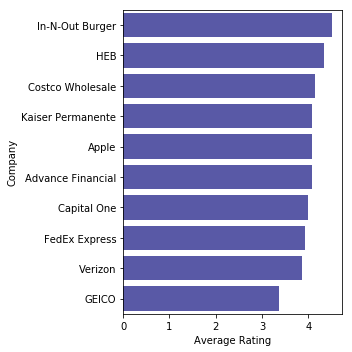

In [35]:
# Plot bar graph of average rating by company
plt.figure(figsize=(5,5))
avgrating_company = sns.barplot(avgbycompany_df.reviewRating, avgbycompany_df.company, color="blue", saturation=0.3)
avgrating_company.set(xlabel='Average Rating', ylabel='Company')
plt.tight_layout()
plt.savefig('fig104.png', format='png', dpi=300)

In [36]:
# Create dataframe with average rating by month
avgbymonth = reviews.groupby('month').agg({'reviewRating': 'mean'})
avgbymonth = avgbymonth.reset_index()

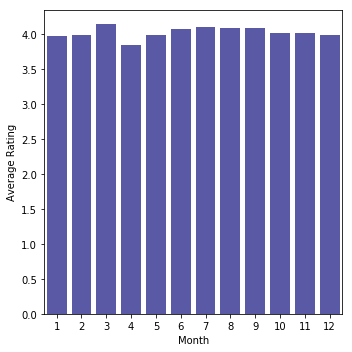

In [41]:
# Plot bar graph of average rating by month
plt.figure(figsize=(5,5))
avgrating_month = sns.barplot(avgbymonth.month, avgbymonth.reviewRating, color="blue", saturation=0.3)
avgrating_month.set(xlabel='Month', ylabel='Average Rating')
plt.tight_layout()
plt.savefig('fig105.png', format='png', dpi=300)

In [43]:
# Count monthly review rating below a score of 3 by company
HeatMonthComp_below3 = reviews.groupby(['company','month']).apply(lambda x: pd.Series(dict(
   negative =(x.reviewRating < 3).sum())))

    
print(HeatMonthComp_below3)
HeatMonthComp_below3 = HeatMonthComp_below3.reset_index()

                         negative
company           month          
Advance Financial 1             9
                  2             5
                  3             7
                  4             3
                  5             8
                  6             4
                  7             5
                  8             5
                  9             2
                  10            9
                  11            3
                  12            3
Apple             1            11
                  2             7
                  3             3
                  7             5
                  8            16
                  9             8
                  10           13
                  11           17
                  12            9
Capital One       1            16
                  2            14
                  3             3
                  7             3
                  8            16
                  9            18
              

month                1     2     3     4     5     6     7     8     9     10  \
company                                                                         
Advance Financial   9.0   5.0   7.0   3.0   8.0   4.0   5.0   5.0   2.0   9.0   
Apple              11.0   7.0   3.0   NaN   NaN   NaN   5.0  16.0   8.0  13.0   
Capital One        16.0  14.0   3.0   NaN   NaN   NaN   3.0  16.0  18.0  20.0   
Costco Wholesale   12.0  14.0   6.0   NaN   NaN   NaN   NaN   0.0   9.0  11.0   
FedEx Express      12.0   6.0  14.0   2.0   1.0   3.0   8.0   6.0  12.0  20.0   
GEICO              20.0  24.0  10.0  18.0  16.0  22.0  19.0  23.0  30.0  22.0   
HEB                 7.0   6.0   4.0   NaN   0.0   3.0   5.0   6.0   6.0   5.0   
In-N-Out Burger     1.0   1.0   0.0   3.0   1.0   1.0   2.0   2.0   4.0   3.0   
Kaiser Permanente  21.0  12.0  12.0   NaN   NaN   NaN   NaN   8.0   9.0  19.0   
Verizon            44.0  34.0  21.0   NaN   NaN   NaN   NaN   NaN   NaN   NaN   

month                11    

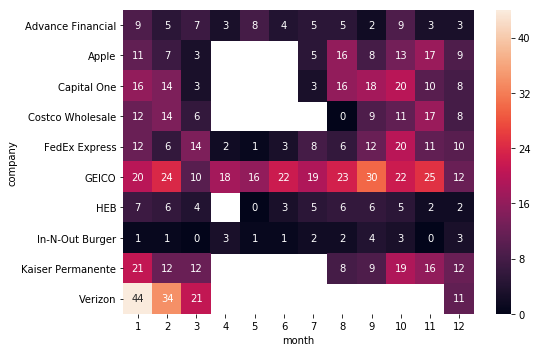

In [67]:
# Draw heatmap for monthly counts of negative reviews (rating < 3.0) by company
HeatMonthComp_below3_rect = HeatMonthComp_below3.pivot("company", "month", "negative")
print(HeatMonthComp_below3_rect)
plt.figure(figsize=(8,5))
sns.heatmap(HeatMonthComp_below3_rect, annot=True, fmt='g')
plt.tight_layout()
plt.savefig('fig107.png', format='png', dpi=300)

In [69]:
# Count monthly review rating above a score of 3 by company
HeatMonthComp_above3 = reviews.groupby(['company','month']).apply(lambda x: pd.Series(dict(
    positive =(x.reviewRating >= 3).sum())))
HeatMonthComp_above3 = HeatMonthComp_above3.reset_index()

month                 1      2      3     4     5      6      7      8   \
company                                                                   
Advance Financial   28.0   30.0   17.0   5.0  52.0   59.0   30.0   53.0   
Apple              145.0   86.0   70.0   NaN   NaN    NaN   21.0  128.0   
Capital One        114.0   81.0   99.0   NaN   NaN    NaN   54.0  153.0   
Costco Wholesale   192.0  113.0   96.0   NaN   NaN    NaN    NaN   21.0   
FedEx Express      170.0   78.0   87.0  43.0  53.0   37.0   57.0   74.0   
GEICO               73.0   43.0   27.0  51.0  62.0   89.0   74.0   81.0   
HEB                105.0   77.0   96.0   NaN   9.0  119.0  116.0  119.0   
In-N-Out Burger    100.0   93.0   71.0  53.0  82.0  104.0  101.0   92.0   
Kaiser Permanente  132.0  115.0  109.0   NaN   NaN    NaN    NaN   88.0   
Verizon            317.0  322.0  184.0   NaN   NaN    NaN    NaN    NaN   

month                 9      10     11     12  
company                                        
Adv

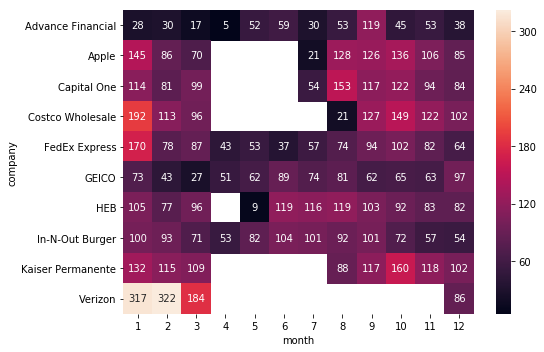

In [70]:
# Draw heatmap for monthly counts of positive reviews (rating > 3.0) by company
HeatMonthComp_above3_rect = HeatMonthComp_above3.pivot("company", "month", "positive")
print(HeatMonthComp_above3_rect)
plt.figure(figsize=(8,5))
sns.heatmap(HeatMonthComp_above3_rect, annot=True, fmt='g')
plt.tight_layout()
plt.savefig('fig108.png', format='png', dpi=300)

In [45]:
# below is the sentiment analysis code rewritten for sentence-level analysis
# note the new module -- word_tokenize!
import nltk.data
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk import sentiment
from nltk import word_tokenize

# Next, we initialize VADER so we can use it within our Python script
sid = SentimentIntensityAnalyzer()

# We will also initialize our 'english.pickle' function and give it a short name

tokenizer = nltk.data.load('tokenizers/punkt/english.pickle')

message_text = reviews["reviewTitle"] +' ' + reviews["comment"] + ' ' + reviews["pros"] + ' ' + reviews["cons"]
print(message_text[0])


list_sentence=[]
list_label =[]
for m in message_text:
    # The tokenize method breaks up the paragraph into a list of strings. 
    sentences = tokenizer.tokenize(m)

    # We add the additional step of iterating through the list of sentences and calculating 
    #and printing polarity scores for each one.
   
    for sentence in sentences:
        print(sentence)
        scores = sid.polarity_scores(sentence)
        print(scores)
        for key in sorted(scores):
                print('{0}: {1}, '.format(key, scores[key]), end='')
               
        if scores['compound'] >=0.5:
            list_sentence.append(sentence)
            list_label.append('positive')
        else:
            list_sentence.append(sentence)
            list_label.append('negative')
            
            
dict1={'sentence':list_sentence,
      'label' : list_label}

dict_df = pd.DataFrame(dict1)
print(dict_df)
        

C:\Users\payal\Anaconda3\lib\site-packages\nltk\twitter\__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


Company as a whole is great, but I didn’t like working for it. I worked in the deli, and that was the most stressful job I have ever had. I usually got stuck making the rotisserie chickens, and that was awful. Then on top of that, I had to close a lot. Closing routines took forever to complete and no one was willing to help. I usually got out 1-2 hours after my shift was supposed to be over. I tried several times to transfer to a different department with no luck. Great pay and benefits. Stressful work environment
Company as a whole is great, but I didn’t like working for it.
{'neg': 0.0, 'neu': 0.608, 'pos': 0.392, 'compound': 0.7003}
compound: 0.7003, neg: 0.0, neu: 0.608, pos: 0.392, I worked in the deli, and that was the most stressful job I have ever had.
{'neg': 0.217, 'neu': 0.783, 'pos': 0.0, 'compound': -0.5563}
compound: -0.5563, neg: 0.217, neu: 0.783, pos: 0.0, I usually got stuck making the rotisserie chickens, and that was awful.
{'neg': 0.357, 'neu': 0.643, 'pos': 0.0, '

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I was starting to stack the super visor rotations under my belt...i was on my way to becoming a manager and making even more.
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.5994}
compound: 0.5994, neg: 0.0, neu: 0.843, pos: 0.157, But I didn't realize how far away from home I was.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I didn't realize my mental health was slowly but surely declining.
{'neg': 0.0, 'neu': 0.7, 'pos': 0.3, 'compound': 0.5927}
compound: 0.5927, neg: 0.0, neu: 0.7, pos: 0.3, The stress of management, all the demands for perfection were wearing on me.
{'neg': 0.16, 'neu': 0.629, 'pos': 0.211, 'compound': 0.2263}
compound: 0.2263, neg: 0.16, neu: 0.629, pos: 0.211, Perhaps i wasn't ready for the job, and a manager mistakenly took a chance on me.
{'neg': 0.264, 'neu': 0.613, 'pos': 0.123, 'compound': -0.3204}
compound: -0.3204, neg: 0.264, neu: 0.613, pos: 0.123, I

{'neg': 0.183, 'neu': 0.817, 'pos': 0.0, 'compound': -0.7804}
compound: -0.7804, neg: 0.183, neu: 0.817, pos: 0.0, Almost as if I was punished for being a good worker but this is usual for most corporations.
{'neg': 0.111, 'neu': 0.78, 'pos': 0.109, 'compound': -0.0129}
compound: -0.0129, neg: 0.111, neu: 0.78, pos: 0.109, I was only getting like three hours a day plus the one 8 hour I got on the weekend.
{'neg': 0.0, 'neu': 0.848, 'pos': 0.152, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.848, pos: 0.152, Working six days as a student was not enjoyable.
{'neg': 0.256, 'neu': 0.744, 'pos': 0.0, 'compound': -0.3412}
compound: -0.3412, neg: 0.256, neu: 0.744, pos: 0.0, However, if you are looking for a job long-term and career-wise most of the older people working at the Costco I worked at disliked their job but and the benefits were the only reason why they enjoyed working at Costco the people that didn't have Good pay/ Benefits Rewards experience not hard work
{'neg': 0.075, 

compound: 0.5994, neg: 0.0, neu: 0.671, pos: 0.329, Always on your feet and ready to help our members whether it means lifting heavy objects into the back of their cars to even unloading return items.
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.828, pos: 0.172, What I have learned from Costco is the ability to enhance one's customer service skills to the next level.
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.3182}
compound: 0.3182, neg: 0.0, neu: 0.881, pos: 0.119, Becoming independent helped a lot on the job because it taught me to not always have to rely on management and coworkers.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Working here has also advanced my speech.
{'neg': 0.0, 'neu': 0.75, 'pos': 0.25, 'compound': 0.25}
compound: 0.25, neg: 0.0, neu: 0.75, pos: 0.25, As for management, they are constantly finding ways to improve productivity and safety.
{'neg': 0.

compound: 0.0772, neg: 0.0, neu: 0.942, pos: 0.058, Almost like some kind of fraternity.
{'neg': 0.0, 'neu': 0.694, 'pos': 0.306, 'compound': 0.2975}
compound: 0.2975, neg: 0.0, neu: 0.694, pos: 0.306, Managers and supervisors are rude and treat employees link mindless pawns.
{'neg': 0.355, 'neu': 0.482, 'pos': 0.163, 'compound': -0.4939}
compound: -0.4939, neg: 0.355, neu: 0.482, pos: 0.163, Employees feel under appreciated and work slowly on purpose because management does not accommodate them or explain situations politely.
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.845, pos: 0.155, some employees are scheduled up until midnight even though we close the store as late as 9pm.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, If you are just starting out.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, You will likely stay this late f

compound: 0.1779, neg: 0.095, neu: 0.779, pos: 0.126, Managers have become impersonal, rash, and unsympathetic....at least just one asst mngr.
{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.6124}
compound: -0.6124, neg: 0.333, neu: 0.667, pos: 0.0, has good roots, might rebound impersonal managers, cliques, favoritism
{'neg': 0.178, 'neu': 0.465, 'pos': 0.357, 'compound': 0.3182}
compound: 0.3182, neg: 0.178, neu: 0.465, pos: 0.357, Fun and Productive place with ping pong table The depot was a fun, efficient environment that sought to motivate and promote hard workers quickly and confidently.The management regularly updated you on your performance but was very positive and motivating about it.
{'neg': 0.023, 'neu': 0.603, 'pos': 0.374, 'compound': 0.9561}
compound: 0.9561, neg: 0.023, neu: 0.603, pos: 0.374, They gave compliments for good work, and were responsive to conversations of progressing in the company.
{'neg': 0.0, 'neu': 0.616, 'pos': 0.384, 'compound': 0.7964}
compo

compound: -0.3041, neg: 0.322, neu: 0.495, pos: 0.183, productive and a friendly environment CDS always provide good services and ideas on how to be creative with the products that costco sale.
{'neg': 0.0, 'neu': 0.679, 'pos': 0.321, 'compound': 0.8402}
compound: 0.8402, neg: 0.0, neu: 0.679, pos: 0.321, Costco has a very friendly enviroment for coworkers, you meet new people and make friends.
{'neg': 0.0, 'neu': 0.645, 'pos': 0.355, 'compound': 0.7645}
compound: 0.7645, neg: 0.0, neu: 0.645, pos: 0.355, free lunch short breaks
{'neg': 0.0, 'neu': 0.476, 'pos': 0.524, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.476, pos: 0.524, Not enough compensation for the job It was just another job that didn't pay enough for the things that they asked you to do.
{'neg': 0.0, 'neu': 0.947, 'pos': 0.053, 'compound': 0.0762}
compound: 0.0762, neg: 0.0, neu: 0.947, pos: 0.053, I never really approved of the supervisors and or managers that I worked with.
{'neg': 0.188, 'neu': 0.812, 'pos':

compound: -0.8519, neg: 0.437, neu: 0.563, pos: 0.0, and the managers who never worked a real day in there live cause they got there job from there relative who is a higher up and will never understand your struggle,.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Costco is a production line job.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, You are a number to them and nothing more.
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.0772}
compound: 0.0772, neg: 0.0, neu: 0.843, pos: 0.157, Benifits Members too many supervisors
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, productive good company to work for; Great benefits and pay, Family-oriented.
{'neg': 0.078, 'neu': 0.389, 'pos': 0.533, 'compound': 0.8481}
compound: 0.8481, neg: 0.078, neu: 0.389, pos: 0.533, However  some people on the Management team micro manage and do

compound: 0.8078, neg: 0.0, neu: 0.546, pos: 0.454, The company is extremely accommodating for those going to college.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros A little confusing at first
{'neg': 0.488, 'neu': 0.512, 'pos': 0.0, 'compound': -0.4228}
compound: -0.4228, neg: 0.488, neu: 0.512, pos: 0.0, seasonal job costco was an ok place to work.
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.296}
compound: 0.296, neg: 0.0, neu: 0.784, pos: 0.216, It was to political for me though.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I didn't kiss anyones rear and just went in and worked my tail off.
{'neg': 0.163, 'neu': 0.837, 'pos': 0.0, 'compound': -0.3252}
compound: -0.3252, neg: 0.163, neu: 0.837, pos: 0.0, Im a little disgruntled because i haven't heard from them, i was hired on seasonal but i thought i performed so we'll i would be hired on immediately but not 

{'neg': 0.0, 'neu': 0.572, 'pos': 0.428, 'compound': 0.7178}
compound: 0.7178, neg: 0.0, neu: 0.572, pos: 0.428, I learned a lot over the Costco.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, My supervisor taught me a lot when I worked over there.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Also, my coworkers are so friendly and nice to me and to each of our customers.
{'neg': 0.0, 'neu': 0.661, 'pos': 0.339, 'compound': 0.8009}
compound: 0.8009, neg: 0.0, neu: 0.661, pos: 0.339, They always show their best to our customers and the people around them.
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.741, pos: 0.259, Moreover, they are very happy each day and they affect me a lot.
{'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'compound': 0.6115}
compound: 0.6115, neg: 0.0, neu: 0.734, pos: 0.266, I am a shy person before, and I become an o

compound: -0.1027, neg: 0.149, neu: 0.851, pos: 0.0, Managers are kind, but will expect you to put in effort.
{'neg': 0.0, 'neu': 0.82, 'pos': 0.18, 'compound': 0.296}
compound: 0.296, neg: 0.0, neu: 0.82, pos: 0.18, Benifits are fantastic.
{'neg': 0.0, 'neu': 0.357, 'pos': 0.643, 'compound': 0.5574}
compound: 0.5574, neg: 0.0, neu: 0.357, pos: 0.643, Management is good at working around your schedule.
{'neg': 0.0, 'neu': 0.707, 'pos': 0.293, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.707, pos: 0.293, No Pros Be able to handle stressful environments
{'neg': 0.478, 'neu': 0.522, 'pos': 0.0, 'compound': -0.6705}
compound: -0.6705, neg: 0.478, neu: 0.522, pos: 0.0, cashier helper It was a great job.
{'neg': 0.0, 'neu': 0.381, 'pos': 0.619, 'compound': 0.7579}
compound: 0.7579, neg: 0.0, neu: 0.381, pos: 0.619, very fast paced and nice and busy.
{'neg': 0.0, 'neu': 0.682, 'pos': 0.318, 'compound': 0.4215}
compound: 0.4215, neg: 0.0, neu: 0.682, pos: 0.318, Not much down time wh

compound: 0.9583, neg: 0.0, neu: 0.655, pos: 0.345, The hardest part is keeping boxes stocked as members use them often but  the supervisors help with that as well so it makes it easier.
{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.872}
compound: 0.872, neg: 0.0, neu: 0.69, pos: 0.31, Nice break room and great employees and managers.
{'neg': 0.0, 'neu': 0.465, 'pos': 0.535, 'compound': 0.7845}
compound: 0.7845, neg: 0.0, neu: 0.465, pos: 0.535, overall its good
{'neg': 0.0, 'neu': 0.408, 'pos': 0.592, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.408, pos: 0.592, Front end I boxed groceries, helped customers put groceries in car, collected carts, helped cashiers count money.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Very organzied but not attentive since they locked me in there after closing time.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I had to call the 

compound: -0.7351, neg: 0.608, neu: 0.392, pos: 0.0, Good pay, good benefits Enjoyed my time there, hard work, depending on what department you are working, but they make sure you get breaks, and lunches.
{'neg': 0.075, 'neu': 0.59, 'pos': 0.335, 'compound': 0.8126}
compound: 0.8126, neg: 0.075, neu: 0.59, pos: 0.335, Usually worked 4-6 hours a day.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros The manager is racist
{'neg': 0.608, 'neu': 0.392, 'pos': 0.0, 'compound': -0.7351}
compound: -0.7351, neg: 0.608, neu: 0.392, pos: 0.0, Did not mind working here There was a lot of expectation for assistance in all areas of the workplace.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, You were not limited to explicitly your department.
{'neg': 0.0, 'neu': 0.808, 'pos': 0.192, 'compound': 0.1695}
compound: 0.1695, neg: 0.0, neu: 0.808, pos: 0.192, As far as management and supervisor p

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Some flexibility in schedule.
{'neg': 0.0, 'neu': 0.556, 'pos': 0.444, 'compound': 0.34}
compound: 0.34, neg: 0.0, neu: 0.556, pos: 0.444, No Pros Stressful work environment
{'neg': 0.647, 'neu': 0.353, 'pos': 0.0, 'compound': -0.6705}
compound: -0.6705, neg: 0.647, neu: 0.353, pos: 0.0, Costco Costco is a great place to work for.
{'neg': 0.0, 'neu': 0.631, 'pos': 0.369, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.631, pos: 0.369, I would definitely recommend other people if they needed employment to apply for Costco.
{'neg': 0.0, 'neu': 0.679, 'pos': 0.321, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.679, pos: 0.321, It is a very pleasant working environment and a growing company great benefits!
{'neg': 0.0, 'neu': 0.363, 'pos': 0.637, 'compound': 0.9059}
compound: 0.9059, neg: 0.0, neu: 0.363, pos: 0.637, No Pros Stressful work environment
{'neg': 0.647, 'neu': 0.353, 'pos': 0.0, 'compound': -0.6705}
compound: -0.6705

{'neg': 0.069, 'neu': 0.644, 'pos': 0.287, 'compound': 0.6597}
compound: 0.6597, neg: 0.069, neu: 0.644, pos: 0.287, Management was terrible Management was terrible.
{'neg': 0.608, 'neu': 0.392, 'pos': 0.0, 'compound': -0.7351}
compound: -0.7351, neg: 0.608, neu: 0.392, pos: 0.0, They do not care for employees or what you were hired for.
{'neg': 0.193, 'neu': 0.807, 'pos': 0.0, 'compound': -0.3875}
compound: -0.3875, neg: 0.193, neu: 0.807, pos: 0.0, I was put out on carts everyday in the hot hot heat or the cold cold rain.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, For hours on end, if you are young you will mostly be out on carts.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Minimum overtime
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, Fast paced work environment Very enjoyable work environment fast p

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, work environment Its a great environment and everyone is like family.
{'neg': 0.0, 'neu': 0.548, 'pos': 0.452, 'compound': 0.765}
compound: 0.765, neg: 0.0, neu: 0.548, pos: 0.452, A typical day would consist of a planed agenda.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Customer service would be the main focus and making sure they are in good hands.
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.714, pos: 0.286, No Pros balance
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, Great place to work Costco is a great place to work.
{'neg': 0.0, 'neu': 0.494, 'pos': 0.506, 'compound': 0.8481}
compound: 0.8481, neg: 0.0, neu: 0.494, pos: 0.506, Great management, good pay, great benefits and great people to work with.
{'neg': 0.056, 'neu': 0.238, 'pos': 0.706, 'compound': 0.9545}
c

compound: 0.4753, neg: 0.0, neu: 0.781, pos: 0.219, & do your best so you can be kept !
{'neg': 0.0, 'neu': 0.609, 'pos': 0.391, 'compound': 0.6696}
compound: 0.6696, neg: 0.0, neu: 0.609, pos: 0.391, No Pros Not a consistent schedule, late nights
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.268, neu: 0.732, pos: 0.0, Very corporate environment Dealing with the time clock is not fun.
{'neg': 0.213, 'neu': 0.787, 'pos': 0.0, 'compound': -0.4023}
compound: -0.4023, neg: 0.213, neu: 0.787, pos: 0.0, Helping patients is rewarding.
{'neg': 0.0, 'neu': 0.263, 'pos': 0.737, 'compound': 0.6808}
compound: 0.6808, neg: 0.0, neu: 0.263, pos: 0.737, The four manufacturers representatives help to train and to keep your license current.
{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.816, pos: 0.184, No Pros Not a consistent schedule, late nights
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.296}
compo

compound: 0.2023, neg: 0.25, neu: 0.395, pos: 0.355, Great people to work with at the stores.
{'neg': 0.0, 'neu': 0.631, 'pos': 0.369, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.631, pos: 0.369, No Pros Understaffed, low pay, and
{'neg': 0.655, 'neu': 0.345, 'pos': 0.0, 'compound': -0.5719}
compound: -0.5719, neg: 0.655, neu: 0.345, pos: 0.0, Excellent pay for Technicians, however terrible management Costco has the best pay and benefits you will ever find as a pharmacy technician.
{'neg': 0.188, 'neu': 0.478, 'pos': 0.334, 'compound': 0.765}
compound: 0.765, neg: 0.188, neu: 0.478, pos: 0.334, The schedule isn't bad and the pharmacy itself isn't terribly busy.
{'neg': 0.0, 'neu': 0.609, 'pos': 0.391, 'compound': 0.6979}
compound: 0.6979, neg: 0.0, neu: 0.609, pos: 0.391, Management is completely awful, and is the reason for the poor rating.
{'neg': 0.39, 'neu': 0.61, 'pos': 0.0, 'compound': -0.7501}
compound: -0.7501, neg: 0.39, neu: 0.61, pos: 0.0, The Pharmacy Manager not

compound: 0.0598, neg: 0.044, neu: 0.907, pos: 0.049, Busting out pans and dishes shouldn’t be part of a cashier or cook.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Coupons, benefits, change of positions abailabilitu Some eployees take long breaks that goes unnotice
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.833, pos: 0.167, Its Fast Paced but Cut throat business Typical day of work come in and receive all trucks planned out for the day, management will be looking over your work but, if you miss spell something on what is called a PMR even if its just a difference of a r and R you have to redo it.
{'neg': 0.083, 'neu': 0.917, 'pos': 0.0, 'compound': -0.5499}
compound: -0.5499, neg: 0.083, neu: 0.917, pos: 0.0, Good hours, good pay.
{'neg': 0.171, 'neu': 0.122, 'pos': 0.707, 'compound': 0.6597}
compound: 0.6597, neg: 0.171, neu: 0.122, pos: 0.707, Micromanaged, drama filled
{'neg

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Management is top notch, very friendly/empathetic/helping.
{'neg': 0.0, 'neu': 0.735, 'pos': 0.265, 'compound': 0.2023}
compound: 0.2023, neg: 0.0, neu: 0.735, pos: 0.265, benefits none
{'neg': 0.0, 'neu': 0.278, 'pos': 0.722, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.278, pos: 0.722, Productive work day I enjoyed working for Costco.
{'neg': 0.0, 'neu': 0.645, 'pos': 0.355, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.645, pos: 0.355, Costco is very fast paced and you learn many skills everyday.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I encourage anyone to apply.
{'neg': 0.0, 'neu': 0.476, 'pos': 0.524, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.476, pos: 0.524, The hardest part of the job would be to keep up with the fast paced environment, but if you are used to it then you will be fine.
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.296}


compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, My position is where the business needs me to be for productive operation.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, One day I could be on the register just ringing.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The next day I could be floating on the floor where they need me to be.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Its fun and exciting at the same time.
{'neg': 0.0, 'neu': 0.48, 'pos': 0.52, 'compound': 0.7579}
compound: 0.7579, neg: 0.0, neu: 0.48, pos: 0.52, I like to float around and be able to help and assist members of the things they need.Most enjoyable part of the job -- Since I am versatile and know other departments, I can be working on a different area of the warehouse.
{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.7964}
compound: 0.7964, neg: 0.0, n

compound: -0.2057, neg: 0.312, neu: 0.688, pos: 0.0, Older people seem disrespected I thought they’d appreciate my hard work yet never said a good work, which makes it hard to want to continue at that pace.
{'neg': 0.255, 'neu': 0.621, 'pos': 0.124, 'compound': -0.4949}
compound: -0.4949, neg: 0.255, neu: 0.621, pos: 0.124, Although the customers did seem to appreciate your hard work except a few where very demanding customers.
{'neg': 0.186, 'neu': 0.674, 'pos': 0.14, 'compound': 0.0276}
compound: 0.0276, neg: 0.186, neu: 0.674, pos: 0.14, I feel a job is not just financial and it’s best to appreciate your employees and makes you want to stay and continue to work hard.
{'neg': 0.047, 'neu': 0.676, 'pos': 0.277, 'compound': 0.7783}
compound: 0.7783, neg: 0.047, neu: 0.676, pos: 0.277, What’s behind their logic.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Very disappointed at the disrespectful attitude of management.
{'neg': 0.326, 

compound: 0.0772, neg: 0.16, neu: 0.711, pos: 0.129, a day at costco A typical day in the kitchen would be doing the dishes, preparing the pizzas also serving people.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, It is a non stop job.
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.355, neu: 0.645, pos: 0.0, The hardest part would be when it was only two workers and the dishes needed to be cleans and pizzas needed to be made but someone had to sit up front the whole time No Pros Hard to get days off, easy to get write ups as a cashier, scheduling is based off seniority
{'neg': 0.076, 'neu': 0.858, 'pos': 0.066, 'compound': 0.1154}
compound: 0.1154, neg: 0.076, neu: 0.858, pos: 0.066, Fair paying job Decently paid employees.. good work environment.
{'neg': 0.0, 'neu': 0.574, 'pos': 0.426, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.574, pos: 0.426, I would reccomend this job to a young 

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I think that Costco is a very intense and fast pace working environment that provide unlimited opportunities for growth for each and every employee.
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.6997}
compound: 0.6997, neg: 0.0, neu: 0.737, pos: 0.263, Management does have an open door policy or any questions or concerns as needed.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The hardest part of the job is probably dealing with member complaints.
{'neg': 0.197, 'neu': 0.803, 'pos': 0.0, 'compound': -0.4019}
compound: -0.4019, neg: 0.197, neu: 0.803, pos: 0.0, The most enjoyable part of the job is meeting benchmarks goals and serving to customer satisfaction.
{'neg': 0.0, 'neu': 0.697, 'pos': 0.303, 'compound': 0.7264}
compound: 0.7264, neg: 0.0, neu: 0.697, pos: 0.303, Benefits for Employees Set Schedules
{'neg': 0.0, 'neu': 0.606, 'pos': 0.394, 'compound': 0.3818}
compound: 0.38

compound: 0.3612, neg: 0.0, neu: 0.667, pos: 0.333, no discounts not even for emplyee
{'neg': 0.306, 'neu': 0.694, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.306, neu: 0.694, pos: 0.0, flexible It was a great job.
{'neg': 0.0, 'neu': 0.333, 'pos': 0.667, 'compound': 0.7184}
compound: 0.7184, neg: 0.0, neu: 0.333, pos: 0.667, It was a helpful job while also going to school.
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.4215}
compound: 0.4215, neg: 0.0, neu: 0.741, pos: 0.259, Hours are great.
{'neg': 0.0, 'neu': 0.328, 'pos': 0.672, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.328, pos: 0.672, You get to learn various departments.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The people are awesome.
{'neg': 0.0, 'neu': 0.423, 'pos': 0.577, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.423, pos: 0.577, Recommend No Pros no discounts not even for emplyee
{'neg': 0.341, 'neu': 0.465, 'pos': 0.194

{'neg': 0.0, 'neu': 0.517, 'pos': 0.483, 'compound': 0.4215}
compound: 0.4215, neg: 0.0, neu: 0.517, pos: 0.483, it was  NICE place to work impeccable benefits.fast paceda good place to work as a young adult.
{'neg': 0.0, 'neu': 0.685, 'pos': 0.315, 'compound': 0.7531}
compound: 0.7531, neg: 0.0, neu: 0.685, pos: 0.315, Learned a bit about trade and merchadising.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I realized if I had one day decided to become an optometrist I can go to school for it and get certified then become an optometrist in the company.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, benefits competitive hours
{'neg': 0.0, 'neu': 0.189, 'pos': 0.811, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.189, pos: 0.811, Costco performance The first thing as soon as you get to work you put on your vest then your badge and make sure you're papare to have a pen on site

compound: 0.3612, neg: 0.326, neu: 0.0, pos: 0.674, management culture is emotionally abusive
{'neg': 0.512, 'neu': 0.488, 'pos': 0.0, 'compound': -0.6369}
compound: -0.6369, neg: 0.512, neu: 0.488, pos: 0.0, Constant moving and staying busy My work experience at Costco was good.
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.791, pos: 0.209, There is always something to do, never boring, and the managers make sure of it.
{'neg': 0.0, 'neu': 0.753, 'pos': 0.247, 'compound': 0.5043}
compound: 0.5043, neg: 0.0, neu: 0.753, pos: 0.247, It is very physical and it is important to use proper body mechanics when lifting and moving things.
{'neg': 0.0, 'neu': 0.904, 'pos': 0.096, 'compound': 0.2023}
compound: 0.2023, neg: 0.0, neu: 0.904, pos: 0.096, Health benefits, stocks, and 401K Management organization and the fluctuation in hours and days worked
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0

compound: 0.1779, neg: 0.0, neu: 0.0, pos: 1.0, productive not much room for growth in my position (special skilled maintenance) required more responsibility with same pay ... the stress levels in retail are over the top No Pros Favoritism
{'neg': 0.171, 'neu': 0.667, 'pos': 0.163, 'compound': -0.0772}
compound: -0.0772, neg: 0.171, neu: 0.667, pos: 0.163, It was ok It was ok, just didn't have the room for me there.
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.5267}
compound: 0.5267, neg: 0.0, neu: 0.732, pos: 0.268, The hours were fine and the people were good.
{'neg': 0.0, 'neu': 0.598, 'pos': 0.402, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.598, pos: 0.402, It was very ok at best.
{'neg': 0.0, 'neu': 0.365, 'pos': 0.635, 'compound': 0.788}
compound: 0.788, neg: 0.0, neu: 0.365, pos: 0.635, I don't know how much more you want me to write.
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.1477}
compound: 0.1477, neg: 0.0, neu: 0.851, pos: 0.149, Nice people

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, It is a team environment where people pitch in to help each other out in different departments as needed.
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.863, pos: 0.137, The hardest part of the job is actually getting hired on after the season.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The most enjoyable part was the friendly atmosphere.
{'neg': 0.0, 'neu': 0.484, 'pos': 0.516, 'compound': 0.7501}
compound: 0.7501, neg: 0.0, neu: 0.484, pos: 0.516, Free membership, higher pay for Sundays Mandatory breaks, huge variation in hours, no opportunities to stay
{'neg': 0.156, 'neu': 0.433, 'pos': 0.411, 'compound': 0.7096}
compound: 0.7096, neg: 0.156, neu: 0.433, pos: 0.411, job experience safe, steady, collaborative, cooperative, good paying, nice business.
{'neg': 0.0, 'neu': 0.449, 'pos': 0.551, 'compound': 0.8225}
compound: 0.8225, neg: 0.

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Little customer service No Pros Racial profiling, competition for positions, and terrible managers.
{'neg': 0.314, 'neu': 0.686, 'pos': 0.0, 'compound': -0.617}
compound: -0.617, neg: 0.314, neu: 0.686, pos: 0.0, Wonderful Costco is a fast paced working condition.
{'neg': 0.0, 'neu': 0.619, 'pos': 0.381, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.619, pos: 0.381, They take care of all of their employees and they really make working there a wonderful thing.
{'neg': 0.0, 'neu': 0.67, 'pos': 0.33, 'compound': 0.7845}
compound: 0.7845, neg: 0.0, neu: 0.67, pos: 0.33, They pay their employees wonderfully also.
{'neg': 0.151, 'neu': 0.43, 'pos': 0.419, 'compound': 0.5423}
compound: 0.5423, neg: 0.151, neu: 0.43, pos: 0.419, Great pay, awesome benefits.
{'neg': 0.115, 'neu': 0.0, 'pos': 0.885, 'compound': 0.886}
compound: 0.886, neg: 0.115, neu: 0.0, pos: 0.885, Busy holiday seasons.
{'neg': 0.0, 'neu': 0.426, 'pos': 0.574, 'compound': 

compound: 0.5423, neg: 0.0, neu: 0.829, pos: 0.171, Managers were indifferent, often left work on the shift for coffee and food.
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.2023}
compound: -0.2023, neg: 0.13, neu: 0.87, pos: 0.0, My experience is not like most, but you should be prepared for anything when going to work in the warehouses.
{'neg': 0.071, 'neu': 0.822, 'pos': 0.107, 'compound': 0.2011}
compound: 0.2011, neg: 0.071, neu: 0.822, pos: 0.107, No Pros Extremely busy on the weekends
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.268, neu: 0.732, pos: 0.0, fast paced, diverse work environment Good pay/benefits, room for advancement, relocation options, fast paced work environment, once in a while you get a nasty customer but thats with any customer service job No Pros Extremely busy on the weekends
{'neg': 0.124, 'neu': 0.828, 'pos': 0.048, 'compound': -0.4854}
compound: -0.4854, neg: 0.124, neu: 0.828, pos: 0.048, Fun workplace w

compound: -0.7125, neg: 0.162, neu: 0.755, pos: 0.083, Fun place to work I would recommend this company to anyone looking to advance in their career.
{'neg': 0.0, 'neu': 0.707, 'pos': 0.293, 'compound': 0.7003}
compound: 0.7003, neg: 0.0, neu: 0.707, pos: 0.293, To make a decent salary this is the place.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Kaiser Permanente is the place to retire from.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, competitve salary career advancement
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Fast paced atmosphere with friendly staff I enjoy learning new operating procedures and meeting new people.
{'neg': 0.0, 'neu': 0.67, 'pos': 0.33, 'compound': 0.7506}
compound: 0.7506, neg: 0.0, neu: 0.67, pos: 0.33, The staff at Kaiser are very helpful and always willing to assist.
{'neg': 0.0, 'neu': 0.781, 'p

compound: -0.0516, neg: 0.216, neu: 0.588, pos: 0.196, Great place to work at Management is great!
{'neg': 0.0, 'neu': 0.414, 'pos': 0.586, 'compound': 0.8588}
compound: 0.8588, neg: 0.0, neu: 0.414, pos: 0.586, I was able to work without supervision and I always do 110% job at this company.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Did 3 different positions when I was there working as a contractor and I loved it!
{'neg': 0.0, 'neu': 0.724, 'pos': 0.276, 'compound': 0.636}
compound: 0.636, neg: 0.0, neu: 0.724, pos: 0.276, No micromanagement Salary is not all that great
{'neg': 0.478, 'neu': 0.522, 'pos': 0.0, 'compound': -0.6698}
compound: -0.6698, neg: 0.478, neu: 0.522, pos: 0.0, One of the best places to work Kaiser takes care of their employees.
{'neg': 0.0, 'neu': 0.598, 'pos': 0.402, 'compound': 0.8126}
compound: 0.8126, neg: 0.0, neu: 0.598, pos: 0.402, They are focused on making sure that the community they serve and the

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Kaiser Permanente emergency room Working in the emergency room at Kaiser can be challenging, a typical workday the registration discharge and ordering of labs for lease 52 to 75 patients per day are normal.
{'neg': 0.141, 'neu': 0.815, 'pos': 0.043, 'compound': -0.5574}
compound: -0.5574, neg: 0.141, neu: 0.815, pos: 0.043, Management oversees the process and offers any assistance necessary for the employees to do their job.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The hardest part of the day is when overcrowding of the emergency room takes place, which is often, lack of beds nurses makes life challenging and stressful, but everyone buckled down to achieve the goals at hand.
{'neg': 0.13, 'neu': 0.741, 'pos': 0.13, 'compound': 0.25}
compound: 0.25, neg: 0.13, neu: 0.741, pos: 0.13, I find it soothing that we have a group of people that work together to get the job done daily.
{'neg': 

{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.69, pos: 0.31, Would like an opertunity to work................ I’m working still but planing to move to Sacramento area ,just process house I’m looking something clouse .
{'neg': 0.0, 'neu': 0.926, 'pos': 0.074, 'compound': 0.1901}
compound: 0.1901, neg: 0.0, neu: 0.926, pos: 0.074, Good place to work and balance.
{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.633, pos: 0.367, Very good place to work.
{'neg': 0.0, 'neu': 0.556, 'pos': 0.444, 'compound': 0.4927}
compound: 0.4927, neg: 0.0, neu: 0.556, pos: 0.444, Good wages, ability to further education, equal opertunity .
{'neg': 0.0, 'neu': 0.536, 'pos': 0.464, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.536, pos: 0.464, Good money.
{'neg': 0.0, 'neu': 0.256, 'pos': 0.744, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.256, pos: 0.744, No break
{'neg': 0.688, 'neu': 0.312, '

compound: -0.296, neg: 0.216, neu: 0.784, pos: 0.0, productive draw blood in the lab 9-6 with three breaks.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, running samples to the lab for testing.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, employees are helpful and nice.
{'neg': 0.0, 'neu': 0.349, 'pos': 0.651, 'compound': 0.6808}
compound: 0.6808, neg: 0.0, neu: 0.349, pos: 0.651, good work environment.
{'neg': 0.0, 'neu': 0.408, 'pos': 0.592, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.408, pos: 0.592, the long amounts of standing i the hardest part of the job.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros no regulat coke products
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.5267}
compound: -0.5267, neg: 0.524, neu: 0.476, pos: 0.0, love working at kaiser I love working here at Kaiser.
{'neg': 0.0,

compound: -0.6705, neg: 0.316, neu: 0.606, pos: 0.078, Too many initiates are passed down from multiple departments that often overlap and make more work for staff and managers without ever solving the core issues.
{'neg': 0.075, 'neu': 0.925, 'pos': 0.0, 'compound': -0.2584}
compound: -0.2584, neg: 0.075, neu: 0.925, pos: 0.0, Example: Every employee was recently required to attend offsite service immersion sessions.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, During these sessions, so many providers were out of the office at one time (repeatedly for every location) that patient care and access was impacted.
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.882, pos: 0.118, Benefits Upper management promoted from medical field, they need true managers, not doctors and nurses, in charge.
{'neg': 0.0, 'neu': 0.631, 'pos': 0.369, 'compound': 0.802}
compound: 0.802, neg: 0.0, neu: 0.631, p

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Not recommend No Pros learn to listen to your employees
{'neg': 0.176, 'neu': 0.667, 'pos': 0.157, 'compound': -0.0572}
compound: -0.0572, neg: 0.176, neu: 0.667, pos: 0.157, Great Team I really enjoyed working as a Part-Time Lab Assistant 1 at Kaiser Simi Valley.
{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.8268}
compound: 0.8268, neg: 0.0, neu: 0.588, pos: 0.412, The staff was great and extremely supportive.
{'neg': 0.0, 'neu': 0.431, 'pos': 0.569, 'compound': 0.7645}
compound: 0.7645, neg: 0.0, neu: 0.431, pos: 0.569, The management was also very helpful and had an "open door policy."
{'neg': 0.0, 'neu': 0.781, 'pos': 0.219, 'compound': 0.4754}
compound: 0.4754, neg: 0.0, neu: 0.781, pos: 0.219, Great environment None
{'neg': 0.0, 'neu': 0.328, 'pos': 0.672, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.328, pos: 0.672, gone downhill Once a great company, now it's not.
{'neg': 0.0, 'neu': 0.631, 'pos': 0.369, 'compound'

compound: 0.25, neg: 0.346, neu: 0.231, pos: 0.423, large integrated health system A large enough health system that progressing to different care areas was possible.
{'neg': 0.0, 'neu': 0.824, 'pos': 0.176, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.824, pos: 0.176, An integrated health system which allowed for easy access to all levels of care and an integrated health record.The most enjoyable part of the job was the team of nurses I worked with.
{'neg': 0.0, 'neu': 0.757, 'pos': 0.243, 'compound': 0.8516}
compound: 0.8516, neg: 0.0, neu: 0.757, pos: 0.243, union, electronic health record drama, poor management
{'neg': 0.341, 'neu': 0.659, 'pos': 0.0, 'compound': -0.4767}
compound: -0.4767, neg: 0.341, neu: 0.659, pos: 0.0, Only worked two years Worked mostly weekend shift and don't have much exposure with most staffing so unable to establish exposure and experience and its not fair for me to comment No Pros drama, poor management
{'neg': 0.18, 'neu': 0.82, 'pos': 0.0, 'c

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Great Learning Environment I am currently a volunteer and I am able to work with a lot of knowledgeable people.
{'neg': 0.0, 'neu': 0.785, 'pos': 0.215, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.785, pos: 0.215, We are able to work in certain parts of the hospital that interests us.
{'neg': 0.0, 'neu': 0.745, 'pos': 0.255, 'compound': 0.4767}
compound: 0.4767, neg: 0.0, neu: 0.745, pos: 0.255, We learn and do so much in this program.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I would recommend it to people who are looking to join the medical field and want to have a feel for what your getting in to and what is expected to work in a hospital or certain doctors preferences.
{'neg': 0.0, 'neu': 0.798, 'pos': 0.202, 'compound': 0.7269}
compound: 0.7269, neg: 0.0, neu: 0.798, pos: 0.202, flexible, discounts some locations have set hours
{'neg': 0.0, 'neu': 0.759, 'pos': 0.241, '

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Fun and Productive Ready to be the best employee I can be in any role given to me.
{'neg': 0.0, 'neu': 0.583, 'pos': 0.417, 'compound': 0.875}
compound: 0.875, neg: 0.0, neu: 0.583, pos: 0.417, Kaiser is a joyous company to work for as long as you know the right people and respect the Physicians.
{'neg': 0.0, 'neu': 0.702, 'pos': 0.298, 'compound': 0.802}
compound: 0.802, neg: 0.0, neu: 0.702, pos: 0.298, No Pros at least needs to be certified in some kind of medical profession to get hired
{'neg': 0.121, 'neu': 0.879, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.121, neu: 0.879, pos: 0.0, Volunteer Loved working here to gain experience in the workforce.
{'neg': 0.0, 'neu': 0.523, 'pos': 0.477, 'compound': 0.8074}
compound: 0.8074, neg: 0.0, neu: 0.523, pos: 0.477, this was my very first job in high school and i didn't want to leave when my shift ended.
{'neg': 0.067, 'neu': 0.871, 'pos': 0.062, 'compound': -0.0191}
compound: -0.

{'neg': 0.269, 'neu': 0.585, 'pos': 0.146, 'compound': -0.2732}
compound: -0.2732, neg: 0.269, neu: 0.585, pos: 0.146, walking groups Kaiser has walking Groups that walk around the block at lunch time and yoga groups that happend in the Ensenada building.
{'neg': 0.116, 'neu': 0.884, 'pos': 0.0, 'compound': -0.4404}
compound: -0.4404, neg: 0.116, neu: 0.884, pos: 0.0, We also have a Farmers Market in front of the Hacienda Building.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, you stay active none
{'neg': 0.0, 'neu': 0.526, 'pos': 0.474, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.526, pos: 0.474, Cold heartless place to work at too robotic and not a care in the world to their staff who are coming from the agency trying to make a name for themselves.
{'neg': 0.178, 'neu': 0.822, 'pos': 0.0, 'compound': -0.703}
compound: -0.703, neg: 0.178, neu: 0.822, pos: 0.0, Very cold place to work at.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.

compound: 0.8553, neg: 0.0, neu: 0.488, pos: 0.512, I learned from their online trainings and offerings given in the department.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Workplace culture was superior, treated as a professional and paid as such.
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.5423}
compound: 0.5423, neg: 0.0, neu: 0.741, pos: 0.259, Busy time were hard, but they were few.
{'neg': 0.146, 'neu': 0.854, 'pos': 0.0, 'compound': -0.0516}
compound: -0.0516, neg: 0.146, neu: 0.854, pos: 0.0, Most of the time I had enough to keep me busy but not crazy.Every day was enjoyable at Kaiser!
{'neg': 0.0, 'neu': 0.804, 'pos': 0.196, 'compound': 0.63}
compound: 0.63, neg: 0.0, neu: 0.804, pos: 0.196, No Pros Short Term
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, Good place I worked here for a few months.
{'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compoun

compound: -0.6124, neg: 0.417, neu: 0.583, pos: 0.0, Started out great but quickly went down hill I've always loved loved working for Kaiser until middle of 2018 when the interim president started.
{'neg': 0.0, 'neu': 0.613, 'pos': 0.387, 'compound': 0.9354}
compound: 0.9354, neg: 0.0, neu: 0.613, pos: 0.387, He laid off a bunch of people without notice, then expected those left to just figure out the work they left behind.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros too much stress for a health case company.
{'neg': 0.417, 'neu': 0.583, 'pos': 0.0, 'compound': -0.6124}
compound: -0.6124, neg: 0.417, neu: 0.583, pos: 0.0, Managers not well regulated Too little oversight on Human Resources side to oversee the manager's behavior.
{'neg': 0.108, 'neu': 0.892, 'pos': 0.0, 'compound': -0.2057}
compound: -0.2057, neg: 0.108, neu: 0.892, pos: 0.0, They seem too well shielded for their poor behavior and not accountable to make chan

compound: -0.296, neg: 0.121, neu: 0.879, pos: 0.0, Great culture I appreciate that this facilities encourages employees to share their opinions and speak freely.
{'neg': 0.0, 'neu': 0.403, 'pos': 0.597, 'compound': 0.93}
compound: 0.93, neg: 0.0, neu: 0.403, pos: 0.597, They are open to feedback and make a point to change things if needed.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Pay old building
{'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'compound': -0.1027}
compound: -0.1027, neg: 0.412, neu: 0.588, pos: 0.0, Great company to work for.
{'neg': 0.0, 'neu': 0.494, 'pos': 0.506, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.494, pos: 0.506, Great company to work for.
{'neg': 0.0, 'neu': 0.494, 'pos': 0.506, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.494, pos: 0.506, Friendly people, fast pace, room to grow.
{'neg': 0.0, 'neu': 0.652, 'pos': 0.348, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.652, pos

compound: 0.4215, neg: 0.0, neu: 0.682, pos: 0.318, Poor management, no leadership
{'neg': 0.726, 'neu': 0.274, 'pos': 0.0, 'compound': -0.6486}
compound: -0.6486, neg: 0.726, neu: 0.274, pos: 0.0, If you have kids run Work culture are like high school clicks, everything is based off who you know.
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.878, pos: 0.122, management suck and majority of people are temp .
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
compound: -0.4404, neg: 0.293, neu: 0.707, pos: 0.0, They dont care if your sick or have children paid no work life balane
{'neg': 0.425, 'neu': 0.575, 'pos': 0.0, 'compound': -0.798}
compound: -0.798, neg: 0.425, neu: 0.575, pos: 0.0, Not what you would expect Definitely favoritism among choosing Kaiser employees vs anyone from outside world; Enjoyed co-workers, they were very appreciative; Lots of 'rule-breaking'... Making a difference in a patient's life Micro-manageme

{'neg': 0.0, 'neu': 0.746, 'pos': 0.254, 'compound': 0.5267}
compound: 0.5267, neg: 0.0, neu: 0.746, pos: 0.254, Good pay Not a lot of concern for workers
{'neg': 0.136, 'neu': 0.583, 'pos': 0.282, 'compound': 0.3612}
compound: 0.3612, neg: 0.136, neu: 0.583, pos: 0.282, stressful but great people to work with Call center work that focuses on health care teaches billing and medical plansdecent management, relatively new people great coworkersdecent paid holidays No Pros Not a lot of concern for workers
{'neg': 0.092, 'neu': 0.556, 'pos': 0.352, 'compound': 0.952}
compound: 0.952, neg: 0.092, neu: 0.556, pos: 0.352, Kaiser Kaiser is dedicated to serving its patients needs.
{'neg': 0.0, 'neu': 0.727, 'pos': 0.273, 'compound': 0.4588}
compound: 0.4588, neg: 0.0, neu: 0.727, pos: 0.273, Their motto is "Let's Thrive Together", and they mean it.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Their commitment to improving the quality of not 

compound: 0.6588, neg: 0.0, neu: 0.406, pos: 0.594, So many benefits to working at Kaiser Permanente...the pay and benefits are extremely competitive, and there are many opportunities to advance, change positions, and to relocate within the Kaiser system.
{'neg': 0.038, 'neu': 0.68, 'pos': 0.282, 'compound': 0.8381}
compound: 0.8381, neg: 0.038, neu: 0.68, pos: 0.282, Great pay and benefits; large HMO system provides opportunities to relocate Understaffing at times.
{'neg': 0.068, 'neu': 0.483, 'pos': 0.449, 'compound': 0.836}
compound: 0.836, neg: 0.068, neu: 0.483, pos: 0.449, Productive Kaiser is a great place to work, because they have a great ethic and good management.
{'neg': 0.0, 'neu': 0.519, 'pos': 0.481, 'compound': 0.9022}
compound: 0.9022, neg: 0.0, neu: 0.519, pos: 0.481, They have a great people, great doctors that they teach you the best of their knowledge.
{'neg': 0.0, 'neu': 0.492, 'pos': 0.508, 'compound': 0.9246}
compound: 0.9246, neg: 0.0, neu: 0.492, pos: 0.508, Th

compound: 0.3818, neg: 0.0, neu: 0.755, pos: 0.245, Productive and fun place to work Kaiser is a productive and fun place to work.
{'neg': 0.0, 'neu': 0.645, 'pos': 0.355, 'compound': 0.765}
compound: 0.765, neg: 0.0, neu: 0.645, pos: 0.355, Kaiser offers an extremely generous benefit and retirement package which makes it a very desirable company to work for.
{'neg': 0.0, 'neu': 0.613, 'pos': 0.387, 'compound': 0.8578}
compound: 0.8578, neg: 0.0, neu: 0.613, pos: 0.387, No Pros Culture
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, Great pay, not sure it's worth it.
{'neg': 0.415, 'neu': 0.247, 'pos': 0.338, 'compound': 0.2668}
compound: 0.2668, neg: 0.415, neu: 0.247, pos: 0.338, Management is awful.
{'neg': 0.6, 'neu': 0.4, 'pos': 0.0, 'compound': -0.4588}
compound: -0.4588, neg: 0.6, neu: 0.4, pos: 0.0, They don't care about their employees at all.
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.3875}
compound

compound: 0.0772, neg: 0.15, neu: 0.68, pos: 0.17, Pay is good but they truly make you work for it.
{'neg': 0.08, 'neu': 0.533, 'pos': 0.387, 'compound': 0.6808}
compound: 0.6808, neg: 0.08, neu: 0.533, pos: 0.387, No Pros very difficult to get into their organization
{'neg': 0.416, 'neu': 0.584, 'pos': 0.0, 'compound': -0.6115}
compound: -0.6115, neg: 0.416, neu: 0.584, pos: 0.0, Former interview for Manager of Spiritual Care The interview consisted of a panel from patient care services .It was was comprehensive, reflective and vision making.The interview highlighted my skills, experience and vision for developing a spiritual care program that would be integrated into the full patient care team approach.
{'neg': 0.0, 'neu': 0.68, 'pos': 0.32, 'compound': 0.9501}
compound: 0.9501, neg: 0.0, neu: 0.68, pos: 0.32, Great questions There were nonbe
{'neg': 0.0, 'neu': 0.494, 'pos': 0.506, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.494, pos: 0.506, Nice experience to work for Ka

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, It was a wonderful place to complete my hours to become a phlebotomist.
{'neg': 0.0, 'neu': 0.73, 'pos': 0.27, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.73, pos: 0.27, This was a great environment and the patients were so willing to let me poke them.
{'neg': 0.0, 'neu': 0.773, 'pos': 0.227, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.773, pos: 0.227, My ultimate goal will be to be employed by Kaiser.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Salaries and management
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.355, neu: 0.645, pos: 0.0, sterile processing employees were very helpful and they worked hard to make sure that i was knowledgeable in all fields.
{'neg': 0.061, 'neu': 0.702, 'pos': 0.237, 'compound': 0.6115}
compound: 0.6115, neg: 0.061, neu: 0.702, pos: 0.237, they made sure i understood the job and overl

compound: 0.6908, neg: 0.145, neu: 0.466, pos: 0.389, No Pros Machiavellian
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, Excellent expetience Kaiser taught me how to be an or nurse.
{'neg': 0.0, 'neu': 0.73, 'pos': 0.27, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.73, pos: 0.27, I loved this company and it’s atmosphere.
{'neg': 0.0, 'neu': 0.562, 'pos': 0.438, 'compound': 0.5994}
compound: 0.5994, neg: 0.0, neu: 0.562, pos: 0.438, I consider myself a kaiser nurse first.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Legacy second.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I miss the system and am working to return to it as soon as possible.
{'neg': 0.11, 'neu': 0.89, 'pos': 0.0, 'compound': -0.1531}
compound: -0.1531, neg: 0.11, neu: 0.89, pos: 0.0, Many.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Training was provided.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Too large and aversion to new technologies.
{'neg': 0.421, 'neu': 0.579, 'pos': 0.0, 'compound': -0.6249}
compound: -0.6249, neg: 0.421, neu: 0.579, pos: 0.0, Great Team Members I greatly enjoyed the team members at the Kaiser Rockville Regional Laboratory.
{'neg': 0.0, 'neu': 0.609, 'pos': 0.391, 'compound': 0.8268}
compound: 0.8268, neg: 0.0, neu: 0.609, pos: 0.391, The hours were flexible when .
{'neg': 0.0, 'neu': 0.678, 'pos': 0.322, 'compound': 0.2263}
compound: 0.2263, neg: 0.0, neu: 0.678, pos: 0.322, Everyone worked together to get the job done.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Celebrations throughout the year for helath awareness Union Pay for workers could be more competitive
{'neg': 0.085, 'neu': 0.793, 'pos': 0.122, 'compound': 0.1513}


{'neg': 0.0, 'neu': 0.355, 'pos': 0.645, 'compound': 0.8442}
compound: 0.8442, neg: 0.0, neu: 0.355, pos: 0.645, I would have loved to work there.
{'neg': 0.0, 'neu': 0.562, 'pos': 0.438, 'compound': 0.5994}
compound: 0.5994, neg: 0.0, neu: 0.562, pos: 0.438, No Pros missed lunches/breaks
{'neg': 0.688, 'neu': 0.312, 'pos': 0.0, 'compound': -0.5267}
compound: -0.5267, neg: 0.688, neu: 0.312, pos: 0.0, Productive and fun place I enjoyed working for Kaiser, even though I was a contractor.
{'neg': 0.0, 'neu': 0.602, 'pos': 0.398, 'compound': 0.765}
compound: 0.765, neg: 0.0, neu: 0.602, pos: 0.398, Nice environment to work.
{'neg': 0.0, 'neu': 0.517, 'pos': 0.483, 'compound': 0.4215}
compound: 0.4215, neg: 0.0, neu: 0.517, pos: 0.483, Lots of training and help, very friendly people.
{'neg': 0.0, 'neu': 0.492, 'pos': 0.508, 'compound': 0.7346}
compound: 0.7346, neg: 0.0, neu: 0.492, pos: 0.508, Good management.
{'neg': 0.0, 'neu': 0.256, 'pos': 0.744, 'compound': 0.4404}
compound: 0.4404, 

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Radiologists will confirm that the Ultrasound Images are completely done.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Lunch with our co workers are daily relief by sharing our meals and have conversations that everyone will enjoy and sometimes very educational and entertaining.
{'neg': 0.0, 'neu': 0.631, 'pos': 0.369, 'compound': 0.9055}
compound: 0.9055, neg: 0.0, neu: 0.631, pos: 0.369, Patience and perseverance is my daily virtue to follow.
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.4215}
compound: 0.4215, neg: 0.0, neu: 0.741, pos: 0.259, Honesty and know our rights and respect for our patients , colleagues and higher managements made me last 28 years of service and work in the same company.
{'neg': 0.0, 'neu': 0.799, 'pos': 0.201, 'compound': 0.743}
compound: 0.743, neg: 0.0, neu: 0.799, pos: 0.201, Free lunches, employee appreciation events every year.
{'neg': 0.0, 'neu

compound: 0.8126, neg: 0.057, neu: 0.696, pos: 0.247, In my decade there saw both great manager that develop and look after employees and others that for various reasons to not develop or promote.Overall very collaborative environment and consensus driven.weird mix of some pressure and quick pace, also mixed with some slow moving and more laid back aspects (mostly due to collaboration requirement).
{'neg': 0.038, 'neu': 0.892, 'pos': 0.07, 'compound': 0.4404}
compound: 0.4404, neg: 0.038, neu: 0.892, pos: 0.07, A lot of long time employees may not pull their weight with little impact to them, luckily many are retiring each year or moving on as jobs change.
{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.887, pos: 0.113, benefits, good company mission advancement path not clear
{'neg': 0.172, 'neu': 0.394, 'pos': 0.434, 'compound': 0.5132}
compound: 0.5132, neg: 0.172, neu: 0.394, pos: 0.434, work in progress Very busy as Kaiser of WA is g

compound: 0.7184, neg: 0.0, neu: 0.562, pos: 0.438, Kaiser is wonderful place to be an employee Distance
{'neg': 0.0, 'neu': 0.684, 'pos': 0.316, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.684, pos: 0.316, Remote Contract Technical Writer I love working here because I can use my writing and business analysis skills.
{'neg': 0.0, 'neu': 0.781, 'pos': 0.219, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.781, pos: 0.219, I much prefer remote work to driving an hour each way to do what I can easily do at home.
{'neg': 0.0, 'neu': 0.876, 'pos': 0.124, 'compound': 0.34}
compound: 0.34, neg: 0.0, neu: 0.876, pos: 0.124, Remote work, good pay No benefits for contractors, no job security
{'neg': 0.31, 'neu': 0.267, 'pos': 0.422, 'compound': 0.4767}
compound: 0.4767, neg: 0.31, neu: 0.267, pos: 0.422, Doctors are great They do pay well and the staffing MA, physicians I work with are great.
{'neg': 0.059, 'neu': 0.506, 'pos': 0.435, 'compound': 0.872}
compound: 0.872, neg: 0.

compound: 0.9413, neg: 0.0, neu: 0.503, pos: 0.497, Salary Union Dues
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, good benefits Been working for Kaiser for almost 20 years with plans of retiring from there.
{'neg': 0.0, 'neu': 0.718, 'pos': 0.282, 'compound': 0.6705}
compound: 0.6705, neg: 0.0, neu: 0.718, pos: 0.282, Good working environment in most areas.
{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.633, pos: 0.367, Friendly staff, helpful and communicative.
{'neg': 0.0, 'neu': 0.333, 'pos': 0.667, 'compound': 0.7184}
compound: 0.7184, neg: 0.0, neu: 0.333, pos: 0.667, good benefits and pay bad mgmt in some depts
{'neg': 0.318, 'neu': 0.325, 'pos': 0.357, 'compound': 0.1531}
compound: 0.1531, neg: 0.318, neu: 0.325, pos: 0.357, Proactive in Health Care, room for advancement Kaiser is great place to work , I would like to stay within the company only transfer to another avenue wit

{'neg': 0.538, 'neu': 0.462, 'pos': 0.0, 'compound': -0.5423}
compound: -0.5423, neg: 0.538, neu: 0.462, pos: 0.0, discrimination to continue for months.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, It seemed like the company was hiring people to fill in the holes and not hiring people that actually care about patient care.
{'neg': 0.0, 'neu': 0.692, 'pos': 0.308, 'compound': 0.836}
compound: 0.836, neg: 0.0, neu: 0.692, pos: 0.308, good pay and benefits too many immature people and gossiping
{'neg': 0.258, 'neu': 0.387, 'pos': 0.355, 'compound': 0.3612}
compound: 0.3612, neg: 0.258, neu: 0.387, pos: 0.355, Great Preventative healthcare Great pay and benefits.
{'neg': 0.092, 'neu': 0.197, 'pos': 0.711, 'compound': 0.886}
compound: 0.886, neg: 0.092, neu: 0.197, pos: 0.711, they are second to none in affordavility.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I have norhing else t

compound: 0.0258, neg: 0.094, neu: 0.809, pos: 0.098, during open season.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, A great employer Kaiser Permanente has provided me with excellent skills and trainings that is needed  in order to excel in Dental Assisting field.
{'neg': 0.0, 'neu': 0.649, 'pos': 0.351, 'compound': 0.8957}
compound: 0.8957, neg: 0.0, neu: 0.649, pos: 0.351, They care about their employees and provide excellent benefits.
{'neg': 0.0, 'neu': 0.387, 'pos': 0.613, 'compound': 0.8591}
compound: 0.8591, neg: 0.0, neu: 0.387, pos: 0.613, No Pros Very busy with long hr.
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.268, neu: 0.732, pos: 0.0, during open season.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Great People Here Working here is a great experience, everyone here works together well as a team, everyone is nice, and grea

compound: 0.6249, neg: 0.0, neu: 0.785, pos: 0.215, N/a Good place to work, be willing to wait several years before getting promoted within regardless of how much education or experience you have, unfortunately politics play a huge part.
{'neg': 0.065, 'neu': 0.652, 'pos': 0.283, 'compound': 0.7906}
compound: 0.7906, neg: 0.065, neu: 0.652, pos: 0.283, Pay and benefits Management and promoting within
{'neg': 0.133, 'neu': 0.381, 'pos': 0.486, 'compound': 0.5719}
compound: 0.5719, neg: 0.133, neu: 0.381, pos: 0.486, Kaiser Vallejo Rehab Kaiser is a great company to work for.
{'neg': 0.0, 'neu': 0.687, 'pos': 0.313, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.687, pos: 0.313, There are multiple opportunities for growth.
{'neg': 0.0, 'neu': 0.435, 'pos': 0.565, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.435, pos: 0.565, They provide classes and support for further education.
{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu

compound: 0.6705, neg: 0.0, neu: 0.645, pos: 0.355, If you don't mind kissing up, and being a "yes man/woman" you will do well.
{'neg': 0.159, 'neu': 0.585, 'pos': 0.255, 'compound': 0.2028}
compound: 0.2028, neg: 0.159, neu: 0.585, pos: 0.255, Benefits are the best I've had, but have declined year over year.
{'neg': 0.0, 'neu': 0.694, 'pos': 0.306, 'compound': 0.5267}
compound: 0.5267, neg: 0.0, neu: 0.694, pos: 0.306, Schedules don't lend to a healthy work/life balance.
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.3089}
compound: -0.3089, neg: 0.273, neu: 0.727, pos: 0.0, Benefits, people Work life balance, management
{'neg': 0.0, 'neu': 0.658, 'pos': 0.342, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.658, pos: 0.342, It's changed since I worked there.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, It's changed since I worked there.That's all I really have to say,  except maybe that I miss their benefits, and w

compound: -0.6705, neg: 0.379, neu: 0.621, pos: 0.0, Laguna Niguel store The work environment was very competitive and had awesome incentives when the store was ran the right way , but once the new district manager ,came in and pushed people away by transferring every to different store to change up the work place, everyone slowly quit or went to a different company like Sprint or at&t.
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.7874}
compound: 0.7874, neg: 0.0, neu: 0.856, pos: 0.144, Paid for lunches District manager favoritism
{'neg': 0.0, 'neu': 0.746, 'pos': 0.254, 'compound': 0.1779}
compound: 0.1779, neg: 0.0, neu: 0.746, pos: 0.254, Change Energizes Us (Still) Verizon is a great company to utilize your skills.
{'neg': 0.0, 'neu': 0.581, 'pos': 0.419, 'compound': 0.802}
compound: 0.802, neg: 0.0, neu: 0.581, pos: 0.419, For years now the company continues to evolve and change, requiring employees to change jobs with some to no notice, and potentially be without a job

compound: 0.6249, neg: 0.0, neu: 0.661, pos: 0.339, Verizon takes excellent care of its Employees from a benefit standpoint.
{'neg': 0.0, 'neu': 0.414, 'pos': 0.586, 'compound': 0.872}
compound: 0.872, neg: 0.0, neu: 0.414, pos: 0.586, Hard pressed to find a better overall benefits package.
{'neg': 0.118, 'neu': 0.42, 'pos': 0.462, 'compound': 0.6249}
compound: 0.6249, neg: 0.118, neu: 0.42, pos: 0.462, No Pros Departments Closing
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, Verizon was pretty good to me.
{'neg': 0.0, 'neu': 0.396, 'pos': 0.604, 'compound': 0.7269}
compound: 0.7269, neg: 0.0, neu: 0.396, pos: 0.604, I started working for Verizon as a sales representative back in 2014.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The commission was great.
{'neg': 0.0, 'neu': 0.423, 'pos': 0.577, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.423, pos: 0.577, 

compound: 0.4927, neg: 0.0, neu: 0.814, pos: 0.186, By the end of the day we would close out the register and count our sales and be ready for the next day.
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.898, pos: 0.102, Uncapped commison Chargebacks
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Hard Work Sales, hard work, long hours, very competitive.
{'neg': 0.259, 'neu': 0.556, 'pos': 0.185, 'compound': 0.0498}
compound: 0.0498, neg: 0.259, neu: 0.556, pos: 0.185, Work hard, play hard, earn lots of money.
{'neg': 0.275, 'neu': 0.49, 'pos': 0.235, 'compound': 0.1531}
compound: 0.1531, neg: 0.275, neu: 0.49, pos: 0.235, Lack of management communications.
{'neg': 0.434, 'neu': 0.566, 'pos': 0.0, 'compound': -0.3182}
compound: -0.3182, neg: 0.434, neu: 0.566, pos: 0.0, Very flexible with school schedule Commission Poor Management
{'neg': 0.275, 'neu': 0.531, 'pos': 0.194, 'compound': -0

{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.5423}
compound: 0.5423, neg: 0.0, neu: 0.844, pos: 0.156, Helped set up meeting rooms, organizing the awards & gifts, checking in guests & making sure award winners received their gifts.
{'neg': 0.0, 'neu': 0.558, 'pos': 0.442, 'compound': 0.8979}
compound: 0.8979, neg: 0.0, neu: 0.558, pos: 0.442, If any of our award winners had questions or needed additional assistance was there to help.
{'neg': 0.0, 'neu': 0.583, 'pos': 0.417, 'compound': 0.8519}
compound: 0.8519, neg: 0.0, neu: 0.583, pos: 0.417, This was something No Pros no breaks & past few years no overtime available
{'neg': 0.398, 'neu': 0.602, 'pos': 0.0, 'compound': -0.6808}
compound: -0.6808, neg: 0.398, neu: 0.602, pos: 0.0, Focused on savings but not its people Focused on savings but not its people.
{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.698, pos: 0.302, In recent years the company has lost directions.
{'neg': 0

compound: 0.4939, neg: 0.0, neu: 0.61, pos: 0.39, Great people, lots of opportunity Work-life balance can be hard, especially in IT
{'neg': 0.077, 'neu': 0.546, 'pos': 0.377, 'compound': 0.7579}
compound: 0.7579, neg: 0.077, neu: 0.546, pos: 0.377, Fun place to work I loved working with the team that I was with in Wisconsin.
{'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.802}
compound: 0.802, neg: 0.0, neu: 0.625, pos: 0.375, We had a lot of fun at work and it was like a big family.
{'neg': 0.0, 'neu': 0.655, 'pos': 0.345, 'compound': 0.7003}
compound: 0.7003, neg: 0.0, neu: 0.655, pos: 0.345, The hardest part of the job was not being able to have the weekends off because those were our peak time for sales.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, compensation, benefits, teamwork short breaks, work/life balance
{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.698, pos: 0.302

compound: -0.5023, neg: 0.098, neu: 0.865, pos: 0.037, Pay Everything else
{'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'compound': -0.1027}
compound: -0.1027, neg: 0.412, neu: 0.588, pos: 0.0, Verizon Great company benefits, tuition reimbursement and commission.
{'neg': 0.0, 'neu': 0.472, 'pos': 0.528, 'compound': 0.7717}
compound: 0.7717, neg: 0.0, neu: 0.472, pos: 0.528, Culture is what you make of it, if your preforming its good, if your not performing it may be more difficult.
{'neg': 0.113, 'neu': 0.769, 'pos': 0.117, 'compound': 0.0276}
compound: 0.0276, neg: 0.113, neu: 0.769, pos: 0.117, Benefits Management
{'neg': 0.0, 'neu': 0.278, 'pos': 0.722, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.278, pos: 0.722, What I learned I actually liked my job at Verizon.
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.4215}
compound: 0.4215, neg: 0.0, neu: 0.714, pos: 0.286, Yes I put in long hours but that was the job and I knew this when I applied for it.
{'neg': 0.0, 'neu':

compound: 0.6249, neg: 0.0, neu: 0.328, pos: 0.672, great benefits.
{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.7717}
compound: 0.7717, neg: 0.0, neu: 0.0, pos: 1.0, overall it was a great experience with a lot of learning opprtunities.
{'neg': 0.0, 'neu': 0.687, 'pos': 0.313, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.687, pos: 0.313, No Pros Too big at times and lack of career advancement
{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.5423}
compound: -0.5423, neg: 0.333, neu: 0.667, pos: 0.0, Great job opportunity for ambitious professional, busy workplace Had a good experience, responsibilities increased regularly for competent employees.
{'neg': 0.0, 'neu': 0.389, 'pos': 0.611, 'compound': 0.946}
compound: 0.946, neg: 0.0, neu: 0.389, pos: 0.611, Company invests in employees development.Advanced technologies are introduced and implemented No Pros Too big at times and lack of career advancement
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.5423}

compound: 0.7269, neg: 0.0, neu: 0.567, pos: 0.433, The compenation and salws trips are amazing.
{'neg': 0.0, 'neu': 0.612, 'pos': 0.388, 'compound': 0.5859}
compound: 0.5859, neg: 0.0, neu: 0.612, pos: 0.388, Goals are streatch but reachable in most cases.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Grest pay Hatf to find another company
{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.1027}
compound: -0.1027, neg: 0.189, neu: 0.811, pos: 0.0, N/a I have nothing to add in regards to Verizon Wireless.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, They are a large company, I enjoyed working the time I did.
{'neg': 0.0, 'neu': 0.708, 'pos': 0.292, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.708, pos: 0.292, I thank them for the opportunity to live in Alaska.
{'neg': 0.0, 'neu': 0.569, 'pos': 0.431, 'compound': 0.6486}
compound: 0.6486, neg: 0.0, neu: 0.569, pos: 0

{'neg': 0.0, 'neu': 0.623, 'pos': 0.377, 'compound': 0.8834}
compound: 0.8834, neg: 0.0, neu: 0.623, pos: 0.377, I am currently driving 40 mins out to work for Verizon by Victra an authorized retailer in Delano.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I am searching for something closer to home (Bakersfield).
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Commission structure Commission structure changing on us every month
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Not happy at all with there management Not happy with there management and work hours.
{'neg': 0.316, 'neu': 0.684, 'pos': 0.0, 'compound': -0.7181}
compound: -0.7181, neg: 0.316, neu: 0.684, pos: 0.0, The company has a high turn over rate for contract employee.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, A

compound: 0.4019, neg: 0.0, neu: 0.838, pos: 0.162, Training/Ongoing development training is fun.
{'neg': 0.0, 'neu': 0.548, 'pos': 0.452, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.548, pos: 0.452, High commission targets for managers.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No over time pay in fact half time after 40 hours.
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.3818}
compound: -0.3818, neg: 0.286, neu: 0.714, pos: 0.0, Great compensation and benefits Company offers great training opportunities for growth and advancement.
{'neg': 0.0, 'neu': 0.333, 'pos': 0.667, 'compound': 0.9432}
compound: 0.9432, neg: 0.0, neu: 0.333, pos: 0.667, In addition they have outstanding benefits and compensation.The employees are great to work with and extremely dedicated.
{'neg': 0.0, 'neu': 0.482, 'pos': 0.518, 'compound': 0.9324}
compound: 0.9324, neg: 0.0, neu: 0.482, pos: 0.518, Benefits and compensation Job secu

compound: 0.128, neg: 0.116, neu: 0.741, pos: 0.143, Fast pace environment Great benefits	Responsible for resolving customer issues regarding billing, products and services.
{'neg': 0.0, 'neu': 0.487, 'pos': 0.513, 'compound': 0.891}
compound: 0.891, neg: 0.0, neu: 0.487, pos: 0.513, Provide basic troubleshooting on service and equipment issues.
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.1779}
compound: 0.1779, neg: 0.0, neu: 0.805, pos: 0.195, Provide wireless solutions to best suit the needs of the customer.
{'neg': 0.0, 'neu': 0.604, 'pos': 0.396, 'compound': 0.7096}
compound: 0.7096, neg: 0.0, neu: 0.604, pos: 0.396, Adhere to structured schedules and shiftsProvide supervisor support to customer care representativesMaintain a positive and professional attitude while communicating effectively with customers No Pros Management seemed only interested in keeping their numbers up above an ever increasing level.
{'neg': 0.046, 'neu': 0.642, 'pos': 0.313, 'compound': 0.9169}
c

compound: -0.1546, neg: 0.14, neu: 0.756, pos: 0.105, They will make money by selling everything they can.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The problem with working for a company like Verizon is that everything is micro managed.
{'neg': 0.157, 'neu': 0.698, 'pos': 0.145, 'compound': -0.0516}
compound: -0.0516, neg: 0.157, neu: 0.698, pos: 0.145, They want you to sell so much that they may sway the truth from promotions oftenly and every rep has a different story when selling a service because it changes quickly due to their methods of selling.
{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.902, pos: 0.098, Good money as long as you sell Management is horrible, overworked
{'neg': 0.227, 'neu': 0.584, 'pos': 0.188, 'compound': -0.1531}
compound: -0.1531, neg: 0.227, neu: 0.584, pos: 0.188, Good company, well run, Good company, well run,   Focused too much on cost cutting.
{'

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Most recently we separated from 22,000 employees and there will be an additional 20,000 to leave in 2019.
{'neg': 0.066, 'neu': 0.934, 'pos': 0.0, 'compound': -0.0516}
compound: -0.0516, neg: 0.066, neu: 0.934, pos: 0.0, The culture is not good here and there is very little respect for work/life balance.
{'neg': 0.13, 'neu': 0.703, 'pos': 0.167, 'compound': 0.1728}
compound: 0.1728, neg: 0.13, neu: 0.703, pos: 0.167, I'm regularly called upon to work while on vacation or personal time.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Short Breaks
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, Verizon (MCI Global Relay) Providing telecommunication services for hearing & speech impaired clients was very rewarding.
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.5709}
compound: 0.5709, neg: 0.0, neu: 0.791, pos: 0.2

compound: 0.3818, neg: 0.0, neu: 0.729, pos: 0.271, Overall my time at Verizon as a manager and contractor was good.
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.775, pos: 0.225, No Pros no advancement
{'neg': 0.688, 'neu': 0.312, 'pos': 0.0, 'compound': -0.5267}
compound: -0.5267, neg: 0.688, neu: 0.312, pos: 0.0, Job Culture and life balance Working for Verizon you were able to communicate with customers who you as a person could relate to.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Connecting with the customers was an excellent way to meet their needs and provide great quality service.
{'neg': 0.0, 'neu': 0.658, 'pos': 0.342, 'compound': 0.8316}
compound: 0.8316, neg: 0.0, neu: 0.658, pos: 0.342, Flexible Schedule no advancement through the company
{'neg': 0.242, 'neu': 0.549, 'pos': 0.209, 'compound': -0.0772}
compound: -0.0772, neg: 0.242, neu: 0.549, pos: 0.209, Unique exper

compound: 0.8481, neg: 0.037, neu: 0.792, pos: 0.172, free lunches and yearly bonus constant reorgs
{'neg': 0.0, 'neu': 0.424, 'pos': 0.576, 'compound': 0.7783}
compound: 0.7783, neg: 0.0, neu: 0.424, pos: 0.576, Great Job Working for Verizon over the years I learned from a lot of different people.
{'neg': 0.0, 'neu': 0.76, 'pos': 0.24, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.76, pos: 0.24, Everyday we would meet in the morning to get our job details for the day.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, At the beginning of my career I was taught by the senior guys how to do my job more efficiently.As time went on I was able to pass the things I learned to the new guys.Verizon was a very good job.
{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'compound': 0.4927}
compound: 0.4927, neg: 0.0, neu: 0.919, pos: 0.081, Good pay and benefits Some time the hours were very long
{'neg': 0.094, 'neu': 0.537, 'pos': 0.369, 'compoun

{'neg': 0.0, 'neu': 0.575, 'pos': 0.425, 'compound': 0.6865}
compound: 0.6865, neg: 0.0, neu: 0.575, pos: 0.425, Salary, management team
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Productive Smart People but too many internal restructures Good place to work with bright people and good salaries.
{'neg': 0.0, 'neu': 0.511, 'pos': 0.489, 'compound': 0.9246}
compound: 0.9246, neg: 0.0, neu: 0.511, pos: 0.489, Tis company has so many re-orgs the company is constantly in transition which causes problems.
{'neg': 0.162, 'neu': 0.838, 'pos': 0.0, 'compound': -0.4019}
compound: -0.4019, neg: 0.162, neu: 0.838, pos: 0.0, No Pros
{'neg': 0.688, 'neu': 0.312, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.688, neu: 0.312, pos: 0.0, Great place to gain experience and training in technology and professionalism Work day consists of helping customers.
{'neg': 0.0, 'neu': 0.591, 'pos': 0.409, 'compound': 0.8658}
compound: 0.8658, neg: 0.

compound: -0.7351, neg: 0.228, neu: 0.772, pos: 0.0, If you don't sell enough they will not give you your commission check.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The most enjoyable part of the job was my coworkers.
{'neg': 0.0, 'neu': 0.738, 'pos': 0.262, 'compound': 0.4927}
compound: 0.4927, neg: 0.0, neu: 0.738, pos: 0.262, The job itself is not for the weak.
{'neg': 0.0, 'neu': 0.744, 'pos': 0.256, 'compound': 0.3412}
compound: 0.3412, neg: 0.0, neu: 0.744, pos: 0.256, Expect to be hounded on daily Can pay well if youre good at selling but most arent, easy to do job, hours are guaranteed to be around 40 Management, stressful to the max, easy to lose your commission check
{'neg': 0.314, 'neu': 0.618, 'pos': 0.068, 'compound': -0.9294}
compound: -0.9294, neg: 0.314, neu: 0.618, pos: 0.068, Productive and fun place to work I work there as a contractor.Management is good.I have learnt a lot and still learning great skills whic

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Fun at first but became more demanding Great place to work if you like sitting in a cubicle all day.
{'neg': 0.095, 'neu': 0.513, 'pos': 0.392, 'compound': 0.865}
compound: 0.865, neg: 0.095, neu: 0.513, pos: 0.392, It was to my personal preference to be in that type of environment all day.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I liked the people but I was not suited for that type of work.
{'neg': 0.0, 'neu': 0.853, 'pos': 0.147, 'compound': 0.2263}
compound: 0.2263, neg: 0.0, neu: 0.853, pos: 0.147, No Pros working with public
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.355, neu: 0.645, pos: 0.0, Fun place it was a good place to work, had great customers, pay was really good and i enjoyed working there.
{'neg': 0.045, 'neu': 0.417, 'pos': 0.538, 'compound': 0.9465}
compound: 0.9465, neg: 0.045, neu: 0.417, pos: 0.538, Bonuses were great as

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Comfortable20.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Integrity No Pros everything
{'neg': 0.324, 'neu': 0.294, 'pos': 0.382, 'compound': 0.1027}
compound: 0.1027, neg: 0.324, neu: 0.294, pos: 0.382, Productive Work Environment Great work environment.
{'neg': 0.0, 'neu': 0.549, 'pos': 0.451, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.549, pos: 0.451, Understandably unstable due to recent changes in wireless and tech industries.
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.3612}
compound: -0.3612, neg: 0.2, neu: 0.8, pos: 0.0, Struggling to adapt to being a mature market No Pros everything
{'neg': 0.338, 'neu': 0.473, 'pos': 0.189, 'compound': -0.296}
compound: -0.296, neg: 0.338, neu: 0.473, pos: 0.189, Wonderful experience I spent 20 years working my way up.
{'neg': 0.0, 'neu': 0.684, 'pos': 0.316, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.684, pos: 

compound: 0.4019, neg: 0.0, neu: 0.748, pos: 0.252, Once they took ownership they allowed us to continue to work as per set standards.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, They took the time to understand what and how we did our day to day functions.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Once they complied the information they returned with some suggestions on how they saw we could improve.
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.847, pos: 0.153, Great Healthcare company focus was on other divisions so it limited our prospects.
{'neg': 0.118, 'neu': 0.541, 'pos': 0.341, 'compound': 0.6275}
compound: 0.6275, neg: 0.118, neu: 0.541, pos: 0.341, Good Company Verizon is a good company to work for.
{'neg': 0.0, 'neu': 0.547, 'pos': 0.453, 'compound': 0.7003}
compound: 0.7003, neg: 0.0, neu: 0.547, pos: 0.453, They 

{'neg': 0.588, 'neu': 0.412, 'pos': 0.0, 'compound': -0.6908}
compound: -0.6908, neg: 0.588, neu: 0.412, pos: 0.0, I worked for VERIZON for 7 years and have experienced every dynamic possible.
{'neg': 0.0, 'neu': 0.794, 'pos': 0.206, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.794, pos: 0.206, In the past the compensation was worth the stress but now that the sales are saturated and stores are frequently closing it became evident that VERIZON does not care about their people.
{'neg': 0.149, 'neu': 0.81, 'pos': 0.041, 'compound': -0.5983}
compound: -0.5983, neg: 0.149, neu: 0.81, pos: 0.041, Hardwork and sacrifice is required to be successful but not appreciated.
{'neg': 0.238, 'neu': 0.602, 'pos': 0.161, 'compound': -0.2853}
compound: -0.2853, neg: 0.238, neu: 0.602, pos: 0.161, As a manager you have no defense or support, any day can be your last.
{'neg': 0.126, 'neu': 0.632, 'pos': 0.241, 'compound': 0.25}
compound: 0.25, neg: 0.126, neu: 0.632, pos: 0.241, With VERIZON th

compound: 0.296, neg: 0.0, neu: 0.476, pos: 0.524, This place is not at all what it seems after you make it out of training and the bow comes off.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, These people are SOOOO fake!
{'neg': 0.459, 'neu': 0.541, 'pos': 0.0, 'compound': -0.5255}
compound: -0.5255, neg: 0.459, neu: 0.541, pos: 0.0, Its actually funny.
{'neg': 0.0, 'neu': 0.408, 'pos': 0.592, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.408, pos: 0.592, They (management) talks ALOT about moving around, they make it seem so easy to do...its not.
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.5777}
compound: 0.5777, neg: 0.0, neu: 0.8, pos: 0.2, The people here are clicked up, managers and direct reports and they hang together around the job and during the events and gossip like high schoolers.
{'neg': 0.06, 'neu': 0.851, 'pos': 0.089, 'compound': 0.2023}
compound: 0.2023, neg: 0.06, neu: 0.851, pos: 0.089, Micromanagem

compound: 0.7579, neg: 0.139, neu: 0.348, pos: 0.512, Strong knowledge of the business ,technology and working hard is crucial to a successful career.
{'neg': 0.072, 'neu': 0.564, 'pos': 0.364, 'compound': 0.7717}
compound: 0.7717, neg: 0.072, neu: 0.564, pos: 0.364, No Pros Sales teams under too much pressure, not enough help/support.
{'neg': 0.328, 'neu': 0.672, 'pos': 0.0, 'compound': -0.5267}
compound: -0.5267, neg: 0.328, neu: 0.672, pos: 0.0, Great experience I never knew walking door to door could be so enlightening.
{'neg': 0.0, 'neu': 0.545, 'pos': 0.455, 'compound': 0.8534}
compound: 0.8534, neg: 0.0, neu: 0.545, pos: 0.455, This job offered me the chance to broaden my communicative skills and meet numerous people on the daily.
{'neg': 0.0, 'neu': 0.895, 'pos': 0.105, 'compound': 0.25}
compound: 0.25, neg: 0.0, neu: 0.895, pos: 0.105, They have excellent management and coaches that would train and roll play with staff to help employees get the best responses out of our  clien

compound: -0.7646, neg: 0.375, neu: 0.625, pos: 0.0, Scheduling could be flexible at times, but there was no PTO.
{'neg': 0.211, 'neu': 0.679, 'pos': 0.109, 'compound': -0.3291}
compound: -0.3291, neg: 0.211, neu: 0.679, pos: 0.109, No Pros long hrs, company lays off employees
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.239, neu: 0.761, pos: 0.0, Balance Verizon is a solid company with excellent benefits.
{'neg': 0.0, 'neu': 0.388, 'pos': 0.612, 'compound': 0.7845}
compound: 0.7845, neg: 0.0, neu: 0.388, pos: 0.612, Some expectations are unrealistic and decisions are sometimes made without consideration for front-line employees.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros long hrs, company lays off employees
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.239, neu: 0.761, pos: 0.0, no comments i only worked for verizon for only few weeks i got t

compound: 0.7269, neg: 0.054, neu: 0.656, pos: 0.29, solid leadership and exposure to new tech.
{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.1531}
compound: 0.1531, neg: 0.0, neu: 0.789, pos: 0.211, I like it here No Pros Bad upper management
{'neg': 0.432, 'neu': 0.379, 'pos': 0.189, 'compound': -0.4939}
compound: -0.4939, neg: 0.432, neu: 0.379, pos: 0.189, Call Center Agent I either monitored conference calls or set them up.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Sometimes I could be on a call for hours and other times just 30 minutes.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Setting up conference calls was typically in 30 min increments.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Bad upper management
{'neg': 0.655, 'neu': 0.345, 'pos': 0.0, 'compound': -0.6908}
compound: -0.6908, neg: 0.655, n

compound: 0.93, neg: 0.0, neu: 0.395, pos: 0.605, family like work environment.
{'neg': 0.0, 'neu': 0.545, 'pos': 0.455, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.545, pos: 0.455, it could get very busy and overwhelming during the holidays.
{'neg': 0.0, 'neu': 0.776, 'pos': 0.224, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.776, pos: 0.224, different call cues have a different type of work environment.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, the spanish cue was my favorite free coffee Not near resturants for lunch
{'neg': 0.0, 'neu': 0.636, 'pos': 0.364, 'compound': 0.743}
compound: 0.743, neg: 0.0, neu: 0.636, pos: 0.364, Call center With many departments,  training is usually 5 weeks depending on role management and everyone are so polite not one bad bone.
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.431}
compound: 0.431, neg: 0.0, neu: 0.881, pos: 0.119, They want feedback to better help you

compound: 0.7003, neg: 0.0, neu: 0.58, pos: 0.42, Always stay focused because you can mess up and it can cause you your job.
{'neg': 0.138, 'neu': 0.718, 'pos': 0.144, 'compound': 0.0258}
compound: 0.0258, neg: 0.138, neu: 0.718, pos: 0.144, It has good benefits and good pay No Pros Long hours
{'neg': 0.2, 'neu': 0.333, 'pos': 0.467, 'compound': 0.7003}
compound: 0.7003, neg: 0.2, neu: 0.333, pos: 0.467, Great place to work.
{'neg': 0.0, 'neu': 0.423, 'pos': 0.577, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.423, pos: 0.577, Great place to work; Benefits are very good; Facilities are top of the line; Good work life balance; Career Growth; Paid Training; Learn New Skills, Good Culture No Pros Long hours
{'neg': 0.049, 'neu': 0.508, 'pos': 0.444, 'compound': 0.9509}
compound: 0.9509, neg: 0.049, neu: 0.508, pos: 0.444, Fast-paced, challenging work!
{'neg': 0.0, 'neu': 0.514, 'pos': 0.486, 'compound': 0.2244}
compound: 0.2244, neg: 0.0, neu: 0.514, pos: 0.486, Many opportunitie

{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, The atmosphere at Capital One was very relaxing yet business focused.
{'neg': 0.0, 'neu': 0.596, 'pos': 0.404, 'compound': 0.7264}
compound: 0.7264, neg: 0.0, neu: 0.596, pos: 0.404, The normal workday at Capital One was always very predictable however rewarding.
{'neg': 0.0, 'neu': 0.75, 'pos': 0.25, 'compound': 0.5667}
compound: 0.5667, neg: 0.0, neu: 0.75, pos: 0.25, You come in there is a gym you can work out in while getting mind ready for work.
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.865, pos: 0.135, Breaks are sceheduled and you take your break when scheduled.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, They have an excellent cafe that is well known, You really do not need to leave to get something good to eat, food was always good, out balcony to eat on, TVs

compound: 0.8898, neg: 0.0, neu: 0.56, pos: 0.44, Although they claim to be schedule friendly to college students, I would say that is very limited to schedules available.
{'neg': 0.098, 'neu': 0.759, 'pos': 0.143, 'compound': 0.2516}
compound: 0.2516, neg: 0.098, neu: 0.759, pos: 0.143, Basically if the schedule you need is not available you're out of luck.
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.4588}
compound: 0.4588, neg: 0.0, neu: 0.8, pos: 0.2, No Pros competitive
{'neg': 0.449, 'neu': 0.204, 'pos': 0.347, 'compound': -0.128}
compound: -0.128, neg: 0.449, neu: 0.204, pos: 0.347, An excellent workplace Capital One really cares about its employees.
{'neg': 0.0, 'neu': 0.534, 'pos': 0.466, 'compound': 0.7902}
compound: 0.7902, neg: 0.0, neu: 0.534, pos: 0.466, They offer extensive job training, encourage growth within the company, have outstanding benefits, and provide a fun and engaging work environment.
{'neg': 0.0, 'neu': 0.435, 'pos': 0.565, 'compound': 0.9531}
compou

compound: 0.6124, neg: 0.0, neu: 0.833, pos: 0.167, Parties and lunches Working shift
{'neg': 0.0, 'neu': 0.597, 'pos': 0.403, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.597, pos: 0.403, Overall a great place to have a career I would say Capital One is an amazing company overall and my very few and between complaints would be towards specific individuals but not Capital One as a company No Pros Working shift
{'neg': 0.109, 'neu': 0.775, 'pos': 0.116, 'compound': 0.0772}
compound: 0.0772, neg: 0.109, neu: 0.775, pos: 0.116, No work life balance Too much work without paying well enough.Cultural is life everyone is competing.No appreciation of work.It is good to know about the technology and get yourself familiar.
{'neg': 0.111, 'neu': 0.718, 'pos': 0.171, 'compound': 0.4915}
compound: 0.4915, neg: 0.111, neu: 0.718, pos: 0.171, No Pros Working shift
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, great place to 

compound: 0.7506, neg: 0.0, neu: 0.522, pos: 0.478, work could get stressful but overall as long as you did your work it was smooth No Pros Management and Leadership not always on the same page
{'neg': 0.165, 'neu': 0.835, 'pos': 0.0, 'compound': -0.6059}
compound: -0.6059, neg: 0.165, neu: 0.835, pos: 0.0, Great place to work.
{'neg': 0.0, 'neu': 0.423, 'pos': 0.577, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.423, pos: 0.577, Great place to work; Benefits are very good; Facilities are top of the line; Good work life balance; Career Growth; Paid Training; Learn New Skills, Good Culture No Pros Management and Leadership not always on the same page
{'neg': 0.042, 'neu': 0.574, 'pos': 0.384, 'compound': 0.9509}
compound: 0.9509, neg: 0.042, neu: 0.574, pos: 0.384, Repetitive The job was easy.
{'neg': 0.253, 'neu': 0.38, 'pos': 0.367, 'compound': 0.2263}
compound: 0.2263, neg: 0.253, neu: 0.38, pos: 0.367, The environment was nice.
{'neg': 0.0, 'neu': 0.517, 'pos': 0.483, 'comp

compound: 0.9509, neg: 0.049, neu: 0.508, pos: 0.444, Great job with poor management skills I enjoyed working for the company overall.
{'neg': 0.159, 'neu': 0.462, 'pos': 0.379, 'compound': 0.6486}
compound: 0.6486, neg: 0.159, neu: 0.462, pos: 0.379, It was a great experience for me dealing with credit cards and how they work and how they can help or harm your credit.
{'neg': 0.104, 'neu': 0.537, 'pos': 0.358, 'compound': 0.8176}
compound: 0.8176, neg: 0.104, neu: 0.537, pos: 0.358, I had to relocate back to Louisiana because my mother is very ill that's the only reason I rescinded after my leave was up No Pros Hourly Wages
{'neg': 0.22, 'neu': 0.78, 'pos': 0.0, 'compound': -0.6697}
compound: -0.6697, neg: 0.22, neu: 0.78, pos: 0.0, Part Time It was a part time job, however the pay was low and management was constantly breathing down your neck.
{'neg': 0.163, 'neu': 0.837, 'pos': 0.0, 'compound': -0.3612}
compound: -0.3612, neg: 0.163, neu: 0.837, pos: 0.0, Managers have unrealistic e

{'neg': 0.0, 'neu': 0.811, 'pos': 0.189, 'compound': 0.2732}
compound: 0.2732, neg: 0.0, neu: 0.811, pos: 0.189, Work hours short lunch breaks
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Good job with perks Capital One was a good place to work.
{'neg': 0.0, 'neu': 0.608, 'pos': 0.392, 'compound': 0.7003}
compound: 0.7003, neg: 0.0, neu: 0.608, pos: 0.392, They offered many perks, such as Flu shots, wellness packages, gift cards, team outings, and Christmas parties.
{'neg': 0.108, 'neu': 0.539, 'pos': 0.353, 'compound': 0.7096}
compound: 0.7096, neg: 0.108, neu: 0.539, pos: 0.353, They had chances for advancement, and raises every year.
{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.2023}
compound: 0.2023, neg: 0.0, neu: 0.816, pos: 0.184, Capital One was a good place to work, I am sorry I had to leave, but I had to do what was best for my family.
{'neg': 0.08, 'neu': 0.643, 'pos': 0.277, 'compound': 0.8176}
compound: 0.8176

compound: 0.7125, neg: 0.0, neu: 0.603, pos: 0.397, Vacation and Benefits Short breaks
{'neg': 0.0, 'neu': 0.606, 'pos': 0.394, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.606, pos: 0.394, I really liked working there Our site was closed down in our area, it was extremely sad.I realloy enjoyed working there.
{'neg': 0.0, 'neu': 0.73, 'pos': 0.27, 'compound': 0.7688}
compound: 0.7688, neg: 0.0, neu: 0.73, pos: 0.27, I've remained in contact with some of my former coworkers.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Short breaks
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, none what I did at capital one was what I did at previous job and I was paid less for it and the job was easy to me because I have experience in the past.
{'neg': 0.0, 'neu': 0.912, 'pos': 0.088, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.912, pos: 0.088, I did not 

compound: 0.5499, neg: 0.0, neu: 0.818, pos: 0.182, The focus for employees is constant improvement, so be prepared to work hard at completing self-evaluation goals and compete with your fellow employees in a good way.
{'neg': 0.044, 'neu': 0.699, 'pos': 0.257, 'compound': 0.7703}
compound: 0.7703, neg: 0.044, neu: 0.699, pos: 0.257, Relaxed environment Management can be a pain sometimes
{'neg': 0.287, 'neu': 0.435, 'pos': 0.278, 'compound': -0.0258}
compound: -0.0258, neg: 0.287, neu: 0.435, pos: 0.278, Good for Associates Challenging for Contractors depending on team Ok place to work if you get on the right team.
{'neg': 0.0, 'neu': 0.717, 'pos': 0.283, 'compound': 0.6908}
compound: 0.6908, neg: 0.0, neu: 0.717, pos: 0.283, Good People and lots of activities for associates, but contractors are not able to take part.
{'neg': 0.0, 'neu': 0.885, 'pos': 0.115, 'compound': 0.2382}
compound: 0.2382, neg: 0.0, neu: 0.885, pos: 0.115, Very political as well.
{'neg': 0.0, 'neu': 0.559, 'pos':

compound: 0.8402, neg: 0.0, neu: 0.556, pos: 0.444, I worked at Capital One Bank in Henrico Va.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, It was a great atmosphere and great overall experience.
{'neg': 0.0, 'neu': 0.423, 'pos': 0.577, 'compound': 0.8481}
compound: 0.8481, neg: 0.0, neu: 0.423, pos: 0.577, No Pros There are no conns yo this company
{'neg': 0.386, 'neu': 0.614, 'pos': 0.0, 'compound': -0.5267}
compound: -0.5267, neg: 0.386, neu: 0.614, pos: 0.0, Typical Bank Teller Job Capital One provided a typical bank teller position.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Sales were a requirement, and depending on location could be difficult to meet.
{'neg': 0.185, 'neu': 0.815, 'pos': 0.0, 'compound': -0.3612}
compound: -0.3612, neg: 0.185, neu: 0.815, pos: 0.0, Hours were consistent and holidays off is a plus.
{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.38

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, discounts management listens to suggestions.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, hours can be rough.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, customer based call ins.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Customer blames you - or so it sometimes feels like it free lunches short breaks, alays at your desk
{'neg': 0.115, 'neu': 0.638, 'pos': 0.247, 'compound': 0.4767}
compound: 0.4767, neg: 0.115, neu: 0.638, pos: 0.247, Great work enviorment Had great experience with people i worked with and great customersLearned about dealing with people face to face and how to keep calm to try my best to help the customer.Management was really helpful and always willing to help and answer questions whenever needed.It was a very diverse work culture.Hardest part was working the 

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros worked really hard can be stressful and tiredsome
{'neg': 0.507, 'neu': 0.493, 'pos': 0.0, 'compound': -0.7346}
compound: -0.7346, neg: 0.507, neu: 0.493, pos: 0.0, Great place to work, prone for layoffs and restruture Capital One is a great place to work.
{'neg': 0.0, 'neu': 0.631, 'pos': 0.369, 'compound': 0.8481}
compound: 0.8481, neg: 0.0, neu: 0.631, pos: 0.369, Their benefits are fantastic.
{'neg': 0.0, 'neu': 0.244, 'pos': 0.756, 'compound': 0.7351}
compound: 0.7351, neg: 0.0, neu: 0.244, pos: 0.756, The downside is they reorganize a lot.
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.25}
compound: -0.25, neg: 0.286, neu: 0.714, pos: 0.0, You are never safe from layoffs and having to reapply for another job in the company.
{'neg': 0.138, 'neu': 0.862, 'pos': 0.0, 'compound': -0.3412}
compound: -0.3412, neg: 0.138, neu: 0.862, pos: 0.0, There is zero job security Great Benefits High Layoff Probability
{'neg': 0.0, 'neu

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Left-leaning corporate politics.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Great company I loved the culture and all the people at Capital One.
{'neg': 0.0, 'neu': 0.556, 'pos': 0.444, 'compound': 0.8402}
compound: 0.8402, neg: 0.0, neu: 0.556, pos: 0.444, The company followed through to enact the mission statement into every day activities.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I was not able to stay because the pay was too low and I was not offered relocation assistance.
{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.3612}
compound: -0.3612, neg: 0.189, neu: 0.811, pos: 0.0, Mixture of work and play.
{'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.34}
compound: 0.34, neg: 0.0, neu: 0.625, pos: 0.375, Very positive environment Salary
{'neg': 0.0, 'neu': 0.435, 'pos': 0.565, 'compound': 0.5984}
compound: 0.598

{'neg': 0.0, 'neu': 0.758, 'pos': 0.242, 'compound': 0.6597}
compound: 0.6597, neg: 0.0, neu: 0.758, pos: 0.242, flexible hours my job relocated.
{'neg': 0.0, 'neu': 0.678, 'pos': 0.322, 'compound': 0.2263}
compound: 0.2263, neg: 0.0, neu: 0.678, pos: 0.322, Flexible company with laid back culture work from home available, laid back culture and dress code, especially for a financial institution.
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.2263}
compound: 0.2263, neg: 0.0, neu: 0.909, pos: 0.091, Tries to imitate tech companies with culture and benefits.
{'neg': 0.0, 'neu': 0.755, 'pos': 0.245, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.755, pos: 0.245, No Pros my job relocated.
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.355, neu: 0.645, pos: 0.0, Multicultural, productive and fun place to work Diversity and family oriented is a huge thing at Capital One.
{'neg': 0.0, 'neu': 0.728, 'pos': 0.272, 'compound': 0.6808}
compou

compound: 0.9509, neg: 0.044, neu: 0.557, pos: 0.4, No growth Captial one recently changed all employees to "branch ambassador" role.
{'neg': 0.149, 'neu': 0.676, 'pos': 0.176, 'compound': 0.1027}
compound: 0.1027, neg: 0.149, neu: 0.676, pos: 0.176, The company expects all employees to be able to do everything in the branch.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, In theory, it could be helpful to clients but the branches are ALWAYS short staffed.
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.2263}
compound: 0.2263, neg: 0.0, neu: 0.881, pos: 0.119, The company let go of about half the company back in June.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Then expects the remaining staff to pick up the slack without raises.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The only employees to get raises are part time t

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, It was not ideal if you like to be in a lively environment.
{'neg': 0.162, 'neu': 0.524, 'pos': 0.314, 'compound': 0.3867}
compound: 0.3867, neg: 0.162, neu: 0.524, pos: 0.314, I wouldn't want to be boxed in.
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.0572}
compound: -0.0572, neg: 0.196, neu: 0.804, pos: 0.0, Many people like this type of environment but not I No Pros Permanent stability in becoming an associate
{'neg': 0.0, 'neu': 0.786, 'pos': 0.214, 'compound': 0.4735}
compound: 0.4735, neg: 0.0, neu: 0.786, pos: 0.214, Job The work days were slow but the management was understanding of that and had downtime tasks that were approved.
{'neg': 0.0, 'neu': 0.837, 'pos': 0.163, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.837, pos: 0.163, The staff was all very nice.
{'neg': 0.0, 'neu': 0.618, 'pos': 0.382, 'compound': 0.4754}
compound: 0.4754, neg: 0.0, neu: 0.618, pos: 0.382, Each branch was required to volunteer so m

compound: -0.5563, neg: 0.782, neu: 0.218, pos: 0.0, I like to help people not make them give what they don't have.
{'neg': 0.0, 'neu': 0.658, 'pos': 0.342, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.658, pos: 0.342, I enjoyed writing for capital one however the company makes it extremely stressful and the days run into nights.
{'neg': 0.157, 'neu': 0.699, 'pos': 0.144, 'compound': -0.0754}
compound: -0.0754, neg: 0.157, neu: 0.699, pos: 0.144, Getting cussed out all day wasn't the hard part .
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.0762}
compound: 0.0762, neg: 0.0, neu: 0.861, pos: 0.139, The company's standards and what they wanted from us is what makes it stressful.
{'neg': 0.202, 'neu': 0.798, 'pos': 0.0, 'compound': -0.5106}
compound: -0.5106, neg: 0.202, neu: 0.798, pos: 0.0, Ability to work overtime Very stressful
{'neg': 0.363, 'neu': 0.404, 'pos': 0.232, 'compound': -0.3167}
compound: -0.3167, neg: 0.363, neu: 0.404, pos: 0.232, relaxed environment b

compound: 0.4215, neg: 0.028, neu: 0.907, pos: 0.065, Strong history of process development, data cultivation, and resilience to change Historical behavior being used to support the denial of it's reversal in the present
{'neg': 0.0, 'neu': 0.793, 'pos': 0.207, 'compound': 0.7184}
compound: 0.7184, neg: 0.0, neu: 0.793, pos: 0.207, Good place to work, but lacks stability The Company stresses improvement in every aspect of the work performed, and the services provided to customers.
{'neg': 0.129, 'neu': 0.679, 'pos': 0.192, 'compound': 0.2382}
compound: 0.2382, neg: 0.129, neu: 0.679, pos: 0.192, However, their methodology for communicating and tracking these initiatives is self-conflicting, and ultimately self-defeating, depending on how Management chooses to view it.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The stated values in their Blueprint program are contradictory to each other and to their classic dictionary definitions.


{'neg': 0.0, 'neu': 0.435, 'pos': 0.565, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.435, pos: 0.565, Excellent work environment Agile environment that values input of associates.
{'neg': 0.0, 'neu': 0.556, 'pos': 0.444, 'compound': 0.7506}
compound: 0.7506, neg: 0.0, neu: 0.556, pos: 0.444, Employees work in a fast-paced environment and are empowered to make decisions.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Internal training opportunities are excellent.
{'neg': 0.0, 'neu': 0.323, 'pos': 0.677, 'compound': 0.743}
compound: 0.743, neg: 0.0, neu: 0.323, pos: 0.677, No Pros work schedule
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, Good place to work Lots to do, not a clear work/life balance.
{'neg': 0.155, 'neu': 0.639, 'pos': 0.206, 'compound': 0.1818}
compound: 0.1818, neg: 0.155, neu: 0.639, pos: 0.206, Kept everyone very busy.
{'neg': 0.0, 'neu': 

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Good benefits.
{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.6705}
compound: 0.6705, neg: 0.0, neu: 0.0, pos: 1.0, Perks are handy.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Management is open for the most part.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Flexible No Pros Pay
{'neg': 0.554, 'neu': 0.154, 'pos': 0.292, 'compound': -0.1779}
compound: -0.1779, neg: 0.554, neu: 0.154, pos: 0.292, Good Company CEO and management has an intelligent outlook at the banking environment.
{'neg': 0.0, 'neu': 0.651, 'pos': 0.349, 'compound': 0.7096}
compound: 0.7096, neg: 0.0, neu: 0.651, pos: 0.349, The idea of banking Café's is going to revolutionize the way that many Americans service their banking needs No Pros Pay
{'neg': 0.159, 'neu': 0.841, 'pos': 0.0, 'compound': -0.3818}
compound: -0.3818, neg: 0.159, neu: 0.841, pos: 0.0, differ

compound: 0.3182, neg: 0.202, neu: 0.462, pos: 0.335, Very well positioned to become banking giant modern open office, casual attire, flexible work schedule some leaders care more about their own advancement than that of their team
{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.807}
compound: 0.807, neg: 0.0, neu: 0.721, pos: 0.279, Not what they seem The culture is very competitive and they employ a forced ranking system that is used by managers to play favorites and to get rid of employees who have been with the company too long.
{'neg': 0.069, 'neu': 0.764, 'pos': 0.167, 'compound': 0.4927}
compound: 0.4927, neg: 0.069, neu: 0.764, pos: 0.167, work life, benefits, compensation Always looking over shoulder - can't trust most management
{'neg': 0.177, 'neu': 0.654, 'pos': 0.17, 'compound': -0.0263}
compound: -0.0263, neg: 0.177, neu: 0.654, pos: 0.17, Great place to work.
{'neg': 0.0, 'neu': 0.423, 'pos': 0.577, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.423, pos: 

compound: -0.6486, neg: 0.726, neu: 0.274, pos: 0.0, No work / home life balance.
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.355, neu: 0.645, pos: 0.0, Overuse of Agile methodology.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Great place for flexibility and work and home balance Capital one is a great place to work for.
{'neg': 0.0, 'neu': 0.569, 'pos': 0.431, 'compound': 0.891}
compound: 0.891, neg: 0.0, neu: 0.569, pos: 0.431, Especially like that we can work remotely when needed.
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.4201}
compound: 0.4201, neg: 0.0, neu: 0.741, pos: 0.259, I have great working hours with flexibility.
{'neg': 0.0, 'neu': 0.381, 'pos': 0.619, 'compound': 0.7579}
compound: 0.7579, neg: 0.0, neu: 0.381, pos: 0.619, I would definitely recommend Capital One for employment opportunities.
{'neg': 0.0, 'neu': 0.391, 'pos': 0.609, 'compound': 0.7783}
compound: 0

compound: 0.5423, neg: 0.212, neu: 0.364, pos: 0.424, Working in the fraud department can be draining at times.
{'neg': 0.297, 'neu': 0.703, 'pos': 0.0, 'compound': -0.5859}
compound: -0.5859, neg: 0.297, neu: 0.703, pos: 0.0, Lately it seems as it has taken a turn towards micro-managing.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Alot of our decision making discretion has been taken away.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The team that manages schedules, called workforce, is atrocious.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Not really sure what they do all day besides make everyone miserable.
{'neg': 0.35, 'neu': 0.65, 'pos': 0.0, 'compound': -0.6574}
compound: -0.6574, neg: 0.35, neu: 0.65, pos: 0.0, One day your lunch could be at 10am and the next 1pm.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

compound: 0.836, neg: 0.0, neu: 0.786, pos: 0.214, Made me feel special.
{'neg': 0.0, 'neu': 0.526, 'pos': 0.474, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.526, pos: 0.474, Made me feel special none
{'neg': 0.0, 'neu': 0.597, 'pos': 0.403, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.597, pos: 0.403, This company is family oriented and diverse The culture is like no other company that I've ever worked for and my work experience stretches to alot of different banks in the area.
{'neg': 0.063, 'neu': 0.865, 'pos': 0.072, 'compound': 0.0772}
compound: 0.0772, neg: 0.063, neu: 0.865, pos: 0.072, The company allows you to have a voice and welcomes most ideas.
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.787, pos: 0.213, There is alot of focus on networking and building your brand.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I love the fact that this company allows

compound: 0.802, neg: 0.0, neu: 0.526, pos: 0.474, I think they generally care about and invest in their associates.
{'neg': 0.0, 'neu': 0.738, 'pos': 0.262, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.738, pos: 0.262, Day-to-day I do a lot of data diving, without a lot of meetings outside of pull-ups with my manager.
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.0772}
compound: 0.0772, neg: 0.0, neu: 0.92, pos: 0.08, However, that varies widely even just within the Business Analyst job family depending on the area of the enterprise you're in and your analysis focus.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, E.g.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, product analysts have a lot more meetings that credit analysts.
{'neg': 0.0, 'neu': 0.736, 'pos': 0.264, 'compound': 0.4336}
compound: 0.4336, neg: 0.0, neu: 0.736, pos: 0.264, Culture is great.
{'neg': 0.

{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.865, pos: 0.135, benefits work schedules can change quite often
{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.698, pos: 0.302, Low Stressed atomsphere One of the best jobs I have had worked with some really great people from management to fellow co workers the benefits were great and they were really flexible with my schedule No Pros work schedules can change quite often
{'neg': 0.115, 'neu': 0.581, 'pos': 0.304, 'compound': 0.9198}
compound: 0.9198, neg: 0.115, neu: 0.581, pos: 0.304, Not sure Not for creative writers or deisgners.
{'neg': 0.421, 'neu': 0.579, 'pos': 0.0, 'compound': -0.5216}
compound: -0.5216, neg: 0.421, neu: 0.579, pos: 0.0, You will mostly be excuting from verify you don’t understand.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Save your time and find an agency becau

compound: 0.5106, neg: 0.0, neu: 0.708, pos: 0.292, Definitely taught me how to work efficiently and effectively.
{'neg': 0.0, 'neu': 0.42, 'pos': 0.58, 'compound': 0.8074}
compound: 0.8074, neg: 0.0, neu: 0.42, pos: 0.58, Free lunches.
{'neg': 0.0, 'neu': 0.233, 'pos': 0.767, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.233, pos: 0.767, Best company parties.
{'neg': 0.0, 'neu': 0.127, 'pos': 0.873, 'compound': 0.7845}
compound: 0.7845, neg: 0.0, neu: 0.127, pos: 0.873, taking out the trash and taking orders out in the cold
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Working at INO Stressful always, navigating the politics and the learning curve of each promotion.
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.5106}
compound: -0.5106, neg: 0.191, neu: 0.809, pos: 0.0, But everyone still seems to have an amazing time.
{'neg': 0.0, 'neu': 0.678, 'pos': 0.322, 'compound': 0.5859}
compound: 0.5859, neg: 0.0, neu: 0.6

compound: 0.6705, neg: 0.073, neu: 0.622, pos: 0.306, I moved up pretty quick with the company and was put into some of their management leader seminars.
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.833, pos: 0.167, I am currently on track to become a full time manager.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Very minimal hours, favoritisim in play for advancement
{'neg': 0.175, 'neu': 0.635, 'pos': 0.19, 'compound': 0.0516}
compound: 0.0516, neg: 0.175, neu: 0.635, pos: 0.19, Fun fast paced I learned alot about who i am and what i could do, it was my first job and i had a lot of fun learning what i could do and who i could meet.
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.765}
compound: 0.765, neg: 0.0, neu: 0.809, pos: 0.191, it also helped me push to strive for more No Pros Very minimal hours, favoritisim in play for advancement
{'neg': 0.114, 'neu': 0.777

compound: -0.3716, neg: 0.248, neu: 0.597, pos: 0.155, The store manager is oblivious to believe that there is ongoing bullying inside the store.
{'neg': 0.218, 'neu': 0.782, 'pos': 0.0, 'compound': -0.5994}
compound: -0.5994, neg: 0.218, neu: 0.782, pos: 0.0, The job is not worth the extra pay for the immaturity that is held.
{'neg': 0.204, 'neu': 0.796, 'pos': 0.0, 'compound': -0.2654}
compound: -0.2654, neg: 0.204, neu: 0.796, pos: 0.0, Like I said fantastic company... terrible associates and I am unfortunately not the only one that feels the same way.
{'neg': 0.215, 'neu': 0.547, 'pos': 0.238, 'compound': 0.1531}
compound: 0.1531, neg: 0.215, neu: 0.547, pos: 0.238, More pay and a burger when you clock in.
{'neg': 0.195, 'neu': 0.805, 'pos': 0.0, 'compound': -0.1761}
compound: -0.1761, neg: 0.195, neu: 0.805, pos: 0.0, Management needs to step it up.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, great job it takes a good 2 weeks 

compound: -0.6369, neg: 0.375, neu: 0.625, pos: 0.0, The pay was great and the hours were full.
{'neg': 0.112, 'neu': 0.56, 'pos': 0.328, 'compound': 0.5719}
compound: 0.5719, neg: 0.112, neu: 0.56, pos: 0.328, Everything was fasted paced and the days went by fast.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Hard work, sometimes repetitive, long tiring days.
{'neg': 0.483, 'neu': 0.517, 'pos': 0.0, 'compound': -0.5574}
compound: -0.5574, neg: 0.483, neu: 0.517, pos: 0.0, Challenging but fun This is by far the most challenging company I have worked for.
{'neg': 0.0, 'neu': 0.576, 'pos': 0.424, 'compound': 0.7958}
compound: 0.7958, neg: 0.0, neu: 0.576, pos: 0.424, Its demanding work environment can be tiring, but it is definitely worth it.
{'neg': 0.084, 'neu': 0.576, 'pos': 0.34, 'compound': 0.6652}
compound: 0.6652, neg: 0.084, neu: 0.576, pos: 0.34, If you like the challenge, then this is a good place to work.
{'neg': 0.0

{'neg': 0.0, 'neu': 0.716, 'pos': 0.284, 'compound': 0.7146}
compound: 0.7146, neg: 0.0, neu: 0.716, pos: 0.284, No Pros Hours not guaranteed unless full time
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.239, neu: 0.761, pos: 0.0, good great place to start off your working career.
{'neg': 0.0, 'neu': 0.5, 'pos': 0.5, 'compound': 0.7906}
compound: 0.7906, neg: 0.0, neu: 0.5, pos: 0.5, for me it just wasn't a place I wanted to be at for the rest of my life.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, they had great skills to learn there.
{'neg': 0.0, 'neu': 0.594, 'pos': 0.406, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.594, pos: 0.406, overall, I am happy I was able to get the experience I needed from this company to further my path along in the working world.
{'neg': 0.0, 'neu': 0.85, 'pos': 0.15, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.85, pos: 0.15, No Pros Hours

compound: 0.6369, neg: 0.0, neu: 0.536, pos: 0.464, Fast paced fast food restaurant In-N-Out Burger provided me with experience working with others as a team with the goal of making food fast, cashiering, and delivering their order in a timely manner.It was a great place to work with friends and the hours went by really quickly.Great place for a young person to work for their first job.
{'neg': 0.0, 'neu': 0.88, 'pos': 0.12, 'compound': 0.802}
compound: 0.802, neg: 0.0, neu: 0.88, pos: 0.12, Fun working with others Very fast paced work.
{'neg': 0.0, 'neu': 0.68, 'pos': 0.32, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.68, pos: 0.32, Overall it's a great company to work for I have worked for in n out burger for 7 years now and during that time I have learned not only so many critical thinking skills And how to best interact with customers; buthow to cook miraculously tasty looking burgers and serve the best quality in a timely manner.
{'neg': 0.042, 'neu': 0.757, 'pos': 0.201

compound: -0.765, neg: 0.767, neu: 0.233, pos: 0.0, a lot of communication and team work.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Management is constantly changing.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Hours are never set.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Difficult to obtain full time.
{'neg': 0.385, 'neu': 0.615, 'pos': 0.0, 'compound': -0.3612}
compound: -0.3612, neg: 0.385, neu: 0.615, pos: 0.0, No Pros Non
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, love this place In N Out is a great job to have , its fast paced so your always busy, the time goes by really fast.
{'neg': 0.0, 'neu': 0.717, 'pos': 0.283, 'compound': 0.8519}
compound: 0.8519, neg: 0.0, neu: 0.717, pos: 0.283, Things could sometimes get crazy but it wasnt anything th

compound: -0.2023, neg: 0.483, neu: 0.517, pos: 0.0, Fast paced and exciting workplace, with a family feel.
{'neg': 0.0, 'neu': 0.686, 'pos': 0.314, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.686, pos: 0.314, Being a cleanup associate for In N Out Burger is a fast-paced and often times stressful position.
{'neg': 0.202, 'neu': 0.798, 'pos': 0.0, 'compound': -0.5106}
compound: -0.5106, neg: 0.202, neu: 0.798, pos: 0.0, However, these stresses don't come without reward!
{'neg': 0.306, 'neu': 0.464, 'pos': 0.23, 'compound': -0.2056}
compound: -0.2056, neg: 0.306, neu: 0.464, pos: 0.23, In N Out takes great care of associates from the bottom to the top, more than competitive wages, the culture of the company induces positivity throughout the workplace and its employees.
{'neg': 0.0, 'neu': 0.635, 'pos': 0.365, 'compound': 0.9243}
compound: 0.9243, neg: 0.0, neu: 0.635, pos: 0.365, This company maintains an extremely close family feel that can't often be replicated.
{'neg': 0.0,

compound: 0.7579, neg: 0.0, neu: 0.595, pos: 0.405, I enjoy the challenge of both the physical on your feet and quick thinking customer service aspects of this job.
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.5423}
compound: 0.5423, neg: 0.0, neu: 0.791, pos: 0.209, Serving the public in this manor is enjoyable.
{'neg': 0.0, 'neu': 0.707, 'pos': 0.293, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.707, pos: 0.293, Everyone has got to eat and they come here for quality products, cleanly environment, and excellent customer service.
{'neg': 0.0, 'neu': 0.821, 'pos': 0.179, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.821, pos: 0.179, This job is enriching and meaningful to me but i am choosing to move on mainly because of the late hours.
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.1655}
compound: 0.1655, neg: 0.0, neu: 0.92, pos: 0.08, Fun flexible hours night shifts can go to closing 2 am
{'neg': 0.0, 'neu': 0.606, 'pos': 0.394, 'compound': 0.6369}


compound: -0.296, neg: 0.18, neu: 0.82, pos: 0.0, i loved in n out i would love to go back to working at in n out its a very fast enviernment so it prepares you for sense of urgency in other jobs.
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.8442}
compound: 0.8442, neg: 0.0, neu: 0.762, pos: 0.238, Its something new everyday and i love that everyone was so friendly and ready to help one another.
{'neg': 0.0, 'neu': 0.485, 'pos': 0.515, 'compound': 0.9297}
compound: 0.9297, neg: 0.0, neu: 0.485, pos: 0.515, No Pros Part time, on your feet all day, frequent multitasking
{'neg': 0.18, 'neu': 0.82, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.18, neu: 0.82, pos: 0.0, Good environment, happy people, Good pay Working at In-N-Out you learn how to be quick, have patients, good communication skills, and multitask.
{'neg': 0.045, 'neu': 0.552, 'pos': 0.403, 'compound': 0.9001}
compound: 0.9001, neg: 0.045, neu: 0.552, pos: 0.403, It was my first job and I have been there fo

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Also, with the short staffing, management was not so understanding when it came to take sick days off.
{'neg': 0.163, 'neu': 0.837, 'pos': 0.0, 'compound': -0.5106}
compound: -0.5106, neg: 0.163, neu: 0.837, pos: 0.0, They would sometimes put unnecessary pressure on associates.
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.239, neu: 0.761, pos: 0.0, Free food, fun environment Poor management, inconsistent promotional opportunities
{'neg': 0.179, 'neu': 0.289, 'pos': 0.532, 'compound': 0.7269}
compound: 0.7269, neg: 0.179, neu: 0.289, pos: 0.532, gotta have patience In-N-Out is a great job to teach you about working as a team and patience.
{'neg': 0.0, 'neu': 0.785, 'pos': 0.215, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.785, pos: 0.215, It's a fast food job yes but the pay is great and for the work it is I would totally recommend working for the company.
{'neg': 0.05, 'neu': 0.598, 'pos': 

{'neg': 0.0, 'neu': 0.829, 'pos': 0.171, 'compound': 0.5093}
compound: 0.5093, neg: 0.0, neu: 0.829, pos: 0.171, I clock in, I cook the front, making the burgers smile for each and every customer.
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.839, pos: 0.161, I normally cook the front for 3 hours then take my 10 minute break.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I come back and either do onions or watch the shift for the manager.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, If I'm watching the shift, I'll ask for produce checks and pump everyone up.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Then clock out and go home.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The hardest part of the job is to get the workers to

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, free lunches short breaks but reasonable
{'neg': 0.0, 'neu': 0.699, 'pos': 0.301, 'compound': 0.2846}
compound: 0.2846, neg: 0.0, neu: 0.699, pos: 0.301, Fast-paced and high-energy environment In-N-Out's commitment to training is top-notch.
{'neg': 0.0, 'neu': 0.776, 'pos': 0.224, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.776, pos: 0.224, From day 1, associates begin training and working their way up.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, They receive ongoing support to promote throughout their time with the company and maintain flexible hours.
{'neg': 0.0, 'neu': 0.644, 'pos': 0.356, 'compound': 0.7351}
compound: 0.7351, neg: 0.0, neu: 0.644, pos: 0.356, Perks include Free meals, Christmas gifts, and major holidays off none
{'neg': 0.0, 'neu': 0.604, 'pos': 0.396, 'compound': 0.7096}
compound: 0.7096, neg: 0.0, neu: 0.604, pos: 0.396, Great Place to Work Family owned 

compound: 0.6249, neg: 0.0, neu: 0.196, pos: 0.804, Fun, good pay, and tasty food.
{'neg': 0.132, 'neu': 0.283, 'pos': 0.585, 'compound': 0.7003}
compound: 0.7003, neg: 0.132, neu: 0.283, pos: 0.585, Fast and sometimes stressful
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.5106}
compound: -0.5106, neg: 0.524, neu: 0.476, pos: 0.0, I learned a lot of leadership and communication skills Working clean is dead end work and more physically demanding.
{'neg': 0.28, 'neu': 0.604, 'pos': 0.116, 'compound': -0.5829}
compound: -0.5829, neg: 0.28, neu: 0.604, pos: 0.116, There is no opportunity for advancement.
{'neg': 0.244, 'neu': 0.444, 'pos': 0.311, 'compound': 0.1531}
compound: 0.1531, neg: 0.244, neu: 0.444, pos: 0.311, However, the management teams and fellow associates make the work barrable.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Great work environment, INO is.
{'neg': 0.0, 'neu': 0.494, 'pos': 0.506, 'compound': 0.62

compound: 0.6369, neg: 0.0, neu: 0.625, pos: 0.375, I was a difficult teenager, In N Out Burger changed my life and my character.
{'neg': 0.185, 'neu': 0.815, 'pos': 0.0, 'compound': -0.3612}
compound: -0.3612, neg: 0.185, neu: 0.815, pos: 0.0, Hardest part of the job is providing great customer service.
{'neg': 0.0, 'neu': 0.687, 'pos': 0.313, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.687, pos: 0.313, No Pros Only ten minute or half hour breaks
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.216, neu: 0.784, pos: 0.0, productive and fun place to work Working in a fast pace environment , making sure customers get their food in a certain time, and exceeding their expectations, and being able to move up in levels within the company.
{'neg': 0.0, 'neu': 0.806, 'pos': 0.194, 'compound': 0.7717}
compound: 0.7717, neg: 0.0, neu: 0.806, pos: 0.194, No Pros Only ten minute or half hour breaks
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound'

compound: 0.9382, neg: 0.09, neu: 0.418, pos: 0.492, full time options available but requires hard work and tons of self training to motivate yourself to stand out amongst your team but still keep up the upbeat attitude.
{'neg': 0.05, 'neu': 0.844, 'pos': 0.106, 'compound': 0.4215}
compound: 0.4215, neg: 0.05, neu: 0.844, pos: 0.106, No Pros work place can be hectic and overwhelming.
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.216, neu: 0.784, pos: 0.0, In-N-Out I have worked for this company for five years.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I absolutely love it.
{'neg': 0.0, 'neu': 0.308, 'pos': 0.692, 'compound': 0.6697}
compound: 0.6697, neg: 0.0, neu: 0.308, pos: 0.692, I wish I didn't have to say goodbye, because it is such a spectacular place to work for.
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.838, pos: 0.162, There ar

{'neg': 0.0, 'neu': 0.744, 'pos': 0.256, 'compound': 0.7845}
compound: 0.7845, neg: 0.0, neu: 0.744, pos: 0.256, Believe the Hype, Amazing successful company that knows that success starts with happy employees very busy, some managers do have favorites, shifts are busy and if you are not in the mood to work you may struggle
{'neg': 0.045, 'neu': 0.607, 'pos': 0.348, 'compound': 0.9477}
compound: 0.9477, neg: 0.045, neu: 0.607, pos: 0.348, Great place for first time employment It was a great place to work at while I was younger, before I had kids.
{'neg': 0.0, 'neu': 0.675, 'pos': 0.325, 'compound': 0.8481}
compound: 0.8481, neg: 0.0, neu: 0.675, pos: 0.325, It was an awesome place to make lifelong friends and make connections because everyone loves an IN-N-Out employee.
{'neg': 0.0, 'neu': 0.579, 'pos': 0.421, 'compound': 0.8979}
compound: 0.8979, neg: 0.0, neu: 0.579, pos: 0.421, The pay was competitive, company culture runs deep, and the health benefits were out of this world, great 

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Many events including our families.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Everyone was always positive and being at work was enjoyable at all times.
{'neg': 0.0, 'neu': 0.629, 'pos': 0.371, 'compound': 0.7579}
compound: 0.7579, neg: 0.0, neu: 0.629, pos: 0.371, Wouldn't have left if I didn't relocate.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, free lunch, benefits, great hours none
{'neg': 0.0, 'neu': 0.231, 'pos': 0.769, 'compound': 0.875}
compound: 0.875, neg: 0.0, neu: 0.231, pos: 0.769, Difficult I worked here for a year and a half.
{'neg': 0.294, 'neu': 0.706, 'pos': 0.0, 'compound': -0.3612}
compound: -0.3612, neg: 0.294, neu: 0.706, pos: 0.0, I advanced a decent amount, and I will say:  I started really hating it towards the end.
{'neg': 0.217, 'neu': 0.663, 'pos': 0.121, 'compound': -0.3804}
compound: -0.3804, neg: 0.2

compound: 0.7003, neg: 0.0, neu: 0.58, pos: 0.42, they care about the quality of their food and service.
{'neg': 0.0, 'neu': 0.738, 'pos': 0.262, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.738, pos: 0.262, they are enjoyable people always cheerful, really enjoyable and environment to learn about a business and great experience with customer service.
{'neg': 0.0, 'neu': 0.544, 'pos': 0.456, 'compound': 0.9246}
compound: 0.9246, neg: 0.0, neu: 0.544, pos: 0.456, No Pros Strict appearance guidelines
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.355, neu: 0.645, pos: 0.0, Very Productive and a little bit too hostel In my experience, In n Out was a good first job, but I didn't think people were going to be so rude for making a simple mistake such as spilling the shake machine, or not putting whether they wanted onions or not.
{'neg': 0.196, 'neu': 0.768, 'pos': 0.037, 'compound': -0.859}
compound: -0.859, neg: 0.196, neu: 0.768, pos: 0.037

compound: -0.5563, neg: 0.23, neu: 0.77, pos: 0.0, If you're not a manager or level 7, don't expect to work over 30 hours a week.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, $12 seems very high minimum wage but you'd only be working less then 20 hours weekly.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, It's a good job if you like making money quick but not if you need a reliable income.
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.791, pos: 0.209, Good lunch Short breaks
{'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.508, pos: 0.492, Great Place to work as a teen Definitely a place dedicated to quality.
{'neg': 0.0, 'neu': 0.449, 'pos': 0.551, 'compound': 0.8689}
compound: 0.8689, neg: 0.0, neu: 0.449, pos: 0.551, Every product going out had to be perfect.
{'neg': 0.0, 'neu': 0.6

compound: 0.8481, neg: 0.0, neu: 0.549, pos: 0.451, I had a great Store Manager who cared a lot about me and helped me move up in levels.
{'neg': 0.0, 'neu': 0.67, 'pos': 0.33, 'compound': 0.7845}
compound: 0.7845, neg: 0.0, neu: 0.67, pos: 0.33, I was promoted from a level 1 associate to a level 6 associate within my first year with the company.
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4215}
compound: 0.4215, neg: 0.0, neu: 0.833, pos: 0.167, In-N-Out cares a lot about its associates and its customers.
{'neg': 0.0, 'neu': 0.727, 'pos': 0.273, 'compound': 0.4588}
compound: 0.4588, neg: 0.0, neu: 0.727, pos: 0.273, As long as you have a good management team, it's a great place to work.
{'neg': 0.0, 'neu': 0.611, 'pos': 0.389, 'compound': 0.7906}
compound: 0.7906, neg: 0.0, neu: 0.611, pos: 0.389, No Pros Health benefits.
{'neg': 0.324, 'neu': 0.294, 'pos': 0.382, 'compound': 0.1027}
compound: 0.1027, neg: 0.324, neu: 0.294, pos: 0.382, Only PT.
{'neg': 0.0, 'neu': 1.0, 'po

compound: 0.3818, neg: 0.055, neu: 0.827, pos: 0.118, Flexibility, Great working environment with many dedicated co-workers and management Late night hours
{'neg': 0.0, 'neu': 0.513, 'pos': 0.487, 'compound': 0.8591}
compound: 0.8591, neg: 0.0, neu: 0.513, pos: 0.487, Its a great place In N Out really is a great place to work.
{'neg': 0.0, 'neu': 0.523, 'pos': 0.477, 'compound': 0.8481}
compound: 0.8481, neg: 0.0, neu: 0.523, pos: 0.477, I have been there for 9 years but only full time for 3 years.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, If you plan on trying to work here full-time with out going into management, its hard to do.
{'neg': 0.076, 'neu': 0.924, 'pos': 0.0, 'compound': -0.1027}
compound: -0.1027, neg: 0.076, neu: 0.924, pos: 0.0, They don't offer full-time unless you are planning on going into management.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, But if you do

compound: 0.6588, neg: 0.0, neu: 0.406, pos: 0.594, Management was great and opportunities for growth are endless.
{'neg': 0.0, 'neu': 0.392, 'pos': 0.608, 'compound': 0.8519}
compound: 0.8519, neg: 0.0, neu: 0.392, pos: 0.608, Only problem was the work and life balance or lack there of because working hours take their toll.
{'neg': 0.238, 'neu': 0.762, 'pos': 0.0, 'compound': -0.6124}
compound: -0.6124, neg: 0.238, neu: 0.762, pos: 0.0, Opportunity for growth, Compensation, Job Security Work/Life Balance
{'neg': 0.0, 'neu': 0.391, 'pos': 0.609, 'compound': 0.7783}
compound: 0.7783, neg: 0.0, neu: 0.391, pos: 0.609, Great place to work!
{'neg': 0.0, 'neu': 0.406, 'pos': 0.594, 'compound': 0.6588}
compound: 0.6588, neg: 0.0, neu: 0.406, pos: 0.594, Overall, In-N-Out is a great place to work and has been a great first job.
{'neg': 0.0, 'neu': 0.573, 'pos': 0.427, 'compound': 0.8481}
compound: 0.8481, neg: 0.0, neu: 0.573, pos: 0.427, The people you're working with are wonderful to be aro

{'neg': 0.0, 'neu': 0.215, 'pos': 0.785, 'compound': 0.8083}
compound: 0.8083, neg: 0.0, neu: 0.215, pos: 0.785, Honestly the best place to work!
{'neg': 0.0, 'neu': 0.348, 'pos': 0.652, 'compound': 0.8172}
compound: 0.8172, neg: 0.0, neu: 0.348, pos: 0.652, Great Managers and Employees!
{'neg': 0.0, 'neu': 0.406, 'pos': 0.594, 'compound': 0.6588}
compound: 0.6588, neg: 0.0, neu: 0.406, pos: 0.594, Such a fun place to work always on the move keeping things clean and sanitized.
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.7184}
compound: 0.7184, neg: 0.0, neu: 0.667, pos: 0.333, Customers are a hoot and the positive attitude is amazingly contagious even when you've had a bad day outside of work.
{'neg': 0.24, 'neu': 0.62, 'pos': 0.14, 'compound': -0.3804}
compound: -0.3804, neg: 0.24, neu: 0.62, pos: 0.14, You will always be smiling laughing and time goes by so fast when you work there.
{'neg': 0.0, 'neu': 0.693, 'pos': 0.307, 'compound': 0.7351}
compound: 0.7351, neg: 0.0, ne

compound: 0.6486, neg: 0.0, neu: 0.751, pos: 0.249, Free lunches up to a dbl dbl, benefits of you work more than 10 hours a week, competive pay above minimum wage Short breaks, closing at 1 am during the week and 1:30 am on weekends
{'neg': 0.038, 'neu': 0.804, 'pos': 0.158, 'compound': 0.6705}
compound: 0.6705, neg: 0.038, neu: 0.804, pos: 0.158, Great Company to work for!
{'neg': 0.0, 'neu': 0.477, 'pos': 0.523, 'compound': 0.6588}
compound: 0.6588, neg: 0.0, neu: 0.477, pos: 0.523, Fast paced and fun work environment.
{'neg': 0.0, 'neu': 0.602, 'pos': 0.398, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.602, pos: 0.398, Every employee and manager is hard working and helpful.
{'neg': 0.125, 'neu': 0.625, 'pos': 0.25, 'compound': 0.34}
compound: 0.34, neg: 0.125, neu: 0.625, pos: 0.25, Great training.
{'neg': 0.0, 'neu': 0.196, 'pos': 0.804, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.196, pos: 0.804, Excellent customer service skills and work ethic go hand in hand

compound: 0.1513, neg: 0.116, neu: 0.737, pos: 0.147, They will build you up and try to better you ever day as long as you put the effort in as well.
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.6124}
compound: 0.6124, neg: 0.0, neu: 0.8, pos: 0.2, The only down side is they have very strict grooming standards..All my employers since IN-N-OUT know they can expect excellent work ethic from me for having worked there.
{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.879, pos: 0.121, Amazing work environment Short breaks
{'neg': 0.0, 'neu': 0.513, 'pos': 0.487, 'compound': 0.5859}
compound: 0.5859, neg: 0.0, neu: 0.513, pos: 0.487, Fast-paced Fast food restaurant I loved working at In-N-Out Burger.
{'neg': 0.0, 'neu': 0.672, 'pos': 0.328, 'compound': 0.5994}
compound: 0.5994, neg: 0.0, neu: 0.672, pos: 0.328, I've worked for the company off-and-on for over 5 years.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg

compound: 0.6369, neg: 0.0, neu: 0.656, pos: 0.344, For the most part, they are very friendly and help in any way they can.
{'neg': 0.0, 'neu': 0.668, 'pos': 0.332, 'compound': 0.7548}
compound: 0.7548, neg: 0.0, neu: 0.668, pos: 0.332, The hardest part of this job is probably staying on top of things when it gets busy.
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.2023}
compound: 0.2023, neg: 0.0, neu: 0.899, pos: 0.101, Such as keeping everything clean, and staying friendly even though we might be super busy and stressed.
{'neg': 0.095, 'neu': 0.516, 'pos': 0.389, 'compound': 0.8126}
compound: 0.8126, neg: 0.095, neu: 0.516, pos: 0.389, The most enjoyable part of the job was everyone I work with ; we are all friends and get along very well.
{'neg': 0.0, 'neu': 0.662, 'pos': 0.338, 'compound': 0.8265}
compound: 0.8265, neg: 0.0, neu: 0.662, pos: 0.338, Also, for the most part I loved how fast paced it was because it kept me productive.
{'neg': 0.0, 'neu': 0.782, 'pos': 0.218,

compound: 0.4215, neg: 0.0, neu: 0.682, pos: 0.318, Served all customers with a positive and outgoing contagious energy.
{'neg': 0.157, 'neu': 0.327, 'pos': 0.516, 'compound': 0.6705}
compound: 0.6705, neg: 0.157, neu: 0.327, pos: 0.516, Always put the customer first.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros No Set Schedule, Slow Seasons
{'neg': 0.468, 'neu': 0.532, 'pos': 0.0, 'compound': -0.5267}
compound: -0.5267, neg: 0.468, neu: 0.532, pos: 0.0, In-n-Out This company is awesome when you are in school.
{'neg': 0.0, 'neu': 0.687, 'pos': 0.313, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.687, pos: 0.313, They work with your schedule and are always training you.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I would suggest any young person to work here.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pro

{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.805, pos: 0.195, Overall, it is a great place to work.
{'neg': 0.0, 'neu': 0.594, 'pos': 0.406, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.594, pos: 0.406, Free lunch, flexible schedule Short breaks, unstable hours during the slow times
{'neg': 0.15, 'neu': 0.539, 'pos': 0.311, 'compound': 0.4019}
compound: 0.4019, neg: 0.15, neu: 0.539, pos: 0.311, professional work environment and friendly Co-Mangers are not professional at all.
{'neg': 0.0, 'neu': 0.758, 'pos': 0.242, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.758, pos: 0.242, In and out does not give you a break when you are schedule too.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The Co-mangers are terrible at their job they treat some people better than others, anger problems, gossip, and many other things.
{'neg': 0.352, 'neu': 0.472, 'pos': 0.176, 'compou

compound: -0.2263, neg: 0.192, neu: 0.808, pos: 0.0, Learnt managements skills, people skills and technical skills through training as well as working with different teams on various projects.Hardest part of the job is to manage unexpected high priority requests against competing scheduled priorities.Great people to work with and collaborate at different levels along with updating technical skills and processes.
{'neg': 0.0, 'neu': 0.96, 'pos': 0.04, 'compound': 0.2732}
compound: 0.2732, neg: 0.0, neu: 0.96, pos: 0.04, benefits, less commute can't think of any
{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.698, pos: 0.302, No work/life balance Working with FedEx Express had way too many downfalls to continue on.
{'neg': 0.136, 'neu': 0.864, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.136, neu: 0.864, pos: 0.0, First i will say the pay is fair at best, the benefits are good.
{'neg': 0.065, 'neu': 0.374, 'pos': 0.561, 'compoun

compound: 0.0516, neg: 0.333, neu: 0.303, pos: 0.364, Productive, Reliable, Steady Fast paced environment with friendly and enjoyable team mates.
{'neg': 0.0, 'neu': 0.621, 'pos': 0.379, 'compound': 0.7269}
compound: 0.7269, neg: 0.0, neu: 0.621, pos: 0.379, Management is very helpful in every aspect or issue.
{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4754}
compound: 0.4754, neg: 0.0, neu: 0.721, pos: 0.279, Paid vacation, sick days, and personal time off.
{'neg': 0.32, 'neu': 0.68, 'pos': 0.0, 'compound': -0.5106}
compound: -0.5106, neg: 0.32, neu: 0.68, pos: 0.0, No Pros job security
{'neg': 0.333, 'neu': 0.303, 'pos': 0.364, 'compound': 0.0516}
compound: 0.0516, neg: 0.333, neu: 0.303, pos: 0.364, work long days with good people but no family life.
{'neg': 0.22, 'neu': 0.627, 'pos': 0.153, 'compound': -0.2144}
compound: -0.2144, neg: 0.22, neu: 0.627, pos: 0.153, Good company to work for and people to boot.
{'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'compound': 0.4404}
co

compound: 0.6705, neg: 0.0, neu: 0.56, pos: 0.44, Fast paced enviroment in a competitive market Local/regional driving job in a very competitive market most of ll positions are eving/night till morning shifts not the best fit for my family schedule my coworkers/management were fair enough people No Pros Unpaid breaks.
{'neg': 0.162, 'neu': 0.718, 'pos': 0.12, 'compound': -0.4548}
compound: -0.4548, neg: 0.162, neu: 0.718, pos: 0.12, Do not prefer to give reviews I do not discuss my current employer other than to say it is a company I am proud to work for and I enjoy the people I work with.
{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.743}
compound: 0.743, neg: 0.0, neu: 0.816, pos: 0.184, We are a team and try to help each other daily.
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.769, pos: 0.231, No Pros Unpaid breaks.
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 

compound: -0.8481, neg: 0.63, neu: 0.37, pos: 0.0, Listed Above Listed Above
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Intense and very satisfying.
{'neg': 0.0, 'neu': 0.303, 'pos': 0.697, 'compound': 0.5563}
compound: 0.5563, neg: 0.0, neu: 0.303, pos: 0.697, Great place to work!
{'neg': 0.0, 'neu': 0.406, 'pos': 0.594, 'compound': 0.6588}
compound: 0.6588, neg: 0.0, neu: 0.406, pos: 0.594, Workplace environment is friendly and easy with clean and comfortable break rooms.
{'neg': 0.0, 'neu': 0.398, 'pos': 0.602, 'compound': 0.9022}
compound: 0.9022, neg: 0.0, neu: 0.398, pos: 0.602, Entry level jobs may be hard to find in some facilities.
{'neg': 0.123, 'neu': 0.877, 'pos': 0.0, 'compound': -0.1027}
compound: -0.1027, neg: 0.123, neu: 0.877, pos: 0.0, No Pros Listed Above
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, Very poor management, and very disorganized.
{

compound: 0.5994, neg: 0.0, neu: 0.642, pos: 0.358, The opportunities are limitless and I was lucky to work in the Vehicle Engineering & Planning department with the best of the best engineers and managers.
{'neg': 0.0, 'neu': 0.592, 'pos': 0.408, 'compound': 0.93}
compound: 0.93, neg: 0.0, neu: 0.592, pos: 0.408, I also worked in the Southern Region Vehicle Maintenance area as well as assistant to the HR manager.
{'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'compound': 0.2732}
compound: 0.2732, neg: 0.0, neu: 0.884, pos: 0.116, These people were my friends and remain my friends till this day.
{'neg': 0.0, 'neu': 0.617, 'pos': 0.383, 'compound': 0.7351}
compound: 0.7351, neg: 0.0, neu: 0.617, pos: 0.383, FedEx is a great place to work and has the greatest people working there.
{'neg': 0.0, 'neu': 0.57, 'pos': 0.43, 'compound': 0.8519}
compound: 0.8519, neg: 0.0, neu: 0.57, pos: 0.43, Fred Smith is to be honored for his creation and dedication to this company.
{'neg': 0.0, 'neu': 0.67, 'pos

compound: 0.274, neg: 0.106, neu: 0.737, pos: 0.157, High pressure job.
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, FedEx demands a lot of physical and mental qualifications.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Must be flexible to work different hours and lots of hours are required during December.
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.2263}
compound: 0.2263, neg: 0.0, neu: 0.881, pos: 0.119, Not a good situation for a person who wants to spend time with family.
{'neg': 0.179, 'neu': 0.821, 'pos': 0.0, 'compound': -0.3412}
compound: -0.3412, neg: 0.179, neu: 0.821, pos: 0.0, Good benefits Demanding hours
{'neg': 0.226, 'neu': 0.119, 'pos': 0.655, 'compound': 0.5574}
compound: 0.5574, neg: 0.226, neu: 0.119, pos: 0.655, Fast pace, generally helpful I would love to give a better review.
{'neg': 0.0, 'neu': 0.414, 'pos': 0.586, 'compound': 0.

{'neg': 0.0, 'neu': 0.536, 'pos': 0.464, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.536, pos: 0.464, Fun little part time job.
{'neg': 0.0, 'neu': 0.548, 'pos': 0.452, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.548, pos: 0.452, It was alright.
{'neg': 0.0, 'neu': 0.5, 'pos': 0.5, 'compound': 0.25}
compound: 0.25, neg: 0.0, neu: 0.5, pos: 0.5, But you can't live of the money you make there.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, It is just for extra pocket change only.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, there is nothing bad about the job; just need another job with it.
{'neg': 0.0, 'neu': 0.808, 'pos': 0.192, 'compound': 0.431}
compound: 0.431, neg: 0.0, neu: 0.808, pos: 0.192, Good little part time job Short hours
{'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.674, pos: 0.326, I liked working

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros management
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, time flies it was okI  left because it wasn't for me anymore.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I want to work with animals.
{'neg': 0.0, 'neu': 0.755, 'pos': 0.245, 'compound': 0.0772}
compound: 0.0772, neg: 0.0, neu: 0.755, pos: 0.245, Fedex has great benefits.
{'neg': 0.0, 'neu': 0.23, 'pos': 0.77, 'compound': 0.7717}
compound: 0.7717, neg: 0.0, neu: 0.23, pos: 0.77, Health and flight benefits and they offer education No Pros management
{'neg': 0.159, 'neu': 0.652, 'pos': 0.188, 'compound': 0.1027}
compound: 0.1027, neg: 0.159, neu: 0.652, pos: 0.188, Not something you want to do for the rest of your life.
{'neg': 0.1, 'neu': 0.9, 'pos': 0.0, 'compound': -0.0572}
compound: -0.0572, neg: 0.1, neu: 0.9, pos: 0.0, Working at the FedEx world hub in 

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Pleasanton station is the worst station to work at.Managers have their favorites and if they don't like you than you're booted.
{'neg': 0.23, 'neu': 0.666, 'pos': 0.104, 'compound': -0.5283}
compound: -0.5283, neg: 0.23, neu: 0.666, pos: 0.104, They will do anything to try to fire  you.
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.34}
compound: -0.34, neg: 0.231, neu: 0.769, pos: 0.0, Management needs a clean up very unprofessional and rude.
{'neg': 0.471, 'neu': 0.343, 'pos': 0.185, 'compound': -0.6318}
compound: -0.6318, neg: 0.471, neu: 0.343, pos: 0.185, None Everything
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Fast paced Fedex Express was a great company to work for.
{'neg': 0.0, 'neu': 0.687, 'pos': 0.313, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.687, pos: 0.313, The reason I left was I went from 55hrs.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0

compound: 0.3818, neg: 0.0, neu: 0.885, pos: 0.115, The world leader in transportation Outstanding company the believes in their people, service and profit philosophy and always satisfy their customers.
{'neg': 0.0, 'neu': 0.645, 'pos': 0.355, 'compound': 0.872}
compound: 0.872, neg: 0.0, neu: 0.645, pos: 0.355, Great environment and outstanding culture.
{'neg': 0.0, 'neu': 0.27, 'pos': 0.73, 'compound': 0.8442}
compound: 0.8442, neg: 0.0, neu: 0.27, pos: 0.73, Everyday was enjoyable No Pros Large company, it may take up to 25 minutes, by shuttle, to get to your work location.
{'neg': 0.088, 'neu': 0.797, 'pos': 0.116, 'compound': 0.1779}
compound: 0.1779, neg: 0.088, neu: 0.797, pos: 0.116, ..federal express ..i enjoyed my job so far nothing to much nothing to less and more time to grow.
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.845, pos: 0.155, Grerat pay benefits and more.
{'neg': 0.2, 'neu': 0.429, 'pos': 0.371, 'compound': 0.29

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The hourly pay is great and so are the benefits.
{'neg': 0.091, 'neu': 0.456, 'pos': 0.453, 'compound': 0.7624}
compound: 0.7624, neg: 0.091, neu: 0.456, pos: 0.453, You do not get vacation days until you have been here for a year.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, For me personally, I did choose to leave because of the total work week hours.
{'neg': 0.085, 'neu': 0.915, 'pos': 0.0, 'compound': -0.0516}
compound: -0.0516, neg: 0.085, neu: 0.915, pos: 0.0, I needed a full-time job and this was not it.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, There are a lot of policies and rules to follow here as well.
{'neg': 0.0, 'neu': 0.84, 'pos': 0.16, 'compound': 0.2732}
compound: 0.2732, neg: 0.0, neu: 0.84, pos: 0.16, They take safety VERY seriously.
{'neg': 0.32, 'neu': 0.352, 'pos': 0.328, 'compound': 0.0191}
compound: 0.0191, n

{'neg': 0.0, 'neu': 0.512, 'pos': 0.488, 'compound': 0.8883}
compound: 0.8883, neg: 0.0, neu: 0.512, pos: 0.488, They had your back all the way.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, If I didn't have move to another state I would still be working there.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Benefits are there.
{'neg': 0.0, 'neu': 0.435, 'pos': 0.565, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.435, pos: 0.565, Raise are there.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Excellent place to work there.
{'neg': 0.0, 'neu': 0.519, 'pos': 0.481, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.519, pos: 0.481, Everything was excellent short hours
{'neg': 0.0, 'neu': 0.519, 'pos': 0.481, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.519, pos: 0.481, Starts off great I have worked here for alm

compound: -0.296, neg: 0.239, neu: 0.761, pos: 0.0, I didn’t really like the management at fedex Fedex express is a very busy chain in the warehouse association.
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.4201}
compound: 0.4201, neg: 0.0, neu: 0.851, pos: 0.149, I myself had a good experience until the management decided i was a target to pick on.
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.805, pos: 0.195, Benefits No breaks tough management
{'neg': 0.446, 'neu': 0.241, 'pos': 0.313, 'compound': -0.0258}
compound: -0.0258, neg: 0.446, neu: 0.241, pos: 0.313, Busy from the minute you clock in until you clock out The environment daily was pretty fast paced.
{'neg': 0.0, 'neu': 0.842, 'pos': 0.158, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.842, pos: 0.158, If you have a good manager, you know what's expected of you and there are hints and tips to help you succeed at the job.
{'neg': 0.0, 'neu': 0.705, 'pos': 0.2

compound: 0.6705, neg: 0.0, neu: 0.732, pos: 0.268, If you wanting to have a family life or be able to make plans in advance Fedex is not the place to be.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Work in heat/cold, rain/sun, fast paced sometimes stressful environment, long hours during peak season, promotions are done on a seniority basis instead of job performance, raises are generally across the board and not based on work performance, heavy lifting, very physically demanding job.
{'neg': 0.158, 'neu': 0.842, 'pos': 0.0, 'compound': -0.7703}
compound: -0.7703, neg: 0.158, neu: 0.842, pos: 0.0, review is strictly for aircraft training no comment.
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.239, neu: 0.761, pos: 0.0, I have no comment on my specific work environment.
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.239, neu: 0.761, pos: 0.0, I

compound: 0.4404, neg: 0.0, neu: 0.734, pos: 0.266, Salary is pretty fair what is expected of you could be pushed to the max at times.
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.6705}
compound: 0.6705, neg: 0.0, neu: 0.732, pos: 0.268, If you wanting to have a family life or be able to make plans in advance Fedex is not the place to be.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Hot
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, Great company to work for FedEx Express is a GREAT company to work for, HOWEVER, the Management at MPBA is DISGRACEFUL!
{'neg': 0.0, 'neu': 0.661, 'pos': 0.339, 'compound': 0.8814}
compound: 0.8814, neg: 0.0, neu: 0.661, pos: 0.339, Individuals are becoming managers without experience and NO PEOPLE SKILLS, They are on a POWER HIGH and ABUSING THEIR POSITION.
{'neg': 0.161, 'neu': 0.734, 'pos': 0.105, 'compound': -0.3188}


{'neg': 0.0, 'neu': 0.864, 'pos': 0.136, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.864, pos: 0.136, You got to talk to different folks and meet some of the customers and interact with them which made the job more interesting for me No Pros the required amount of hours that you are expected to work
{'neg': 0.053, 'neu': 0.874, 'pos': 0.073, 'compound': 0.2006}
compound: 0.2006, neg: 0.053, neu: 0.874, pos: 0.073, Good company Just the people the responsibilities of the job are quite easy, just the individuals they put into place such as managers and team leaders make it difficult for you to complete your job duties.
{'neg': 0.06, 'neu': 0.793, 'pos': 0.146, 'compound': 0.5563}
compound: 0.5563, neg: 0.06, neu: 0.793, pos: 0.146, No Pros the required amount of hours that you are expected to work
{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.155, neu: 0.845, pos: 0.0, Tough work.
{'neg': 0.6, 'neu': 0.4, 'pos': 0.0, 'compound': -0.128}


compound: -0.5719, neg: 0.851, neu: 0.149, pos: 0.0, Worked for them for 10+ years I worked for this company for over ten years.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, When I first started with the company I was very happy.
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.6115}
compound: 0.6115, neg: 0.0, neu: 0.667, pos: 0.333, but the company has deviated from its psp philosophy and now they are more concerned about quantity of work rather than quality of work.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, very sad to see the company in its current state.
{'neg': 0.274, 'neu': 0.726, 'pos': 0.0, 'compound': -0.5256}
compound: -0.5256, neg: 0.274, neu: 0.726, pos: 0.0, stay away from this company and go work for UPS.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, you will make more money.
{'neg': 0.0, 'neu': 1.0, 'po

compound: 0.4404, neg: 0.0, neu: 0.879, pos: 0.121, No Pros Not designed for living wage support, as most positions are part time
{'neg': 0.13, 'neu': 0.71, 'pos': 0.16, 'compound': 0.128}
compound: 0.128, neg: 0.13, neu: 0.71, pos: 0.16, work long days with good people but no family life.
{'neg': 0.22, 'neu': 0.627, 'pos': 0.153, 'compound': -0.2144}
compound: -0.2144, neg: 0.22, neu: 0.627, pos: 0.153, Good company to work for and people to boot.
{'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.734, pos: 0.266, Salary is pretty fair what is expected of you could be pushed to the max at times.
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.6705}
compound: 0.6705, neg: 0.0, neu: 0.732, pos: 0.268, If you wanting to have a family life or be able to make plans in advance Fedex is not the place to be.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Not designed for living wage

compound: -0.3774, neg: 0.34, neu: 0.66, pos: 0.0, Other than that, its a pretty fair part time job.
{'neg': 0.0, 'neu': 0.56, 'pos': 0.44, 'compound': 0.6705}
compound: 0.6705, neg: 0.0, neu: 0.56, pos: 0.44, No Pros you don't get as much help with the boxes
{'neg': 0.158, 'neu': 0.647, 'pos': 0.194, 'compound': 0.128}
compound: 0.128, neg: 0.158, neu: 0.647, pos: 0.194, Fun and productive The work environment is very nice and while you focus on safety, everyone is very nice, relaxed, and helpful.
{'neg': 0.0, 'neu': 0.463, 'pos': 0.537, 'compound': 0.9556}
compound: 0.9556, neg: 0.0, neu: 0.463, pos: 0.537, I would definitely recommend Fedex Express as a place of employment.
{'neg': 0.0, 'neu': 0.574, 'pos': 0.426, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.574, pos: 0.426, No Pros you don't get as much help with the boxes
{'neg': 0.158, 'neu': 0.647, 'pos': 0.194, 'compound': 0.128}
compound: 0.128, neg: 0.158, neu: 0.647, pos: 0.194, Great people great job, easy to unde

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Favortism.
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, A good place to work if you have the patience Depending on what shift you are working ( AM/PM ) you may get more hours to work if you want them.
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.861, pos: 0.139, You will learn logistics and how exactly packages get to where they need to go.Management for this particular location is unorganized and chaotic, the culture divides the AM and PM workers to the point that it resembles tribalism.the hardest part of the job is taking last minute additions to the route you are given, and dealing with dispatch.
{'neg': 0.053, 'neu': 0.947, 'pos': 0.0, 'compound': -0.4939}
compound: -0.4939, neg: 0.053, neu: 0.947, pos: 0.0, Dispatch is completely out of touch with the couriers only making the job harder then it is.the most enjo

compound: 0.0762, neg: 0.0, neu: 0.755, pos: 0.245, All I did was mostly drive.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros None
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, Great place to work Working at FedEx I worked with a variety of cultures.You have a lot of opportunity to grow within the company.
{'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'compound': 0.7845}
compound: 0.7845, neg: 0.0, neu: 0.734, pos: 0.266, FedEx will give you the chance to gain more education.
{'neg': 0.0, 'neu': 0.597, 'pos': 0.403, 'compound': 0.6597}
compound: 0.6597, neg: 0.0, neu: 0.597, pos: 0.403, I retired from this place of employment and enjoyed my experience.
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.732, pos: 0.268, No Pros None
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524,

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Its a ok job to work As the title says its ok job if you dont pay major bills.
{'neg': 0.0, 'neu': 0.725, 'pos': 0.275, 'compound': 0.5713}
compound: 0.5713, neg: 0.0, neu: 0.725, pos: 0.275, It is a very fast pace job with stacking and scanning but are times when you wait for like 10-20 min for a truck to come.
{'neg': 0.0, 'neu': 0.876, 'pos': 0.124, 'compound': 0.5023}
compound: 0.5023, neg: 0.0, neu: 0.876, pos: 0.124, You cant bring your phone in which is understandable.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Everyone is friendly and everyone is working which is a good thing.
{'neg': 0.0, 'neu': 0.596, 'pos': 0.404, 'compound': 0.7269}
compound: 0.7269, neg: 0.0, neu: 0.596, pos: 0.404, Everyone is a team player to help out on whatever.
{'neg': 0.0, 'neu': 0.748, 'pos': 0.252, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.748, pos: 0.252, You do have to stand during yo

{'neg': 0.0, 'neu': 0.687, 'pos': 0.313, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.687, pos: 0.313, The management and staff are great to work with.
{'neg': 0.0, 'neu': 0.661, 'pos': 0.339, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.661, pos: 0.339, I am from Utah, and I want to move back to be closer to family and friends.
{'neg': 0.0, 'neu': 0.747, 'pos': 0.253, 'compound': 0.5267}
compound: 0.5267, neg: 0.0, neu: 0.747, pos: 0.253, No Pros excessive, stressful
{'neg': 0.733, 'neu': 0.267, 'pos': 0.0, 'compound': -0.6705}
compound: -0.6705, neg: 0.733, neu: 0.267, pos: 0.0, Productive and fast work environment.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Not for a lazy person Its great for me.
{'neg': 0.0, 'neu': 0.491, 'pos': 0.509, 'compound': 0.7359}
compound: 0.7359, neg: 0.0, neu: 0.491, pos: 0.509, This is a fast paced environment.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0,

compound: -0.2023, neg: 0.189, neu: 0.811, pos: 0.0, Outside is horrible as well since you have to work with planes and high off the ground.
{'neg': 0.17, 'neu': 0.728, 'pos': 0.102, 'compound': -0.34}
compound: -0.34, neg: 0.17, neu: 0.728, pos: 0.102, Not enough money for the danger of falling and injuring yourself.
{'neg': 0.357, 'neu': 0.643, 'pos': 0.0, 'compound': -0.6124}
compound: -0.6124, neg: 0.357, neu: 0.643, pos: 0.0, And not enough hours for only working outside.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, All health benefits Low pay, horrible hours
{'neg': 0.556, 'neu': 0.238, 'pos': 0.206, 'compound': -0.5267}
compound: -0.5267, neg: 0.556, neu: 0.238, pos: 0.206, Great place to work Worked an early am shift and that’s really the only reason I left, good benefits, fair pay for what you do, have to be able to work fast and catch on quick.
{'neg': 0.032, 'neu': 0.693, 'pos': 0.275, 'compound': 0.8885}
compound: 0.8885

compound: 0.4404, neg: 0.0, neu: 0.854, pos: 0.146, Self Paced.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Focused on meeting the needs of the customer.
{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.729, pos: 0.271, Frontline employees not receiving proper uniforms in a timely manner.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Great place to work This is a great plce to work.
{'neg': 0.0, 'neu': 0.494, 'pos': 0.506, 'compound': 0.8481}
compound: 0.8481, neg: 0.0, neu: 0.494, pos: 0.506, It can get kinda hard on the body but if a 60+year old can make it on my line, then anyone can.
{'neg': 0.05, 'neu': 0.95, 'pos': 0.0, 'compound': -0.0138}
compound: -0.0138, neg: 0.05, neu: 0.95, pos: 0.0, Nights can get bitterly cold and days can get unpleasantly hot.
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.4588}
compound: -0.

compound: 0.743, neg: 0.154, neu: 0.11, pos: 0.736, Managers were respectful and employees were more than happy to help you when needed.
{'neg': 0.0, 'neu': 0.532, 'pos': 0.468, 'compound': 0.8651}
compound: 0.8651, neg: 0.0, neu: 0.532, pos: 0.468, No Pros Lack of advancement.
{'neg': 0.6, 'neu': 0.4, 'pos': 0.0, 'compound': -0.5423}
compound: -0.5423, neg: 0.6, neu: 0.4, pos: 0.0, High performance fast past good benefits Move volumes at fast past, responsible for DOT drivers, customer service and compliance audits maintain TSA and OSHA compliance.
{'neg': 0.0, 'neu': 0.738, 'pos': 0.262, 'compound': 0.7783}
compound: 0.7783, neg: 0.0, neu: 0.738, pos: 0.262, Work delivery and pick up shifts.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Safety training and HR compliance.
{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.4215}
compound: 0.4215, neg: 0.0, neu: 0.588, pos: 0.412, bonus plan for production long daily work hours an

compound: -0.0798, neg: 0.131, neu: 0.786, pos: 0.082, The turnover rate is super high however the ones that stay make it a great company to work for!
{'neg': 0.0, 'neu': 0.659, 'pos': 0.341, 'compound': 0.8516}
compound: 0.8516, neg: 0.0, neu: 0.659, pos: 0.341, The benefits have been a blessing for me since many jobs are not offering insurance.
{'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compound': 0.7003}
compound: 0.7003, neg: 0.0, neu: 0.674, pos: 0.326, If you're not afraid of hard work, apply today!
{'neg': 0.0, 'neu': 0.834, 'pos': 0.166, 'compound': 0.1501}
compound: 0.1501, neg: 0.0, neu: 0.834, pos: 0.166, Room for advancement High turnover, physically demanding
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.2263}
compound: -0.2263, neg: 0.241, neu: 0.759, pos: 0.0, Great company, Great work environment!
{'neg': 0.0, 'neu': 0.261, 'pos': 0.739, 'compound': 0.8588}
compound: 0.8588, neg: 0.0, neu: 0.261, pos: 0.739, Enjoyed my time, part of the company.
{'neg': 0.0, 'n

{'neg': 0.306, 'neu': 0.694, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.306, neu: 0.694, pos: 0.0, The hours are all over the place.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The package handling position was a very satisfying career.
{'neg': 0.0, 'neu': 0.68, 'pos': 0.32, 'compound': 0.5095}
compound: 0.5095, neg: 0.0, neu: 0.68, pos: 0.32, It was hard work, sweaty, dirty and very physical.
{'neg': 0.381, 'neu': 0.619, 'pos': 0.0, 'compound': -0.5106}
compound: -0.5106, neg: 0.381, neu: 0.619, pos: 0.0, Yet, you were able to get all the benefits at a part time position.
{'neg': 0.0, 'neu': 0.822, 'pos': 0.178, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.822, pos: 0.178, The CSA position was difficult, heavy lifting, extremely busy at times, and the customer service part was extremely challenging.
{'neg': 0.117, 'neu': 0.795, 'pos': 0.088, 'compound': -0.1548}
compound: -0.1548, neg: 0.117, neu: 0.795, po

compound: -0.5423, neg: 0.412, neu: 0.588, pos: 0.0, The culture is very blue-collar.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The sense of humor of the place, for example, tends toward the childish.
{'neg': 0.144, 'neu': 0.719, 'pos': 0.137, 'compound': -0.0258}
compound: -0.0258, neg: 0.144, neu: 0.719, pos: 0.137, It has been, in my experience, a welcoming if irreverent place.
{'neg': 0.0, 'neu': 0.756, 'pos': 0.244, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.756, pos: 0.244, An ability to self-motivate is necessary and anyone who has that and is a competent worker will fit in just fine.
{'neg': 0.0, 'neu': 0.643, 'pos': 0.357, 'compound': 0.7845}
compound: 0.7845, neg: 0.0, neu: 0.643, pos: 0.357, No Pros cut hours like crazy
{'neg': 0.598, 'neu': 0.179, 'pos': 0.223, 'compound': -0.4939}
compound: -0.4939, neg: 0.598, neu: 0.179, pos: 0.223, Ive loved working here; its fast paced and fun Ive loved working here; 

compound: 0.1027, neg: 0.25, neu: 0.455, pos: 0.295, Great environment,  Wonderful Company I enjoy working for HEB.
{'neg': 0.0, 'neu': 0.312, 'pos': 0.688, 'compound': 0.9001}
compound: 0.9001, neg: 0.0, neu: 0.312, pos: 0.688, These is no company that does more for the state of Texas and thier partners.
{'neg': 0.136, 'neu': 0.864, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.136, neu: 0.864, pos: 0.0, Very good reputation and a very strong culture within the CM division.
{'neg': 0.0, 'neu': 0.57, 'pos': 0.43, 'compound': 0.7774}
compound: 0.7774, neg: 0.0, neu: 0.57, pos: 0.43, Benefits and Pay Management issues not handled in appropriate time frame, lack of management support
{'neg': 0.185, 'neu': 0.55, 'pos': 0.265, 'compound': 0.3818}
compound: 0.3818, neg: 0.185, neu: 0.55, pos: 0.265, Productive fast paced and fun place to work a typical work day at HEB warehouse for me began at 7 pm at night working in 34 degree temperature and breaks we were fed by management.
{'n

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Very strong and positive leaders made it possible for me to have a great work experience.
{'neg': 0.0, 'neu': 0.509, 'pos': 0.491, 'compound': 0.911}
compound: 0.911, neg: 0.0, neu: 0.509, pos: 0.491, Partner Perks short breaks
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Great Company Constant team in order to accomplish the day's task.
{'neg': 0.0, 'neu': 0.566, 'pos': 0.434, 'compound': 0.7845}
compound: 0.7845, neg: 0.0, neu: 0.566, pos: 0.434, Humble and welcoming environment that's both suitable for the customer as well as the employee.
{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.6124}
compound: 0.6124, neg: 0.0, neu: 0.722, pos: 0.278, The job is as hard as you make it, and if you do struggle someone is always there to provide assistance.
{'neg': 0.163, 'neu': 0.837, 'pos': 0.0, 'compound': -0.4019}
compound: -0.4019, neg: 0.163, neu: 0.837, pos: 0.0, No Pros short break

compound: 0.8126, neg: 0.0, neu: 0.684, pos: 0.316, Flexible schedule, discounted items Hours being on our feet
{'neg': 0.0, 'neu': 0.693, 'pos': 0.307, 'compound': 0.2732}
compound: 0.2732, neg: 0.0, neu: 0.693, pos: 0.307, Be Fast You have to be both able and willing to move and at an incredibly fast pace.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, It can take a toll after a while and sometimes they expect for you to move at impossible speeds.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Be prepared to be grinded and hammered a lot.
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.2263}
compound: 0.2263, neg: 0.0, neu: 0.787, pos: 0.213, No Pros You have to be on top of everything and be able to move faster than you think you can.
{'neg': 0.096, 'neu': 0.826, 'pos': 0.078, 'compound': -0.1027}
compound: -0.1027, neg: 0.096, neu: 0.826, pos: 0.078, Great experience Great

compound: -0.5267, neg: 0.468, neu: 0.532, pos: 0.0, Work Environment Very fast paced.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Always on your feet, with two short breaks during the day.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Lots of lifting and moving objects.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The other partners were very helpful .
{'neg': 0.0, 'neu': 0.618, 'pos': 0.382, 'compound': 0.4754}
compound: 0.4754, neg: 0.0, neu: 0.618, pos: 0.382, No Pros no real mentorship to advance
{'neg': 0.468, 'neu': 0.532, 'pos': 0.0, 'compound': -0.5267}
compound: -0.5267, neg: 0.468, neu: 0.532, pos: 0.0, Fast paced and stressful work environment Check the raisers Break down pallets full of groceries, cat/dog food, and detergent, soap, paper towels etcStock the aisleFace the aisle Throw my trash away which might consi

compound: 0.4404, neg: 0.0, neu: 0.849, pos: 0.151, The manager positions seem to be tapped out.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Some foot pain from pushing carts
{'neg': 0.478, 'neu': 0.522, 'pos': 0.0, 'compound': -0.6705}
compound: -0.6705, neg: 0.478, neu: 0.522, pos: 0.0, Productive and great work environment Great job to have while in school.
{'neg': 0.0, 'neu': 0.549, 'pos': 0.451, 'compound': 0.8481}
compound: 0.8481, neg: 0.0, neu: 0.549, pos: 0.451, They work with your availability to give you the best schedule possible and try to give you as many as hours as you want.
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.6705}
compound: 0.6705, neg: 0.0, neu: 0.8, pos: 0.2, No Pros Some foot pain from pushing carts
{'neg': 0.478, 'neu': 0.522, 'pos': 0.0, 'compound': -0.6705}
compound: -0.6705, neg: 0.478, neu: 0.522, pos: 0.0, Great place to work Great place to work as a part-time employee.
{'neg': 0.0,

{'neg': 0.0, 'neu': 0.829, 'pos': 0.171, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.829, pos: 0.171, Just not enough hours or pay, I wish they could of offed me more hours and given a pay raise, I understand working part-time we do not get many benefits, great job for any high school person not enough hours or pay
{'neg': 0.138, 'neu': 0.715, 'pos': 0.147, 'compound': 0.5293}
compound: 0.5293, neg: 0.138, neu: 0.715, pos: 0.147, Productive work place I didn’t feel very comfortable working at the store.
{'neg': 0.0, 'neu': 0.736, 'pos': 0.264, 'compound': 0.5563}
compound: 0.5563, neg: 0.0, neu: 0.736, pos: 0.264, The managers were very nice, however a lot of customers and employees didn’t make me feel comfortable at times.
{'neg': 0.0, 'neu': 0.715, 'pos': 0.285, 'compound': 0.7501}
compound: 0.7501, neg: 0.0, neu: 0.715, pos: 0.285, No Pros not enough hours or pay
{'neg': 0.419, 'neu': 0.581, 'pos': 0.0, 'compound': -0.3818}
compound: -0.3818, neg: 0.419, neu: 0.581, pos: 

compound: 0.7964, neg: 0.0, neu: 0.496, pos: 0.504, The schedules usually were around your availability that you provided.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Upper Management
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, Nice place to work They gave me lots of room to grow, I stuck with them for a while to ensure I had a great reference and I did not leave on a bad note.
{'neg': 0.052, 'neu': 0.597, 'pos': 0.351, 'compound': 0.8885}
compound: 0.8885, neg: 0.052, neu: 0.597, pos: 0.351, I would give it 5 stars.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Upper Management
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, Fun and friendly Loved assisting customers at the check out.
{'neg': 0.0, 'neu': 0.402, 'pos': 0.598, 'compo

compound: -0.0137, neg: 0.101, neu: 0.799, pos: 0.1, Nope with the service end.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Quitting soon because a year of this stuff is already too much.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Don't.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Do.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Service.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, 10% discount on own brand stuff everything except the discount, customers are horrible
{'neg': 0.226, 'neu': 0.774, 'pos': 0.0, 'compound': -0.5423}
compound: -0.5423, neg: 0.226, neu: 0.774, pos: 0.0, productive and fun working enviroment it was my first job ever.
{'neg': 0.0, 'neu': 0.752, 'pos': 0.248, 'compound': 0.5106}
compound: 0.51

compound: -0.8316, neg: 0.494, neu: 0.506, pos: 0.0, Order selector and Loader Pick items and stacking them on pallets, then wrapping them and giving the pallets to the loaders.
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.34}
compound: 0.34, neg: 0.0, neu: 0.893, pos: 0.107, Learned to operate a Forklift and pallet something maybe electric pallet jack.Fun job hours went by quick, Friendly environment Not set hours, you could have 8-9 hours of work or 10-11 depending on how bust or slow it was.
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.92, pos: 0.08, Friendly people never knew how many hours you would have a day, So paycheck would vary.
{'neg': 0.0, 'neu': 0.814, 'pos': 0.186, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.814, pos: 0.186, Great place to work HEB is a great company, they have extremely flexible hours and are very understanding.
{'neg': 0.0, 'neu': 0.574, 'pos': 0.426, 'compound': 0.8858}
compound: 0.

compound: 0.8344, neg: 0.073, neu: 0.702, pos: 0.225, loved my job I quit my job at heb to go to work for lacoste national bank...I worked there from 2000 to 2010 when the bank was bought out by community national bank No Pros need more time to finish work
{'neg': 0.05, 'neu': 0.862, 'pos': 0.088, 'compound': 0.4019}
compound: 0.4019, neg: 0.05, neu: 0.862, pos: 0.088, Great workplace This company was great to work for.
{'neg': 0.0, 'neu': 0.461, 'pos': 0.539, 'compound': 0.8481}
compound: 0.8481, neg: 0.0, neu: 0.461, pos: 0.539, Management, was not so good.
{'neg': 0.431, 'neu': 0.569, 'pos': 0.0, 'compound': -0.464}
compound: -0.464, neg: 0.431, neu: 0.569, pos: 0.0, Nobody wants to work anymore.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Too much use and abuse.
{'neg': 0.512, 'neu': 0.488, 'pos': 0.0, 'compound': -0.6369}
compound: -0.6369, neg: 0.512, neu: 0.488, pos: 0.0, Only when it benefits them, do they even acknowledge 

{'neg': 0.118, 'neu': 0.52, 'pos': 0.362, 'compound': 0.7269}
compound: 0.7269, neg: 0.118, neu: 0.52, pos: 0.362, Front-end leads and managers are great ppl and students like myself.
{'neg': 0.0, 'neu': 0.577, 'pos': 0.423, 'compound': 0.765}
compound: 0.765, neg: 0.0, neu: 0.577, pos: 0.423, No Pros Short Breaks, not many hours
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.268, neu: 0.732, pos: 0.0, I love it I really love my job.
{'neg': 0.0, 'neu': 0.323, 'pos': 0.677, 'compound': 0.8555}
compound: 0.8555, neg: 0.0, neu: 0.323, pos: 0.677, If I could change it all I would.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Yea there was ups and downs but nothing so big.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Managers were great good customer service,  employees were great.
{'neg': 0.0, 'neu': 0.351, 'pos': 0.649, 'compound': 0.9022}
com

compound: 0.7906, neg: 0.109, neu: 0.312, pos: 0.578, Growth is there you just have to find it.
{'neg': 0.0, 'neu': 0.755, 'pos': 0.245, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.755, pos: 0.245, Become a partner in no time at all.
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.268, neu: 0.732, pos: 0.0, No Pros Regulated breaks, immature staff
{'neg': 0.306, 'neu': 0.694, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.306, neu: 0.694, pos: 0.0, Great company to work for I enjoyed my time at HEB.
{'neg': 0.0, 'neu': 0.519, 'pos': 0.481, 'compound': 0.8126}
compound: 0.8126, neg: 0.0, neu: 0.519, pos: 0.481, I worked there for 10 years and was able to advance pretty quickly.
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.775, pos: 0.225, They have great benefits and are a very family friendly work environment.
{'neg': 0.0, 'neu': 0.44, 'pos': 0.56, 'compound': 0.8801}
compound:

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Its a really friendly environment and the manager is really nice and comprehends.
{'neg': 0.0, 'neu': 0.603, 'pos': 0.397, 'compound': 0.764}
compound: 0.764, neg: 0.0, neu: 0.603, pos: 0.397, Although I used to work during the night shifts I got really tired because I go to college and also I got really sick being too much time in the fridge.
{'neg': 0.213, 'neu': 0.787, 'pos': 0.0, 'compound': -0.7774}
compound: -0.7774, neg: 0.213, neu: 0.787, pos: 0.0, The job wasn't that hard it was just the cold environment that made it hard.
{'neg': 0.0, 'neu': 0.834, 'pos': 0.166, 'compound': 0.1511}
compound: 0.1511, neg: 0.0, neu: 0.834, pos: 0.166, I also enjoyed working with others my partners where funny and talked a lot.
{'neg': 0.0, 'neu': 0.617, 'pos': 0.383, 'compound': 0.7351}
compound: 0.7351, neg: 0.0, neu: 0.617, pos: 0.383, Get discounts when buying a item if having the HEB card.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
com

compound: 0.7469, neg: 0.0, neu: 0.724, pos: 0.276, It was always a challenge and very interesting job..
{'neg': 0.0, 'neu': 0.583, 'pos': 0.417, 'compound': 0.5095}
compound: 0.5095, neg: 0.0, neu: 0.583, pos: 0.417, Things are always moving and changing in the Food Industry.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, They have great benefits and offer a great 401K package that everyone should take advantage of once they are eligible.Due to the stress level and my health issues - I felt it was time to retire, but would go back in an instant if possible.Love HEB!!!
{'neg': 0.039, 'neu': 0.773, 'pos': 0.189, 'compound': 0.7488}
compound: 0.7488, neg: 0.039, neu: 0.773, pos: 0.189, Great benefits and Partners Stress Level once you are in a higher level position
{'neg': 0.144, 'neu': 0.513, 'pos': 0.344, 'compound': 0.5994}
compound: 0.5994, neg: 0.144, neu: 0.513, pos: 0.344, Flexible hours and great pay Pay is good but you have to 

compound: 0.8481, neg: 0.0, neu: 0.661, pos: 0.339, Communicating with customers and working in a fair friendly environment.
{'neg': 0.0, 'neu': 0.56, 'pos': 0.44, 'compound': 0.6705}
compound: 0.6705, neg: 0.0, neu: 0.56, pos: 0.44, No Pros it's a bit boring selling ketchup over and over again.
{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.5423}
compound: -0.5423, neg: 0.333, neu: 0.667, pos: 0.0, Here everything better The best environment of work and workers.
{'neg': 0.0, 'neu': 0.53, 'pos': 0.47, 'compound': 0.7964}
compound: 0.7964, neg: 0.0, neu: 0.53, pos: 0.47, When you walk in the doors, everyone make you fell like you home and welcomed.
{'neg': 0.0, 'neu': 0.726, 'pos': 0.274, 'compound': 0.5994}
compound: 0.5994, neg: 0.0, neu: 0.726, pos: 0.274, If anybody needed a job I would advise them to HEB No Pros it's a bit boring selling ketchup over and over again.
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.5423}
compound: -0.5423, neg: 0.2, neu: 0.8, pos: 0.0, A

compound: 0.3612, neg: 0.0, neu: 0.815, pos: 0.185, The store director knows your name and will always talk to you with a smile on his face.
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.865, pos: 0.135, No Pros Always on your feet working.
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.268, neu: 0.732, pos: 0.0, Not a good company for minority professionals Equal opportunities are withheld from minorities.Pharmacists do not receive lunch breaks.
{'neg': 0.12, 'neu': 0.75, 'pos': 0.13, 'compound': 0.05}
compound: 0.05, neg: 0.12, neu: 0.75, pos: 0.13, Supervisors promote their friends.
{'neg': 0.0, 'neu': 0.26, 'pos': 0.74, 'compound': 0.6908}
compound: 0.6908, neg: 0.0, neu: 0.26, pos: 0.74, They do not pay women and minorities equal pay.
{'neg': 0.0, 'neu': 0.73, 'pos': 0.27, 'compound': 0.1511}
compound: 0.1511, neg: 0.0, neu: 0.73, pos: 0.27, No pros No pros
{'neg': 0.688, 'neu': 0.312, 'pos': 

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Short lunches.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, friendly, positive and flexible offered opportunity for flexible ours, basically setting your own hours, comfortable work attire, in person customer service with a smile but high demand for one position and one role leading to unfortunate health deterioration or crippling of muscles.
{'neg': 0.113, 'neu': 0.629, 'pos': 0.258, 'compound': 0.5187}
compound: 0.5187, neg: 0.113, neu: 0.629, pos: 0.258, No Pros Short lunches.
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, fun workplace heb is a great company to work for and offer great benefits.
{'neg': 0.0, 'neu': 0.39, 'pos': 0.61, 'compound': 0.9337}
compound: 0.9337, neg: 0.0, neu: 0.39, pos: 0.61, Flexible work schedule.
{'neg': 0.0, 'neu': 0.513, 'pos': 0.487, 'compound': 0.2263}
compound: 0.2263, neg: 0.0, neu: 0

{'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.765}
compound: 0.765, neg: 0.0, neu: 0.625, pos: 0.375, Working with production in everyday issue to improving effinceincy.
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.4215}
compound: 0.4215, neg: 0.0, neu: 0.741, pos: 0.259, Manage TPM to improve the equipments life time and it operations.
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.775, pos: 0.225, No Pros I was a floral manager and there were limited floral advancement opportunities
{'neg': 0.261, 'neu': 0.573, 'pos': 0.166, 'compound': -0.128}
compound: -0.128, neg: 0.261, neu: 0.573, pos: 0.166, fun workplace and plenty of opportunities I typical workday is very fast paced full of different people and personalities.
{'neg': 0.0, 'neu': 0.731, 'pos': 0.269, 'compound': 0.7096}
compound: 0.7096, neg: 0.0, neu: 0.731, pos: 0.269, Managers are nice and understanding.
{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound':

compound: -0.1695, neg: 0.106, neu: 0.894, pos: 0.0, That barely covered the gas in my car for the whole week.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I would rather have worked with maintenance than work for that manager.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Bad department management
{'neg': 0.655, 'neu': 0.345, 'pos': 0.0, 'compound': -0.6908}
compound: -0.6908, neg: 0.655, neu: 0.345, pos: 0.0, Fun place to work at It was a fun place to work at however manager stick to each other the managers are not going anywhere and they are very rude matches went over there doing wrong but they will not admit to it and they will just cover for themselves On your feet too long Very
{'neg': 0.101, 'neu': 0.828, 'pos': 0.071, 'compound': -0.1985}
compound: -0.1985, neg: 0.101, neu: 0.828, pos: 0.071, Overall Great Experience.
{'neg': 0.0, 'neu': 0.328, 'pos': 0.672, 'comp

compound: 0.4404, neg: 0.0, neu: 0.828, pos: 0.172, I learned to see and handle thing...projecting forward.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros poor management
{'neg': 0.726, 'neu': 0.274, 'pos': 0.0, 'compound': -0.6486}
compound: -0.6486, neg: 0.726, neu: 0.274, pos: 0.0, Heb is a great company to work for and if they had one in my area i would definitely work for them Overall working at HEB is a great experience , great pay and benefits and very family friendly.
{'neg': 0.028, 'neu': 0.555, 'pos': 0.418, 'compound': 0.9669}
compound: 0.9669, neg: 0.028, neu: 0.555, pos: 0.418, It is definitely a customer service buisness but in the most positive way.
{'neg': 0.0, 'neu': 0.582, 'pos': 0.418, 'compound': 0.8014}
compound: 0.8014, neg: 0.0, neu: 0.582, pos: 0.418, No Pros poor management
{'neg': 0.726, 'neu': 0.274, 'pos': 0.0, 'compound': -0.6486}
compound: -0.6486, neg: 0.726, neu: 0.274, pos: 0.0, Best place to w

compound: 0.8204, neg: 0.0, neu: 0.632, pos: 0.368, No Pros Management is not very good
{'neg': 0.491, 'neu': 0.509, 'pos': 0.0, 'compound': -0.589}
compound: -0.589, neg: 0.491, neu: 0.509, pos: 0.0, Great place to work I can honestly say that HEB is a wonderful company.
{'neg': 0.0, 'neu': 0.455, 'pos': 0.545, 'compound': 0.8957}
compound: 0.8957, neg: 0.0, neu: 0.455, pos: 0.545, I like how you get the opportunity for career growth and they help you every step of the way.
{'neg': 0.0, 'neu': 0.569, 'pos': 0.431, 'compound': 0.8625}
compound: 0.8625, neg: 0.0, neu: 0.569, pos: 0.431, I also like that we give back to the community.
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.762, pos: 0.238, Volunteering for a lot of events such as Habitat for Humanity gave me a sense of fulfillment in my life.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Amazing company to work for some managers 

compound: 0.6249, neg: 0.0, neu: 0.494, pos: 0.506, They recognize great performance and appreciate their partners.
{'neg': 0.0, 'neu': 0.469, 'pos': 0.531, 'compound': 0.7783}
compound: 0.7783, neg: 0.0, neu: 0.469, pos: 0.531, The company is also very active in its communities.
{'neg': 0.0, 'neu': 0.728, 'pos': 0.272, 'compound': 0.4576}
compound: 0.4576, neg: 0.0, neu: 0.728, pos: 0.272, This is the second time I've been employed with HEB and I would recommend it to anyone.
{'neg': 0.0, 'neu': 0.857, 'pos': 0.143, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.857, pos: 0.143, Discount, benefits, culture Transferring locations is difficult
{'neg': 0.248, 'neu': 0.495, 'pos': 0.257, 'compound': 0.0258}
compound: 0.0258, neg: 0.248, neu: 0.495, pos: 0.257, HEB review A typical day for a dept manager begins with checking in with the night crew and addressing any concerns.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, followed

{'neg': 0.0, 'neu': 0.449, 'pos': 0.551, 'compound': 0.8225}
compound: 0.8225, neg: 0.0, neu: 0.449, pos: 0.551, Cashier Worked with wonderful people!
{'neg': 0.0, 'neu': 0.501, 'pos': 0.499, 'compound': 0.6114}
compound: 0.6114, neg: 0.0, neu: 0.501, pos: 0.499, Felt that pushing product down the belt as fast as you could was more important than providing excellent customer service.
{'neg': 0.0, 'neu': 0.757, 'pos': 0.243, 'compound': 0.6997}
compound: 0.6997, neg: 0.0, neu: 0.757, pos: 0.243, No Pros Working Holidays, Slower stores mean fewer hours
{'neg': 0.186, 'neu': 0.593, 'pos': 0.22, 'compound': 0.1027}
compound: 0.1027, neg: 0.186, neu: 0.593, pos: 0.22, Love the job It was an awesome opportunity I was able to learn a whole lot.The teamwork was felt no one ever let anyone down we all assisted each other.the overall job is awesome.
{'neg': 0.05, 'neu': 0.608, 'pos': 0.342, 'compound': 0.9325}
compound: 0.9325, neg: 0.05, neu: 0.608, pos: 0.342, Free lunch, work 4 days, fast pac

compound: 0.6249, neg: 0.0, neu: 0.423, pos: 0.577, The job is very fast paced.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The work is not hard once you find out where everything goes.
{'neg': 0.0, 'neu': 0.895, 'pos': 0.105, 'compound': 0.0762}
compound: 0.0762, neg: 0.0, neu: 0.895, pos: 0.105, The job is for people who like to be up at night and sleep or rest during the day.
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.878, pos: 0.122, No Pros 15 min breaks
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.355, neu: 0.645, pos: 0.0, its an ok place to work kind of relaxed environment to work in there are alot of areas to work and advancement to the better ones take time just work hard and help out where you can No Pros 15 min breaks
{'neg': 0.072, 'neu': 0.716, 'pos': 0.213, 'compound': 0.7968}
compound: 0.7968, neg: 0.072, neu: 0.716, pos: 0

compound: 0.9702, neg: 0.0, neu: 0.64, pos: 0.36, Good feeling Discount Lack of leadership
{'neg': 0.237, 'neu': 0.309, 'pos': 0.454, 'compound': 0.2732}
compound: 0.2732, neg: 0.237, neu: 0.309, pos: 0.454, Great Company with Great Benefits Diverse Company, Amazing Medical and Partner Benefits, Plenty of room for advancement, College reimbursement, Job onsite training,  fun work place with great managers No Pros Lack of leadership
{'neg': 0.085, 'neu': 0.452, 'pos': 0.463, 'compound': 0.9686}
compound: 0.9686, neg: 0.085, neu: 0.452, pos: 0.463, Fast pace.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Fast pace environment.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Early morning hours or grave yard shifts.
{'neg': 0.302, 'neu': 0.698, 'pos': 0.0, 'compound': -0.3818}
compound: -0.3818, neg: 0.302, neu: 0.698, pos: 0.0, Hard and stressful work duties.
{'neg': 0.61, 'neu': 0.39,

compound: 0.4215, neg: 0.0, neu: 0.641, pos: 0.359, It also provides very flexible schedules to its employees, which as a student, I highly appreciated.
{'neg': 0.0, 'neu': 0.675, 'pos': 0.325, 'compound': 0.699}
compound: 0.699, neg: 0.0, neu: 0.675, pos: 0.325, There are also many opportunities that allow employees to grow within the store.
{'neg': 0.0, 'neu': 0.71, 'pos': 0.29, 'compound': 0.5423}
compound: 0.5423, neg: 0.0, neu: 0.71, pos: 0.29, No Pros Management is lacking, construction problems, imbalances with scheduling, difficulty with daily workloads shifting constantly
{'neg': 0.36, 'neu': 0.64, 'pos': 0.0, 'compound': -0.743}
compound: -0.743, neg: 0.36, neu: 0.64, pos: 0.0, Great company to work for Company cares for their employees lots of benefits, great employee stock program, and the company now offers paternity leave.
{'neg': 0.035, 'neu': 0.559, 'pos': 0.406, 'compound': 0.9274}
compound: 0.9274, neg: 0.035, neu: 0.559, pos: 0.406, I don't know many companies that o

compound: 0.7089, neg: 0.0, neu: 0.731, pos: 0.269, culture and the people parking, fluctuating schedule
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Love my Job Great Company!!!
{'neg': 0.0, 'neu': 0.246, 'pos': 0.754, 'compound': 0.88}
compound: 0.88, neg: 0.0, neu: 0.246, pos: 0.754, Learn something new everyday.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Great people to work with and very helpful.
{'neg': 0.0, 'neu': 0.455, 'pos': 0.545, 'compound': 0.8016}
compound: 0.8016, neg: 0.0, neu: 0.455, pos: 0.545, I like how we are so helpful to our customer needs.
{'neg': 0.0, 'neu': 0.567, 'pos': 0.433, 'compound': 0.7283}
compound: 0.7283, neg: 0.0, neu: 0.567, pos: 0.433, Its an team effort everyday.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Great Place to work!
{'neg': 0.0, 'neu': 0.406, 'pos': 0.594, 'compound': 0.658

compound: -0.0258, neg: 0.144, neu: 0.719, pos: 0.137, Fun workplace Advance Financial is a great company to work for.
{'neg': 0.0, 'neu': 0.519, 'pos': 0.481, 'compound': 0.8126}
compound: 0.8126, neg: 0.0, neu: 0.519, pos: 0.481, The most enjoyable part of the job is that we are all friends.
{'neg': 0.0, 'neu': 0.636, 'pos': 0.364, 'compound': 0.7425}
compound: 0.7425, neg: 0.0, neu: 0.636, pos: 0.364, The company has many team building opportunities.
{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.698, pos: 0.302, No Pros short breaks
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, Overall Advance Financial is a great place to work!
{'neg': 0.0, 'neu': 0.614, 'pos': 0.386, 'compound': 0.6588}
compound: 0.6588, neg: 0.0, neu: 0.614, pos: 0.386, It's very fun, and the people you work with truly care about you!
{'neg': 0.0, 'neu': 0.5, 'pos': 0.5, 'compound': 0.8746}
compoun

compound: 0.8204, neg: 0.0, neu: 0.593, pos: 0.407, It is for sure a very rewarding job.
{'neg': 0.0, 'neu': 0.455, 'pos': 0.545, 'compound': 0.7178}
compound: 0.7178, neg: 0.0, neu: 0.455, pos: 0.545, Everyone is welcoming and they are willing to work with you through comlplications The hours aren't for everybody but they have worked out well for me and my coworkers
{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.5574}
compound: 0.5574, neg: 0.0, neu: 0.854, pos: 0.146, Awesome with place, with competitive pay and benefits Working at Advance Financials Corporate office has been spectacular.
{'neg': 0.061, 'neu': 0.57, 'pos': 0.368, 'compound': 0.7906}
compound: 0.7906, neg: 0.061, neu: 0.57, pos: 0.368, The culture is competitive, people are friendly, and the atmosphere is warm and welcoming.
{'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.8271}
compound: 0.8271, neg: 0.0, neu: 0.508, pos: 0.492, everything besides the one con inconsistent weekly schedulued shifts
{'neg'

{'neg': 0.094, 'neu': 0.706, 'pos': 0.2, 'compound': 0.3291}
compound: 0.3291, neg: 0.094, neu: 0.706, pos: 0.2, They say they will work with your schedule but only for a little bit then they'll change it so it works for them.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, great pay, hours Cant choose schedule and open 24/7.
{'neg': 0.112, 'neu': 0.56, 'pos': 0.328, 'compound': 0.5719}
compound: 0.5719, neg: 0.112, neu: 0.56, pos: 0.328, Fast paced enviroment with little training.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Hours and schedule are completely different from what I was told I would work.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Very little supervision for new hires.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Management sends employee's to various location

compound: 0.4927, neg: 0.0, neu: 0.738, pos: 0.262, I have learned to try and work as a team.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The management team is awesome bonuses, pay, vacation short breaks, no holiday pay
{'neg': 0.223, 'neu': 0.312, 'pos': 0.464, 'compound': 0.8126}
compound: 0.8126, neg: 0.223, neu: 0.312, pos: 0.464, Competitive and Quick Response Time Working for Advance Financial gives GREAT opportunity for growth within the company.
{'neg': 0.0, 'neu': 0.521, 'pos': 0.479, 'compound': 0.8986}
compound: 0.8986, neg: 0.0, neu: 0.521, pos: 0.479, The work environment is very structured but pleasant.
{'neg': 0.0, 'neu': 0.591, 'pos': 0.409, 'compound': 0.7046}
compound: 0.7046, neg: 0.0, neu: 0.591, pos: 0.409, Work ethic is very competitive at times when trying to close out loans.
{'neg': 0.0, 'neu': 0.858, 'pos': 0.142, 'compound': 0.2484}
compound: 0.2484, neg: 0.0, neu: 0.858, pos: 0.142, Management is knowled

compound: 0.8481, neg: 0.0, neu: 0.461, pos: 0.539, This job is very easy as long as you can adapt to change very well.
{'neg': 0.0, 'neu': 0.699, 'pos': 0.301, 'compound': 0.6794}
compound: 0.6794, neg: 0.0, neu: 0.699, pos: 0.301, Things change constantly here.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Also remember that this is a 24\7 work place.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, With this comes holidays, nights, etc that you may have to work.
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.809, pos: 0.191, All in all it is a great place to work.
{'neg': 0.0, 'neu': 0.661, 'pos': 0.339, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.661, pos: 0.339, Very fun environment.
{'neg': 0.0, 'neu': 0.358, 'pos': 0.642, 'compound': 0.5563}
compound: 0.5563, neg: 0.0, neu: 0.358, pos: 0.642, No Pros Odd hours
{'neg': 

compound: 0.6369, neg: 0.0, neu: 0.588, pos: 0.412, No Pros work hours change
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.355, neu: 0.645, pos: 0.0, A great place to work with awesome benefits.
{'neg': 0.0, 'neu': 0.27, 'pos': 0.73, 'compound': 0.8957}
compound: 0.8957, neg: 0.0, neu: 0.27, pos: 0.73, They have celebrations for work well done and tenure.
{'neg': 0.0, 'neu': 0.792, 'pos': 0.208, 'compound': 0.2732}
compound: 0.2732, neg: 0.0, neu: 0.792, pos: 0.208, I really enjoy working here because I get to help people.
{'neg': 0.0, 'neu': 0.531, 'pos': 0.469, 'compound': 0.7346}
compound: 0.7346, neg: 0.0, neu: 0.531, pos: 0.469, The hardest part of the job is when we cannot help someone for various reasons.
{'neg': 0.139, 'neu': 0.861, 'pos': 0.0, 'compound': -0.3089}
compound: -0.3089, neg: 0.139, neu: 0.861, pos: 0.0, I would not say I have a typical day on any day because I work directly with the public and each customer is a new story.


compound: 0.8519, neg: 0.0, neu: 0.717, pos: 0.283, We don't have the standard metrics that most call centers have.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Everyone is willing to help you in anyway.
{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.722, pos: 0.278, This place has PLENTY of room for growth.
{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.729, pos: 0.271, I just started 30 days ago and I can see myself becoming a Supervisor within 3-6 months.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, One of the best call centers ever frfr.
{'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.625, pos: 0.375, benefits, environment, management schedules
{'neg': 0.0, 'neu': 0.536, 'pos': 0.464, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, 

{'neg': 0.0, 'neu': 0.631, 'pos': 0.369, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.631, pos: 0.369, They like to reward you on your success and everyone is extremely friendly.
{'neg': 0.0, 'neu': 0.402, 'pos': 0.598, 'compound': 0.9245}
compound: 0.9245, neg: 0.0, neu: 0.402, pos: 0.598, great pay busy at times
{'neg': 0.165, 'neu': 0.353, 'pos': 0.482, 'compound': 0.5719}
compound: 0.5719, neg: 0.165, neu: 0.353, pos: 0.482, Advance Review In my short time frame at advance i am so far pleased with my work environment, the only thing i recommend looking into are ways to make it more work and life balanced.
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.6887}
compound: 0.6887, neg: 0.0, neu: 0.845, pos: 0.155, I also have several hard working friends that would love to apply but i was recently told if you don't already get paid a certain pay rate you are not eligible for a position and i feel this is kind of bias.
{'neg': 0.112, 'neu': 0.719, 'pos': 0.169, 'compound

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Advance Financial is the place!
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros work hours change
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.355, neu: 0.645, pos: 0.0, great company Advance Financial is a great company to work for , everyone is extremely nice .
{'neg': 0.0, 'neu': 0.493, 'pos': 0.507, 'compound': 0.9061}
compound: 0.9061, neg: 0.0, neu: 0.493, pos: 0.507, With good pay and also great benefits .
{'neg': 0.1, 'neu': 0.214, 'pos': 0.686, 'compound': 0.8481}
compound: 0.8481, neg: 0.1, neu: 0.214, pos: 0.686, When working for this company you truly learn how to work together as a team .
{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.818, pos: 0.182, Such a productive work place , the management is also great .
{'neg': 0.0, 'neu': 0.661, 'pos': 0.339, 'compound': 0.6249}
compound: 

compound: -0.2755, neg: 0.174, neu: 0.826, pos: 0.0, No work life balance.
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, Upper management talks down to their subordinates and store management is less than desirable.
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.2551}
compound: 0.2551, neg: 0.0, neu: 0.865, pos: 0.135, Great pay & benefits No work life balance
{'neg': 0.271, 'neu': 0.226, 'pos': 0.504, 'compound': 0.6249}
compound: 0.6249, neg: 0.271, neu: 0.226, pos: 0.504, Poor working environment overall There is not a team atmosphere at Advance Financial.
{'neg': 0.22, 'neu': 0.78, 'pos': 0.0, 'compound': -0.4767}
compound: -0.4767, neg: 0.22, neu: 0.78, pos: 0.0, It is every man for himself.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, There is very little collaboration and very poor training.
{'neg': 0.298, 'neu': 0.702, 'pos': 0.0, 'compound': -0.5256}

compound: 0.6588, neg: 0.0, neu: 0.185, pos: 0.815, Overall Advanced financial as a whole is a good company to work for, with great benefits and co workers are very helpful in any way possible.
{'neg': 0.0, 'neu': 0.564, 'pos': 0.436, 'compound': 0.9286}
compound: 0.9286, neg: 0.0, neu: 0.564, pos: 0.436, Work life balance is kind of a struggle because of times you are to report to work.
{'neg': 0.147, 'neu': 0.853, 'pos': 0.0, 'compound': -0.3804}
compound: -0.3804, neg: 0.147, neu: 0.853, pos: 0.0, Work place culture overall is for the most part laid back and enjoyable but steady which makes the time go by quickly.
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.2382}
compound: 0.2382, neg: 0.0, neu: 0.915, pos: 0.085, benefits are great, co workers extremely helpful work life balance
{'neg': 0.0, 'neu': 0.417, 'pos': 0.583, 'compound': 0.8687}
compound: 0.8687, neg: 0.0, neu: 0.417, pos: 0.583, great place to work I really enjoy the working for advance financial.
{'neg': 0.0,

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, If you like working overtime, the sky is the limit.
{'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.783, pos: 0.217, There is a lack of communication between stores/call center.
{'neg': 0.247, 'neu': 0.753, 'pos': 0.0, 'compound': -0.3182}
compound: -0.3182, neg: 0.247, neu: 0.753, pos: 0.0, Everyone is new and learning.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, So you are being trained  by someone who isn't even adequately trained.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Small company that is growing too fast.
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.1779}
compound: 0.1779, neg: 0.0, neu: 0.779, pos: 0.221, lots of overtime available.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, great benefits, great pay.
{'neg':

compound: 0.8625, neg: 0.0, neu: 0.422, pos: 0.578, I was a customer with AF for years, and now I have a perspective from both sides.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Working behind the glass can be intimidating, especially when you're working alone which will happen often so confidence is a must.
{'neg': 0.187, 'neu': 0.65, 'pos': 0.162, 'compound': 0.0878}
compound: 0.0878, neg: 0.187, neu: 0.65, pos: 0.162, I felt like a was trained a good amount to deal with most of what I will encounter.
{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.6597}
compound: 0.6597, neg: 0.0, neu: 0.69, pos: 0.31, Working over night is challenging because of the long shift.
{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'compound': 0.1531}
compound: 0.1531, neg: 0.0, neu: 0.849, pos: 0.151, The company itself seems awesome.
{'neg': 0.0, 'neu': 0.494, 'pos': 0.506, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.494, pos: 0.506, They o

compound: 0.796, neg: 0.0, neu: 0.65, pos: 0.35, It's great to see and meet new people and this job can help you do that.
{'neg': 0.0, 'neu': 0.673, 'pos': 0.327, 'compound': 0.7783}
compound: 0.7783, neg: 0.0, neu: 0.673, pos: 0.327, Healthcare Short breaks
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Very nice change of pace for an old guy have not run into the typical jerk at this point.
{'neg': 0.107, 'neu': 0.756, 'pos': 0.138, 'compound': 0.1761}
compound: 0.1761, neg: 0.107, neu: 0.756, pos: 0.138, everyone is nice and very helpful.
{'neg': 0.0, 'neu': 0.404, 'pos': 0.596, 'compound': 0.7089}
compound: 0.7089, neg: 0.0, neu: 0.404, pos: 0.596, The job itself is pretty straight forward.
{'neg': 0.0, 'neu': 0.495, 'pos': 0.505, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.495, pos: 0.505, I would consider myself an embellished bank teller.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, 

{'neg': 0.126, 'neu': 0.718, 'pos': 0.157, 'compound': 0.4005}
compound: 0.4005, neg: 0.126, neu: 0.718, pos: 0.157, There is also a free clinic at the corporate office that you can go to.
{'neg': 0.0, 'neu': 0.798, 'pos': 0.202, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.798, pos: 0.202, Love this company and the people I get to work with.
{'neg': 0.0, 'neu': 0.682, 'pos': 0.318, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.682, pos: 0.318, they pay for your insurance, great team, great pay Long hours, open 24/7, customers can be rude at times
{'neg': 0.207, 'neu': 0.5, 'pos': 0.293, 'compound': 0.6597}
compound: 0.6597, neg: 0.207, neu: 0.5, pos: 0.293, Advance Finanical is a a good place to work Advance Financial offers competitive pay, great benefits and a culture of professionalism that is unequal.
{'neg': 0.126, 'neu': 0.498, 'pos': 0.375, 'compound': 0.8176}
compound: 0.8176, neg: 0.126, neu: 0.498, pos: 0.375, The only things I would change are the lack of

compound: 0.872, neg: 0.068, neu: 0.386, pos: 0.546, Great place to work and build a career I have been working here over 5  years.
{'neg': 0.0, 'neu': 0.745, 'pos': 0.255, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.745, pos: 0.255, They do a great job with community outreach programs, taking care of their employees and customers.
{'neg': 0.0, 'neu': 0.561, 'pos': 0.439, 'compound': 0.8555}
compound: 0.8555, neg: 0.0, neu: 0.561, pos: 0.439, This is a not just job, it's a place where anyone can build a career if you truly put your efforts into it.
{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.868, pos: 0.132, Pay, friendly environment, co workers None its only as hard as you make it to be
{'neg': 0.147, 'neu': 0.684, 'pos': 0.168, 'compound': 0.34}
compound: 0.34, neg: 0.147, neu: 0.684, pos: 0.168, Great company Awesome place that cares about the well being of their employees!
{'neg': 0.0, 'neu': 0.398, 'pos': 0.602, 'compo

compound: 0.0772, neg: 0.0, neu: 0.929, pos: 0.071, There attendance policy is horrible.
{'neg': 0.467, 'neu': 0.533, 'pos': 0.0, 'compound': -0.5423}
compound: -0.5423, neg: 0.467, neu: 0.533, pos: 0.0, If you are 1 minute late, you get wrote up.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Your passwords will expire frequently and if you are locked out, they will write you up.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, You can be in the hospital with a serious injury and they will ask you if you are coming in when you are released from the hospital.
{'neg': 0.146, 'neu': 0.854, 'pos': 0.0, 'compound': -0.4767}
compound: -0.4767, neg: 0.146, neu: 0.854, pos: 0.0, They have cameras everywhere and you are not allowed to bring your phone into work.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, If you do, it's ground for automat

compound: 0.8658, neg: 0.0, neu: 0.573, pos: 0.427, District managers do not care about anything other than revenue.
{'neg': 0.226, 'neu': 0.774, 'pos': 0.0, 'compound': -0.3875}
compound: -0.3875, neg: 0.226, neu: 0.774, pos: 0.0, pay short lunch breaks, no support
{'neg': 0.387, 'neu': 0.323, 'pos': 0.29, 'compound': 0.0258}
compound: 0.0258, neg: 0.387, neu: 0.323, pos: 0.29, Pay isn't bad, but say goodbye to your family.
{'neg': 0.119, 'neu': 0.691, 'pos': 0.19, 'compound': 0.184}
compound: 0.184, neg: 0.119, neu: 0.691, pos: 0.19, A typical night at work means auditing every transaction, verifying past-due accounts, filing, cleaning and organizing, and handling customers if needed.I've seen many new managers come and go and I've observed their different styles of leadership.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Upper management frequently visits to check in.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound

compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, Fun workplace with friendly employees I really enjoy working for Advance Financial.
{'neg': 0.0, 'neu': 0.445, 'pos': 0.555, 'compound': 0.8748}
compound: 0.8748, neg: 0.0, neu: 0.445, pos: 0.555, Rather you are a retail employee, payment center agent or in verifications we are a family & help each other out.
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.863, pos: 0.137, Management is always close by for any questions or concerns.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, incentive pay only 36 hours per week
{'neg': 0.157, 'neu': 0.562, 'pos': 0.281, 'compound': 0.2732}
compound: 0.2732, neg: 0.157, neu: 0.562, pos: 0.281, work day • Provided customers with loans• Took payments for loans• In charge of paying bills for customers• In charge of handing out money orders• In charge of keeping file room neat and clean No Pros only 36 h

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, People love seeing Apple on your resume.
{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.588, pos: 0.412, That is about the most good you will get out of Apple.
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.4927}
compound: 0.4927, neg: 0.0, neu: 0.775, pos: 0.225, Between the customers, under staffing, fast pace, and long days, your mental health will deteriorate at an exponential rate.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Stressful Calls, Long work days
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.6705}
compound: -0.6705, neg: 0.524, neu: 0.476, pos: 0.0, Great Company, Poor Management This is an amazing company doing amazing things.
{'neg': 0.136, 'neu': 0.351, 'pos': 0.513, 'compound': 0.8625}
compound: 0.8625, neg: 0.136, neu: 0.351, pos: 0.513, The

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, In the finance arena, management hires from outside of Apple are damaging the culture.
{'neg': 0.202, 'neu': 0.798, 'pos': 0.0, 'compound': -0.5106}
compound: -0.5106, neg: 0.202, neu: 0.798, pos: 0.0, Increased focus on metrics and decreased focus on individuals has created a much more stressful and less content environment.
{'neg': 0.158, 'neu': 0.661, 'pos': 0.181, 'compound': -0.1263}
compound: -0.1263, neg: 0.158, neu: 0.661, pos: 0.181, benefits, compensation management, culture shift
{'neg': 0.0, 'neu': 0.606, 'pos': 0.394, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.606, pos: 0.394, no it was ok, nothing special.
{'neg': 0.462, 'neu': 0.311, 'pos': 0.228, 'compound': -0.3089}
compound: -0.3089, neg: 0.462, neu: 0.311, pos: 0.228, a place you work in between jobs.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, it was ok, nothing special.
{'neg': 0.303, 'neu': 0.402, 'pos':

compound: 0.4964, neg: 0.256, neu: 0.381, pos: 0.362, Amazing pay .
{'neg': 0.269, 'neu': 0.0, 'pos': 0.731, 'compound': 0.5267}
compound: 0.5267, neg: 0.269, neu: 0.0, pos: 0.731, Great management .
{'neg': 0.0, 'neu': 0.196, 'pos': 0.804, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.196, pos: 0.804, Great benefits and discounts.
{'neg': 0.0, 'neu': 0.23, 'pos': 0.77, 'compound': 0.7717}
compound: 0.7717, neg: 0.0, neu: 0.23, pos: 0.77, I always think about going back.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Gave you stock options and calling out was pretty easy .
{'neg': 0.0, 'neu': 0.567, 'pos': 0.433, 'compound': 0.7269}
compound: 0.7269, neg: 0.0, neu: 0.567, pos: 0.433, Since there so much staff it’s never an issue if you have an emergency No Pros Short 15-minute breaks
{'neg': 0.22, 'neu': 0.78, 'pos': 0.0, 'compound': -0.5859}
compound: -0.5859, neg: 0.22, neu: 0.78, pos: 0.0, Fast Paced Fast paced environment

compound: -0.296, neg: 0.355, neu: 0.645, pos: 0.0, un organized good people to work with but very un organized shop disapointed customers and alot of the blame was put on the employees instead of management!!!!!!!!!!
{'neg': 0.137, 'neu': 0.801, 'pos': 0.062, 'compound': -0.5136}
compound: -0.5136, neg: 0.137, neu: 0.801, pos: 0.062, No Pros Hours, store traffic.
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.355, neu: 0.645, pos: 0.0, Fast paced and loud environment.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Always changing and adapting Apple is a fast paced and loud environment.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The system is always changing and requires you to adapt.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, It is a great place to work if you are up to the challenge N

compound: 0.1361, neg: 0.063, neu: 0.833, pos: 0.104, If you're there as a contractor, you're extremely expendable.Project hopping isn't a huge deal, but it does happen occasionally and you often have to pick up Decent Pay, people are mostly courteous Strict rules with NDA, No benefits, inflexible hours, expendable workforce
{'neg': 0.121, 'neu': 0.718, 'pos': 0.161, 'compound': 0.6084}
compound: 0.6084, neg: 0.121, neu: 0.718, pos: 0.161, work from home I quickly realized working from home full time was not for me.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The training was well done.
{'neg': 0.0, 'neu': 0.656, 'pos': 0.344, 'compound': 0.2732}
compound: 0.2732, neg: 0.0, neu: 0.656, pos: 0.344, I liked the online trainings a lot.
{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.4215}
compound: 0.4215, neg: 0.0, neu: 0.588, pos: 0.412, My first supervisor was awesome, but my second left a lot to be desired.
{'neg': 0.0, 'ne

compound: 0.9246, neg: 0.0, neu: 0.632, pos: 0.368, I think if teleperformance were to look at employees instead of stats they would see an improvement of the turnover rate at the company.
{'neg': 0.0, 'neu': 0.88, 'pos': 0.12, 'compound': 0.4588}
compound: 0.4588, neg: 0.0, neu: 0.88, pos: 0.12, Awesome coworkers Outsourced company
{'neg': 0.0, 'neu': 0.423, 'pos': 0.577, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.423, pos: 0.577, Good company.
{'neg': 0.0, 'neu': 0.256, 'pos': 0.744, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.256, pos: 0.744, Work for what you want If you can positivly impact the team and customers you will go far.
{'neg': 0.0, 'neu': 0.929, 'pos': 0.071, 'compound': 0.0772}
compound: 0.0772, neg: 0.0, neu: 0.929, pos: 0.071, You will have to be politically savvy as well.
{'neg': 0.0, 'neu': 0.792, 'pos': 0.208, 'compound': 0.2732}
compound: 0.2732, neg: 0.0, neu: 0.792, pos: 0.208, Build good relationships with management otherwise you will n

compound: -0.128, neg: 0.103, neu: 0.897, pos: 0.0, Not Sure about apple It is a good benefit, good stock option and high pay.
{'neg': 0.159, 'neu': 0.425, 'pos': 0.416, 'compound': 0.7534}
compound: 0.7534, neg: 0.159, neu: 0.425, pos: 0.416, About the working environment there.. not sure that I like it.
{'neg': 0.337, 'neu': 0.663, 'pos': 0.0, 'compound': -0.4717}
compound: -0.4717, neg: 0.337, neu: 0.663, pos: 0.0, Too much bossy and politic play around No Pros It was often tough to find a schedule that was not all over the place.
{'neg': 0.142, 'neu': 0.766, 'pos': 0.092, 'compound': -0.0772}
compound: -0.0772, neg: 0.142, neu: 0.766, pos: 0.092, Apple is great Great place to work!
{'neg': 0.0, 'neu': 0.371, 'pos': 0.629, 'compound': 0.8588}
compound: 0.8588, neg: 0.0, neu: 0.371, pos: 0.629, If you get a chance, definitely take it!
{'neg': 0.0, 'neu': 0.5, 'pos': 0.5, 'compound': 0.6114}
compound: 0.6114, neg: 0.0, neu: 0.5, pos: 0.5, The culture is awesome and it functions like a

{'neg': 0.0, 'neu': 0.566, 'pos': 0.434, 'compound': 0.7841}
compound: 0.7841, neg: 0.0, neu: 0.566, pos: 0.434, Health benefits, frequent company picnics and great work environment.
{'neg': 0.0, 'neu': 0.511, 'pos': 0.489, 'compound': 0.7717}
compound: 0.7717, neg: 0.0, neu: 0.511, pos: 0.489, Non
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, BEST BUY that had an APPLE STORE at its location My day was spent resolving various customer issues quickly and efficiently when it came to in-store and online purchases.
{'neg': 0.0, 'neu': 0.718, 'pos': 0.282, 'compound': 0.8816}
compound: 0.8816, neg: 0.0, neu: 0.718, pos: 0.282, We kept our clients up to date with the new releases of products, and how to incorporate those products into to their daily lives.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The hardest part of this job was consoling clients during irreconcilable situations lik

compound: -0.296, neg: 0.167, neu: 0.833, pos: 0.0, Upbeat work environment and culture At Apple, you are given opportunities to learn and grow.
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.843, pos: 0.157, You are constantly pushed to be your best by leaders and coworkers alike.
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.741, pos: 0.259, Every working day is different from the last, with new experiences, customers, needs, and struggles.
{'neg': 0.152, 'neu': 0.848, 'pos': 0.0, 'compound': -0.3612}
compound: -0.3612, neg: 0.152, neu: 0.848, pos: 0.0, Everyone will always have your back and look out for you to make sure that you succeed and are happy with the work that you put in.
{'neg': 0.0, 'neu': 0.723, 'pos': 0.277, 'compound': 0.8481}
compound: 0.8481, neg: 0.0, neu: 0.723, pos: 0.277, Work culture Difficult to juggle with school, life, and work balance.
{'neg': 0.2, 'neu': 0.8,

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Decision making is top down as expected.
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.2023}
compound: 0.2023, neg: 0.0, neu: 0.769, pos: 0.231, No Pros Better to be an Apple employee and not a contract employee
{'neg': 0.146, 'neu': 0.662, 'pos': 0.192, 'compound': 0.1779}
compound: 0.1779, neg: 0.146, neu: 0.662, pos: 0.192, Great environment, but all politics I'll keep this short and sweet.
{'neg': 0.0, 'neu': 0.579, 'pos': 0.421, 'compound': 0.7615}
compound: 0.7615, neg: 0.0, neu: 0.579, pos: 0.421, I loved the actual job, my coworkers, and the benefits were amazing.
{'neg': 0.0, 'neu': 0.437, 'pos': 0.563, 'compound': 0.8834}
compound: 0.8834, neg: 0.0, neu: 0.437, pos: 0.563, When it came to management and development, it was all politics.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, They have their favorites, and that is who they focus on for promotions.
{'neg': 0.0, 'neu

compound: -0.2732, neg: 0.144, neu: 0.784, pos: 0.072, Amazing Company to work at.
{'neg': 0.0, 'neu': 0.513, 'pos': 0.487, 'compound': 0.5859}
compound: 0.5859, neg: 0.0, neu: 0.513, pos: 0.487, Everyone is so friendly.
{'neg': 0.0, 'neu': 0.422, 'pos': 0.578, 'compound': 0.6269}
compound: 0.6269, neg: 0.0, neu: 0.422, pos: 0.578, This place never discriminate.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, benefits, health care, work life balance Parking
{'neg': 0.0, 'neu': 0.463, 'pos': 0.537, 'compound': 0.7003}
compound: 0.7003, neg: 0.0, neu: 0.463, pos: 0.537, Best Company to work for Apple is a family/community where you can express your true self to allow you to perform your best at work.
{'neg': 0.0, 'neu': 0.604, 'pos': 0.396, 'compound': 0.9201}
compound: 0.9201, neg: 0.0, neu: 0.604, pos: 0.396, They teach you how to connect well with customers even when they're angry and turn them into satisfied customers.
{'neg': 0.136,

compound: 0.7717, neg: 0.0, neu: 0.309, pos: 0.691, Great schedule No Pros Parking
{'neg': 0.237, 'neu': 0.323, 'pos': 0.441, 'compound': 0.4404}
compound: 0.4404, neg: 0.237, neu: 0.323, pos: 0.441, Amazing I have worked retail for 15+ years, and this by far was the best job I've ever had.
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.8402}
compound: 0.8402, neg: 0.0, neu: 0.667, pos: 0.333, The culture is like nowhere else, management is top notch, and the benefits are great.
{'neg': 0.0, 'neu': 0.5, 'pos': 0.5, 'compound': 0.875}
compound: 0.875, neg: 0.0, neu: 0.5, pos: 0.5, If you can handle a fast pace environment, and love technology and people, then this is the job for you!
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.6696}
compound: 0.6696, neg: 0.0, neu: 0.8, pos: 0.2, No Pros Parking
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, Enjoyable Workplace Great place to work as well a place open to ad

{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, Working for Apple was not made out for me!
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, A typical day with Apple will consist you working 8 hours (w/ mandatory overtime) hardly any restroom breaks, 2nd/3rd shift hours only, & working weekends, no paid time off, mandatory holidays (and I stress, every holiday) etc.
{'neg': 0.131, 'neu': 0.733, 'pos': 0.136, 'compound': -0.2023}
compound: -0.2023, neg: 0.131, neu: 0.733, pos: 0.136, No Pros Parking
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, My Opinion My typical day at work is a breeze.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I love helping the customer that call the lines.Management is cool and they work with their advisors.
{'neg': 0.0, 'neu': 0

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, We were offered $13/hr for changing to this department, but after 4 paychecks we are still being paid $12/hr despite promises that it will be fixed promptly, so it's safe to say that management leaves a lot to be desired.
{'neg': 0.062, 'neu': 0.783, 'pos': 0.155, 'compound': 0.63}
compound: 0.63, neg: 0.062, neu: 0.783, pos: 0.155, It's very disorganized and at times downright frustrating, but I'd be lying if I said I didn't enjoy the people I met there and the laid back atmosphere, or the fact that I am now able to troubleshoot my phone without having to call anyone.
{'neg': 0.235, 'neu': 0.721, 'pos': 0.044, 'compound': -0.8604}
compound: -0.8604, neg: 0.235, neu: 0.721, pos: 0.044, No Pros hard to advance outside of Applecare, Poor management
{'neg': 0.489, 'neu': 0.511, 'pos': 0.0, 'compound': -0.6908}
compound: -0.6908, neg: 0.489, neu: 0.511, pos: 0.0, Cool Great place.
{'neg': 0.0, 'neu': 0.135, 'pos': 0.865, 'compound': 0.7506}
comp

compound: 0.3818, neg: 0.0, neu: 0.278, pos: 0.722, Great place to work, competative but fun.
{'neg': 0.0, 'neu': 0.417, 'pos': 0.583, 'compound': 0.7906}
compound: 0.7906, neg: 0.0, neu: 0.417, pos: 0.583, Chill and relaxing sometimes.
{'neg': 0.0, 'neu': 0.484, 'pos': 0.516, 'compound': 0.4939}
compound: 0.4939, neg: 0.0, neu: 0.484, pos: 0.516, Loved working there, the atmosphere there is awesome.
{'neg': 0.0, 'neu': 0.429, 'pos': 0.571, 'compound': 0.8402}
compound: 0.8402, neg: 0.0, neu: 0.429, pos: 0.571, Very chill and relaxing work enviornment but very fast past as well.
{'neg': 0.0, 'neu': 0.672, 'pos': 0.328, 'compound': 0.597}
compound: 0.597, neg: 0.0, neu: 0.672, pos: 0.328, Loved the people i worked with including my team.
{'neg': 0.0, 'neu': 0.642, 'pos': 0.358, 'compound': 0.5994}
compound: 0.5994, neg: 0.0, neu: 0.642, pos: 0.358, Pay was ok but could be better.
{'neg': 0.113, 'neu': 0.376, 'pos': 0.512, 'compound': 0.6428}
compound: 0.6428, neg: 0.113, neu: 0.376, pos

compound: -0.7269, neg: 0.466, neu: 0.534, pos: 0.0, Space Apple provided lockers for safety, break space and a friendly environment for employees.
{'neg': 0.0, 'neu': 0.647, 'pos': 0.353, 'compound': 0.7184}
compound: 0.7184, neg: 0.0, neu: 0.647, pos: 0.353, The work duties enhanced my General Labor experience.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Foremost, my schedule was very convenient.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Apple computer access Benefits, 401K
{'neg': 0.0, 'neu': 0.606, 'pos': 0.394, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.606, pos: 0.394, Okay Decent place to work.
{'neg': 0.0, 'neu': 0.678, 'pos': 0.322, 'compound': 0.2263}
compound: 0.2263, neg: 0.0, neu: 0.678, pos: 0.322, Third-party company was poorly managed and ran.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Small p

compound: -0.4588, neg: 0.261, neu: 0.638, pos: 0.101, Technology is a part of our everyday lives, so when things go wrong people get really nasty.
{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.7902}
compound: -0.7902, neg: 0.333, neu: 0.667, pos: 0.0, Customers will yell, threaten, steal and overall treat you like garbage a lot of the time.
{'neg': 0.264, 'neu': 0.5, 'pos': 0.236, 'compound': -0.1531}
compound: -0.1531, neg: 0.264, neu: 0.5, pos: 0.236, The benefits are nice even for part time, but the pay doesn't make up for the stress of the working environment or the people you have to deal with.
{'neg': 0.156, 'neu': 0.735, 'pos': 0.109, 'compound': -0.3818}
compound: -0.3818, neg: 0.156, neu: 0.735, pos: 0.109, There is next to no room for advancement.
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.239, neu: 0.761, pos: 0.0, Great benefits Low pay and no room for advancement
{'neg': 0.348, 'neu': 0.244, 'pos': 0.409, 'compound': 0.

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Fun place to work I enjoyed working there.
{'neg': 0.0, 'neu': 0.431, 'pos': 0.569, 'compound': 0.765}
compound: 0.765, neg: 0.0, neu: 0.431, pos: 0.569, Good employees and great training to make sure you know what you’re doing and be prepared to help customers.
{'neg': 0.0, 'neu': 0.502, 'pos': 0.498, 'compound': 0.9169}
compound: 0.9169, neg: 0.0, neu: 0.502, pos: 0.498, I would recommend working there.
{'neg': 0.0, 'neu': 0.545, 'pos': 0.455, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.545, pos: 0.455, No Pros Not enough compensation.
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.355, neu: 0.645, pos: 0.0, Amazing This is honestly the best company I have ever worked for and they truly care about their employees from Personal Growth to Personal Health.
{'neg': 0.0, 'neu': 0.477, 'pos': 0.523, 'compound': 0.9623}
compound: 0.9623, neg: 0.0, neu: 0.477, pos: 0.523, I would definitely work fo

compound: 0.7964, neg: 0.0, neu: 0.0, pos: 1.0, Great place to work and grow.
{'neg': 0.0, 'neu': 0.549, 'pos': 0.451, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.549, pos: 0.451, Wonderful place to work and learn.
{'neg': 0.0, 'neu': 0.575, 'pos': 0.425, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.575, pos: 0.425, Brand recognition made it easy to offer products and services to new and potential customers.
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.828, pos: 0.172, Felt comfortable offering ideas and solutions.
{'neg': 0.0, 'neu': 0.444, 'pos': 0.556, 'compound': 0.6124}
compound: 0.6124, neg: 0.0, neu: 0.444, pos: 0.556, No Pros Politics run the company.
{'neg': 0.306, 'neu': 0.694, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.306, neu: 0.694, pos: 0.0, Play smart :)
{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.7964}
compound: 0.7964, neg: 0.0, neu: 0.0, pos: 1.0, Best Retail If you're going 

{'neg': 0.0, 'neu': 0.761, 'pos': 0.239, 'compound': 0.296}
compound: 0.296, neg: 0.0, neu: 0.761, pos: 0.239, They will blatantly lie to your face just to get you to stop coming forth about your concerns.
{'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.115, neu: 0.885, pos: 0.0, I’ve received derogatory comments from a lead and had another lead try to convince me to quit Apple and go to my other job full time.
{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'compound': 0.25}
compound: 0.25, neg: 0.0, neu: 0.923, pos: 0.077, I eventually put in my two weeks under pressure but quickly took it back.
{'neg': 0.118, 'neu': 0.882, 'pos': 0.0, 'compound': -0.1531}
compound: -0.1531, neg: 0.118, neu: 0.882, pos: 0.0, They told me they’d already send the request through and that there’s nothing they could do for me.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Mind you, I performed very well and had a lot of c

compound: 0.2382, neg: 0.0, neu: 0.897, pos: 0.103, No Pros Parking
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, Good Good overall good experience.
{'neg': 0.0, 'neu': 0.187, 'pos': 0.813, 'compound': 0.8271}
compound: 0.8271, neg: 0.0, neu: 0.187, pos: 0.813, Got to learn and work on many challenging tasks.
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
compound: 0.1531, neg: 0.0, neu: 0.833, pos: 0.167, Builds a good career level and carries a life time technical skill capability.
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.775, pos: 0.225, No Pros Parking
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, Great place to work, but understand your management team.
{'neg': 0.0, 'neu': 0.758, 'pos': 0.242, 'compound': 0.3716}
compound: 0.3716, neg: 0.0, neu: 0.758, pos: 0.242, The most difficul

compound: -0.3875, neg: 0.273, neu: 0.727, pos: 0.0, No Pros Temporary work
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, Metric Driven to fault My experience at Apple was not the best.
{'neg': 0.378, 'neu': 0.622, 'pos': 0.0, 'compound': -0.7243}
compound: -0.7243, neg: 0.378, neu: 0.622, pos: 0.0, I'm not sure where to begin...I started in tech support in 2010 and worked as a whipping post for about 2.5yrs before I was "promoted" to a sales division for small and medium business.
{'neg': 0.058, 'neu': 0.862, 'pos': 0.08, 'compound': 0.1872}
compound: 0.1872, neg: 0.058, neu: 0.862, pos: 0.08, The pay was dismal for the amount of work that was required.
{'neg': 0.351, 'neu': 0.649, 'pos': 0.0, 'compound': -0.6597}
compound: -0.6597, neg: 0.351, neu: 0.649, pos: 0.0, You were set on an inbound queue with about 10 seconds between calls.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1

compound: -0.296, neg: 0.196, neu: 0.804, pos: 0.0, Great place to work but stressfull I loved the people, the atmosphere, mangers and advancement opportunities.
{'neg': 0.0, 'neu': 0.515, 'pos': 0.485, 'compound': 0.9062}
compound: 0.9062, neg: 0.0, neu: 0.515, pos: 0.485, It was also a great place to learn.
{'neg': 0.0, 'neu': 0.594, 'pos': 0.406, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.594, pos: 0.406, I use the skills and training I received from Apple now, years later.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I could have stayed and advanced to full time and even into management but I did not.
{'neg': 0.0, 'neu': 0.903, 'pos': 0.097, 'compound': 0.128}
compound: 0.128, neg: 0.0, neu: 0.903, pos: 0.097, I think I would have liked it better if I did.
{'neg': 0.0, 'neu': 0.513, 'pos': 0.487, 'compound': 0.6908}
compound: 0.6908, neg: 0.0, neu: 0.513, pos: 0.487, I got burnt out on the hours, stress of the busy S

compound: 0.9136, neg: 0.0, neu: 0.572, pos: 0.428, May managers lack the basic skills required for management.
{'neg': 0.223, 'neu': 0.777, 'pos': 0.0, 'compound': -0.3182}
compound: -0.3182, neg: 0.223, neu: 0.777, pos: 0.0, Benefits are good, but you better be ready to give it all or nothing because there is no work /life balance.
{'neg': 0.094, 'neu': 0.54, 'pos': 0.366, 'compound': 0.7935}
compound: 0.7935, neg: 0.094, neu: 0.54, pos: 0.366, Great Benefits Poor Management
{'neg': 0.287, 'neu': 0.093, 'pos': 0.62, 'compound': 0.5574}
compound: 0.5574, neg: 0.287, neu: 0.093, pos: 0.62, Large busy kitchen with multiple stations Apple is a good company with good benefits and regular hours.
{'neg': 0.0, 'neu': 0.607, 'pos': 0.393, 'compound': 0.8126}
compound: 0.8126, neg: 0.0, neu: 0.607, pos: 0.393, Not much overtime is offered or required.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Pay was good, but getting a chef job by worki

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Great work environment Retail is retail; inconsistent schedule; high traffic; standing all day
{'neg': 0.0, 'neu': 0.745, 'pos': 0.255, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.745, pos: 0.255, I love Apple Great place to start, if your looking for entry level work that will give you meaning and be a great starting point on really developing your resume.
{'neg': 0.0, 'neu': 0.668, 'pos': 0.332, 'compound': 0.9246}
compound: 0.9246, neg: 0.0, neu: 0.668, pos: 0.332, I would recommend this as a top 3 place to work in Austin.
{'neg': 0.0, 'neu': 0.65, 'pos': 0.35, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.65, pos: 0.35, No Pros Retail is retail; inconsistent schedule; high traffic; standing all day
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.167, neu: 0.833, pos: 0.0, Awesome Amazing work experience , we learned about the n

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Cutting edge technology in a retail environment.
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.128}
compound: -0.128, neg: 0.231, neu: 0.769, pos: 0.0, Great people, then sense of actually helping someone Dealing with wireless service providers, AT&T & Verizon
{'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compound': 0.743}
compound: 0.743, neg: 0.0, neu: 0.674, pos: 0.326, Politics are nuts The political bubbles were too much.
{'neg': 0.223, 'neu': 0.777, 'pos': 0.0, 'compound': -0.3182}
compound: -0.3182, neg: 0.223, neu: 0.777, pos: 0.0, It's nice to have worked at Apple, but the games people had to play to get things done was too much.
{'neg': 0.0, 'neu': 0.792, 'pos': 0.208, 'compound': 0.6124}
compound: 0.6124, neg: 0.0, neu: 0.792, pos: 0.208, I was happy to find another place to work.
{'neg': 0.0, 'neu': 0.654, 'pos': 0.346, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.654, pos: 0.346, Food was great.
{'neg': 0.0, 'neu

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The culture was to meet specific requirements set by the company, some of which appeared useful in determining performance and good customer service, many of which appeared arbitrary and were often subject to change.
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.7003}
compound: 0.7003, neg: 0.0, neu: 0.847, pos: 0.153, Nice cafeteria, friendy employees Average benefits, a lot of employee monitering
{'neg': 0.0, 'neu': 0.597, 'pos': 0.403, 'compound': 0.6597}
compound: 0.6597, neg: 0.0, neu: 0.597, pos: 0.403, Too stressful Once you’re in customer service you’re basically stuck, it was hard to move up because there is so much need in call center and it was a high demand for reps but the pay was decent and if u have to work evening, night or graveyard they pay you even more so that’s good.
{'neg': 0.193, 'neu': 0.733, 'pos': 0.074, 'compound': -0.3478}
compound: -0.3478, neg: 0.193, neu: 0.733, pos: 0.074, I just couldn’t stand being 

compound: -0.1531, neg: 0.199, neu: 0.641, pos: 0.16, Lack of communication between departments.
{'neg': 0.365, 'neu': 0.635, 'pos': 0.0, 'compound': -0.3182}
compound: -0.3182, neg: 0.365, neu: 0.635, pos: 0.0, Lack of communication between agent, manager and even supervisor.
{'neg': 0.223, 'neu': 0.777, 'pos': 0.0, 'compound': -0.3182}
compound: -0.3182, neg: 0.223, neu: 0.777, pos: 0.0, No one is ever on the same page.
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.239, neu: 0.761, pos: 0.0, Favoritism.
{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.1779}
compound: 0.1779, neg: 0.0, neu: 0.0, pos: 1.0, Terrible job culture.
{'neg': 0.608, 'neu': 0.392, 'pos': 0.0, 'compound': -0.4767}
compound: -0.4767, neg: 0.608, neu: 0.392, pos: 0.0, Everyone is miserable and depressed No Pros Calls, Repetitive, Micromanaging
{'neg': 0.641, 'neu': 0.359, 'pos': 0.0, 'compound': -0.8658}
compound: -0.8658, neg: 0.641, neu: 0.359, pos: 0.0, You will be ove

compound: 0.7269, neg: 0.0, neu: 0.663, pos: 0.337, Discounts and incentives Short breaks, workload and unrealistic goals
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.3182}
compound: 0.3182, neg: 0.0, neu: 0.777, pos: 0.223, Good company overall Good company to work for as far as benefits, not very flexible with scheduling, always felt job security, lots of chances for promotion for the right person No Pros Short breaks, workload and unrealistic goals
{'neg': 0.086, 'neu': 0.65, 'pos': 0.264, 'compound': 0.8185}
compound: 0.8185, neg: 0.086, neu: 0.65, pos: 0.264, geico is a place that you could work at I prefer not to influence anyone in the decision to take a job or start a career with united health group.
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.4215}
compound: 0.4215, neg: 0.0, neu: 0.899, pos: 0.101, so I will be opting not to leave an opinion on this matter.
{'neg': 0.0, 'neu': 0.815, 'pos': 0.185, 'compound': 0.0703}
compound: 0.0703, neg: 0.0, neu: 0.815

compound: 0.431, neg: 0.0, neu: 0.737, pos: 0.263, There is not a GEICO center in the city I am relocating to.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, I want to be closer to my family.
{'neg': 0.0, 'neu': 0.822, 'pos': 0.178, 'compound': 0.0772}
compound: 0.0772, neg: 0.0, neu: 0.822, pos: 0.178, I just want to relocate.I need to be with my family.
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.0772}
compound: 0.0772, neg: 0.0, neu: 0.874, pos: 0.126, No Pros Can't think of any cons.
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.268, neu: 0.732, pos: 0.0, I thoroughly enjoyed working at GEICO
{'neg': 0.0, 'neu': 0.527, 'pos': 0.473, 'compound': 0.5563}
compound: 0.5563, neg: 0.0, neu: 0.527, pos: 0.473, Fun workplace environment Fun, fast-paced environment.
{'neg': 0.0, 'neu': 0.377, 'pos': 0.623, 'compound': 0.765}
compound: 0.765, neg: 0.0, neu: 0.377, pos: 0.623, Don't miss a d

compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Very micromanaged.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Poor management, poor promotion process, favoritism, major told to mental health and overall happiness
{'neg': 0.34, 'neu': 0.445, 'pos': 0.215, 'compound': -0.4767}
compound: -0.4767, neg: 0.34, neu: 0.445, pos: 0.215, This is a great company GEICO is a really great company to work for.
{'neg': 0.0, 'neu': 0.549, 'pos': 0.451, 'compound': 0.8481}
compound: 0.8481, neg: 0.0, neu: 0.549, pos: 0.451, It offers a lot of opportunity for personal and professional growth.
{'neg': 0.0, 'neu': 0.597, 'pos': 0.403, 'compound': 0.6597}
compound: 0.6597, neg: 0.0, neu: 0.597, pos: 0.403, Ive learned a lot about myself while working here.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, No Pros Poor management, poor promotion process, favoritism, major told to mental health and ov

{'neg': 0.344, 'neu': 0.656, 'pos': 0.0, 'compound': -0.2716}
compound: -0.2716, neg: 0.344, neu: 0.656, pos: 0.0, Strange.
{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.2023}
compound: -0.2023, neg: 1.0, neu: 0.0, pos: 0.0, We were told to lie to customers and to lie to co-workers.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, When I refused to lie, I believe I was singled out and retaliated against.
{'neg': 0.18, 'neu': 0.82, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.18, neu: 0.82, pos: 0.0, Many other strange behaviors.
{'neg': 0.375, 'neu': 0.625, 'pos': 0.0, 'compound': -0.2023}
compound: -0.2023, neg: 0.375, neu: 0.625, pos: 0.0, Not sure what to think of them other than what I stated here.
{'neg': 0.151, 'neu': 0.849, 'pos': 0.0, 'compound': -0.2411}
compound: -0.2411, neg: 0.151, neu: 0.849, pos: 0.0, No Pros Average pay
{'neg': 0.643, 'neu': 0.357, 'pos': 0.0, 'compound': -0.3818}
compound: -0.3818, neg:

compound: -0.9001, neg: 0.481, neu: 0.519, pos: 0.0, Top insurance company with average/ poor benefits GEICO is a well respected company.
{'neg': 0.157, 'neu': 0.355, 'pos': 0.487, 'compound': 0.6705}
compound: 0.6705, neg: 0.157, neu: 0.355, pos: 0.487, The culture in the HR department was poor and uneven.
{'neg': 0.256, 'neu': 0.744, 'pos': 0.0, 'compound': -0.4767}
compound: -0.4767, neg: 0.256, neu: 0.744, pos: 0.0, The Claims Department respected my ability.
{'neg': 0.0, 'neu': 0.426, 'pos': 0.574, 'compound': 0.6597}
compound: 0.6597, neg: 0.0, neu: 0.426, pos: 0.574, I enjoyed working with them.
{'neg': 0.0, 'neu': 0.476, 'pos': 0.524, 'compound': 0.5106}
compound: 0.5106, neg: 0.0, neu: 0.476, pos: 0.524, Top insurance defense company Strict policies
{'neg': 0.0, 'neu': 0.548, 'pos': 0.452, 'compound': 0.3182}
compound: 0.3182, neg: 0.0, neu: 0.548, pos: 0.452, The most enjoyable part of the job was helping someone who really needed help.
{'neg': 0.0, 'neu': 0.568, 'pos': 0.432

compound: 0.5719, neg: 0.0, neu: 0.783, pos: 0.217, I had a wonderful manager and was one of the bests.
{'neg': 0.0, 'neu': 0.684, 'pos': 0.316, 'compound': 0.5719}
compound: 0.5719, neg: 0.0, neu: 0.684, pos: 0.316, Commission It is hard to advance
{'neg': 0.219, 'neu': 0.781, 'pos': 0.0, 'compound': -0.1027}
compound: -0.1027, neg: 0.219, neu: 0.781, pos: 0.0, Its an okay place to work If you are cool with management then you have nothing to worry about.
{'neg': 0.0, 'neu': 0.708, 'pos': 0.292, 'compound': 0.6814}
compound: 0.6814, neg: 0.0, neu: 0.708, pos: 0.292, At times its like you cant find anyone to help you when you need help.
{'neg': 0.0, 'neu': 0.603, 'pos': 0.397, 'compound': 0.7845}
compound: 0.7845, neg: 0.0, neu: 0.603, pos: 0.397, They send emails showing what you aren't doing compared to what someone is doing.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Its just to stressful now.
{'neg': 0.452, 'neu': 0.548, 'pos'

compound: 0.6124, neg: 0.182, neu: 0.466, pos: 0.352, ok Geico is a good solid company but they tend to care more about you working extra hours evenings and weekends then improving processes to make people more efficient.
{'neg': 0.0, 'neu': 0.564, 'pos': 0.436, 'compound': 0.9431}
compound: 0.9431, neg: 0.0, neu: 0.564, pos: 0.436, No Pros local office affiliates
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.355, neu: 0.645, pos: 0.0, got paid very well, hard work was expected collaborative, teamwork environment.
{'neg': 0.128, 'neu': 0.689, 'pos': 0.183, 'compound': 0.1815}
compound: 0.1815, neg: 0.128, neu: 0.689, pos: 0.183, great opportunity for advancement.
{'neg': 0.0, 'neu': 0.225, 'pos': 0.775, 'compound': 0.7845}
compound: 0.7845, neg: 0.0, neu: 0.225, pos: 0.775, Company growth, always hiring and promoting Associates.
{'neg': 0.0, 'neu': 0.495, 'pos': 0.505, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.495, pos: 0.505, Tuitio

compound: 0.128, neg: 0.4, neu: 0.24, pos: 0.36, Call center environment Management was willing to help, but was focused on micromanagement and selling in a specific manner - including, listening to calls and grading upon if company specific phrases were spoken enough throughout the call.
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.6428}
compound: 0.6428, neg: 0.0, neu: 0.863, pos: 0.137, Additionally, any time away from your desk (ie: bathroom) is closely monitored and ridiculed.
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.3612}
compound: -0.3612, neg: 0.161, neu: 0.839, pos: 0.0, No Pros competitive nature, hard metrics, no grace period
{'neg': 0.406, 'neu': 0.28, 'pos': 0.315, 'compound': -0.0772}
compound: -0.0772, neg: 0.406, neu: 0.28, pos: 0.315, Fast pace environment be expecting to work in fast pace environment if you work here.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The work load can be stressf

compound: 0.4939, neg: 0.0, neu: 0.738, pos: 0.262, This is run like a well-oiled machine.
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.3612}
compound: 0.3612, neg: 0.0, neu: 0.667, pos: 0.333, Profit sharing is great.
{'neg': 0.0, 'neu': 0.093, 'pos': 0.907, 'compound': 0.8689}
compound: 0.8689, neg: 0.0, neu: 0.093, pos: 0.907, No Pros high pressure
{'neg': 0.688, 'neu': 0.312, 'pos': 0.0, 'compound': -0.5267}
compound: -0.5267, neg: 0.688, neu: 0.312, pos: 0.0, Poor and inappropriate management Decisions are made based on whether manager likes you or not.
{'neg': 0.164, 'neu': 0.688, 'pos': 0.148, 'compound': -0.0772}
compound: -0.0772, neg: 0.164, neu: 0.688, pos: 0.148, Job performance is means nothing.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Also employee morale is VERY low and there is nothing being done to improve it.
{'neg': 0.164, 'neu': 0.683, 'pos': 0.152, 'compound': -0.0583}
compound: -0.0583, neg: 0.164

{'neg': 0.0, 'neu': 0.594, 'pos': 0.406, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.594, pos: 0.406, Everyone says it is a rough first few months but I’m not sure if I am cut from the right cloth for this position.
{'neg': 0.203, 'neu': 0.797, 'pos': 0.0, 'compound': -0.624}
compound: -0.624, neg: 0.203, neu: 0.797, pos: 0.0, I struggle with not being perfect at this job and I take a lot of the stress from this job and internalize it which is not healthy.
{'neg': 0.341, 'neu': 0.659, 'pos': 0.0, 'compound': -0.854}
compound: -0.854, neg: 0.341, neu: 0.659, pos: 0.0, Lots of little benefits for employees Unable to leave on time
{'neg': 0.096, 'neu': 0.72, 'pos': 0.184, 'compound': 0.2748}
compound: 0.2748, neg: 0.096, neu: 0.72, pos: 0.184, ok Geico is a good solid company but they tend to care more about you working extra hours evenings and weekends then improving processes to make people more efficient.
{'neg': 0.0, 'neu': 0.564, 'pos': 0.436, 'compound': 0.9431}
compound:

compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, Good benefits You get very good benefits.
{'neg': 0.0, 'neu': 0.21, 'pos': 0.79, 'compound': 0.8832}
compound: 0.8832, neg: 0.0, neu: 0.21, pos: 0.79, And you will def use it with how much this job will stress you out.
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.4215}
compound: -0.4215, neg: 0.167, neu: 0.833, pos: 0.0, You are micromanaged, if you say something in a different verbiage than what they tell you, it counts against you.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, You’re at the office for about 11 hrs but only get a 45 lunch.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Horrible work/life balance.
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
compound: -0.5423, neg: 0.636, neu: 0.364, pos: 0.0, I only get to spend time with my family 3 days out the week.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.

{'neg': 0.188, 'neu': 0.724, 'pos': 0.088, 'compound': -0.8765}
compound: -0.8765, neg: 0.188, neu: 0.724, pos: 0.088, look elsewhere if possible... good benefitsunrealistic goalsnew managers/supervisors not properly trained and old managers/supervisors that only promote favorites regardless of performance No Pros Everything else
{'neg': 0.07, 'neu': 0.667, 'pos': 0.263, 'compound': 0.7269}
compound: 0.7269, neg: 0.07, neu: 0.667, pos: 0.263, mediocre at best culture = low cost provider.
{'neg': 0.186, 'neu': 0.442, 'pos': 0.372, 'compound': 0.4767}
compound: 0.4767, neg: 0.186, neu: 0.442, pos: 0.372, No place for the latest and greatest nor a place for bells and whistles...
{'neg': 0.126, 'neu': 0.632, 'pos': 0.241, 'compound': 0.4588}
compound: 0.4588, neg: 0.126, neu: 0.632, pos: 0.241, Please like coming to GEICO because of job security.
{'neg': 0.0, 'neu': 0.455, 'pos': 0.545, 'compound': 0.7351}
compound: 0.7351, neg: 0.0, neu: 0.455, pos: 0.545, GEICO doesn't let people go quic

compound: -0.296, neg: 0.239, neu: 0.761, pos: 0.0, Very fast pace and stressful call center The work volume is heavy.
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.5106}
compound: -0.5106, neg: 0.231, neu: 0.769, pos: 0.0, It's very hard to meet the goals of the company.
{'neg': 0.158, 'neu': 0.842, 'pos': 0.0, 'compound': -0.1761}
compound: -0.1761, neg: 0.158, neu: 0.842, pos: 0.0, Constantly chasing the next sales or answering the next phone call.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The work can be very robotic and repetitive.
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.3102}
compound: -0.3102, neg: 0.244, neu: 0.756, pos: 0.0, They are flexible for families.
{'neg': 0.0, 'neu': 0.678, 'pos': 0.322, 'compound': 0.2263}
compound: 0.2263, neg: 0.0, neu: 0.678, pos: 0.322, Low pay for stressful work
{'neg': 0.773, 'neu': 0.227, 'pos': 0.0, 'compound': -0.7003}
compound: -0.7003, neg: 0.773, neu: 0.227

compound: -0.296, neg: 0.423, neu: 0.577, pos: 0.0, Geico GEICO is a good insurance company if you are a customer.
{'neg': 0.0, 'neu': 0.756, 'pos': 0.244, 'compound': 0.4404}
compound: 0.4404, neg: 0.0, neu: 0.756, pos: 0.244, If you are an employee it's rather difficult to advance.
{'neg': 0.217, 'neu': 0.783, 'pos': 0.0, 'compound': -0.3612}
compound: -0.3612, neg: 0.217, neu: 0.783, pos: 0.0, They time and monitor all calls which makes it hard to concentrate on the customer, especially since it all ties into bonuses and raises.
{'neg': 0.052, 'neu': 0.815, 'pos': 0.133, 'compound': 0.4939}
compound: 0.4939, neg: 0.052, neu: 0.815, pos: 0.133, I had frequent stress headaches and developed carpal tunnel from lightning speed repetitive clicking.
{'neg': 0.304, 'neu': 0.696, 'pos': 0.0, 'compound': -0.5859}
compound: -0.5859, neg: 0.304, neu: 0.696, pos: 0.0, I will never work call center again.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, po

compound: 0.8807, neg: 0.0, neu: 0.395, pos: 0.605, Couldn't recommend it enough!Management is demanding but very supportive.
{'neg': 0.24, 'neu': 0.479, 'pos': 0.282, 'compound': 0.3667}
compound: 0.3667, neg: 0.24, neu: 0.479, pos: 0.282, I commuted from about 45 minutes away.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Well worth it.
{'neg': 0.0, 'neu': 0.2, 'pos': 0.8, 'compound': 0.4588}
compound: 0.4588, neg: 0.0, neu: 0.2, pos: 0.8, Left to relocate out of state or would have stayed.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Lots of support Stressful
{'neg': 0.412, 'neu': 0.25, 'pos': 0.338, 'compound': -0.1531}
compound: -0.1531, neg: 0.412, neu: 0.25, pos: 0.338, fun place to work at very fast paced and standards are very high.The cafeteria was fantastic we had an hour for lunch and we could order food at the deli or at the full service hot food area.
{'neg': 0.0, 'n

compound: 0.7841, neg: 0.0, neu: 0.566, pos: 0.434, Good pay and benefits stressful
{'neg': 0.42, 'neu': 0.089, 'pos': 0.491, 'compound': 0.2023}
compound: 0.2023, neg: 0.42, neu: 0.089, pos: 0.491, ok Geico is a good solid company but they tend to care more about you working extra hours evenings and weekends then improving processes to make people more efficient.
{'neg': 0.0, 'neu': 0.564, 'pos': 0.436, 'compound': 0.9431}
compound: 0.9431, neg: 0.0, neu: 0.564, pos: 0.436, No Pros stressful
{'neg': 0.846, 'neu': 0.154, 'pos': 0.0, 'compound': -0.6705}
compound: -0.6705, neg: 0.846, neu: 0.154, pos: 0.0, OK but lacking in management Good company however management leaves a lot to be desired.
{'neg': 0.0, 'neu': 0.565, 'pos': 0.435, 'compound': 0.816}
compound: 0.816, neg: 0.0, neu: 0.565, pos: 0.435, A lot of double standards, poor communication.
{'neg': 0.383, 'neu': 0.617, 'pos': 0.0, 'compound': -0.4767}
compound: -0.4767, neg: 0.383, neu: 0.617, pos: 0.0, If you ask 5 members of m

{'neg': 0.219, 'neu': 0.648, 'pos': 0.134, 'compound': -0.0258}
compound: -0.0258, neg: 0.219, neu: 0.648, pos: 0.134, Getting Paid to have Fun Working at GEICO was the best job I have ever had.
{'neg': 0.0, 'neu': 0.634, 'pos': 0.366, 'compound': 0.8176}
compound: 0.8176, neg: 0.0, neu: 0.634, pos: 0.366, The people and the atmosphere was amazing.
{'neg': 0.0, 'neu': 0.612, 'pos': 0.388, 'compound': 0.5859}
compound: 0.5859, neg: 0.0, neu: 0.612, pos: 0.388, I would definitely work there again if I didn't live so far.
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.4019}
compound: 0.4019, neg: 0.0, neu: 0.769, pos: 0.231, No Pros Pay
{'neg': 0.783, 'neu': 0.217, 'pos': 0.0, 'compound': -0.3818}
compound: -0.3818, neg: 0.783, neu: 0.217, pos: 0.0, Not a bad job, but pay could be better.
{'neg': 0.129, 'neu': 0.404, 'pos': 0.467, 'compound': 0.634}
compound: 0.634, neg: 0.129, neu: 0.404, pos: 0.467, I was an auto damage adjuster, which can be an interesting job and definitely ke

compound: 0.5799, neg: 0.0, neu: 0.716, pos: 0.284, A Well-Performing Office, In Spite of Poor Management and Unreasonable Expectations I can't say that I loved working for GEICO, but it was not necessarily a bad experience.
{'neg': 0.21, 'neu': 0.664, 'pos': 0.125, 'compound': -0.1401}
compound: -0.1401, neg: 0.21, neu: 0.664, pos: 0.125, I had a lot of freedom with respect to how I would conduct my work, and the work/life balance was great.
{'neg': 0.0, 'neu': 0.568, 'pos': 0.432, 'compound': 0.9081}
compound: 0.9081, neg: 0.0, neu: 0.568, pos: 0.432, However, management was horrid!
{'neg': 0.558, 'neu': 0.442, 'pos': 0.0, 'compound': -0.5848}
compound: -0.5848, neg: 0.558, neu: 0.442, pos: 0.0, Outside of my direct supervisor, managers came off as excessively needy, impatient, and largely misinformed.
{'neg': 0.375, 'neu': 0.625, 'pos': 0.0, 'compound': -0.7351}
compound: -0.7351, neg: 0.375, neu: 0.625, pos: 0.0, It is NOT a good business practice to allow non-lawyers to dictate le

compound: 0.2382, neg: 0.201, neu: 0.652, pos: 0.148, The training is only 12 weeks however the information you have to learn is a lot more than what is trained.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, The potential income one can make seems great however far-fetched.
{'neg': 0.0, 'neu': 0.687, 'pos': 0.313, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.687, pos: 0.313, No Pros stress
{'neg': 0.833, 'neu': 0.167, 'pos': 0.0, 'compound': -0.6124}
compound: -0.6124, neg: 0.833, neu: 0.167, pos: 0.0, Stressful but enjoyable Stressful but enjoyable.
{'neg': 0.405, 'neu': 0.123, 'pos': 0.472, 'compound': 0.2732}
compound: 0.2732, neg: 0.405, neu: 0.123, pos: 0.472, Customer service was pleasant but you are micromanaged.
{'neg': 0.0, 'neu': 0.765, 'pos': 0.235, 'compound': 0.2846}
compound: 0.2846, neg: 0.0, neu: 0.765, pos: 0.235, I liked working in the Salvage Department because weekends off and hours were good.
{'neg': 0.

compound: 0.296, neg: 0.156, neu: 0.556, pos: 0.289, Difficult but fair.
{'neg': 0.307, 'neu': 0.175, 'pos': 0.518, 'compound': 0.296}
compound: 0.296, neg: 0.307, neu: 0.175, pos: 0.518, GEICO is stressful but rewarding.
{'neg': 0.221, 'neu': 0.308, 'pos': 0.472, 'compound': 0.5346}
compound: 0.5346, neg: 0.221, neu: 0.308, pos: 0.472, The company culture is face paced but caring.
{'neg': 0.0, 'neu': 0.619, 'pos': 0.381, 'compound': 0.6486}
compound: 0.6486, neg: 0.0, neu: 0.619, pos: 0.381, They expect a lot but appreciate their workforce.
{'neg': 0.0, 'neu': 0.628, 'pos': 0.372, 'compound': 0.5499}
compound: 0.5499, neg: 0.0, neu: 0.628, pos: 0.372, I was able to learn, grow and enjoy working there but it’s time to retire.
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.2732}
compound: 0.2732, neg: 0.0, neu: 0.861, pos: 0.139, Job security Demanding and stressful
{'neg': 0.542, 'neu': 0.208, 'pos': 0.25, 'compound': -0.4215}
compound: -0.4215, neg: 0.542, neu: 0.208, pos: 0.2

compound: 0.6915, neg: 0.15, neu: 0.46, pos: 0.389, there are a lot of employees so the growth is competitive.
{'neg': 0.0, 'neu': 0.636, 'pos': 0.364, 'compound': 0.5542}
compound: 0.5542, neg: 0.0, neu: 0.636, pos: 0.364, benefits stressful environment
{'neg': 0.478, 'neu': 0.145, 'pos': 0.377, 'compound': -0.1779}
compound: -0.1779, neg: 0.478, neu: 0.145, pos: 0.377, Low Cost Provider Work life balance was not an option being a new hire with less tenure  with GEICO open 24 hours a day 7 days a week.
{'neg': 0.084, 'neu': 0.916, 'pos': 0.0, 'compound': -0.2732}
compound: -0.2732, neg: 0.084, neu: 0.916, pos: 0.0, There is not enough leadership courses provided to those whom would like to advnce Credit union short beaks, parking, non flex schedules
{'neg': 0.0, 'neu': 0.797, 'pos': 0.203, 'compound': 0.6249}
compound: 0.6249, neg: 0.0, neu: 0.797, pos: 0.203, Fun place to work with advancement opportunities Training was superior.
{'neg': 0.0, 'neu': 0.427, 'pos': 0.573, 'compound': 0

compound: 0.4019, neg: 0.0, neu: 0.879, pos: 0.121, I enjoyed the pay and benefits the most.
{'neg': 0.124, 'neu': 0.354, 'pos': 0.522, 'compound': 0.6705}
compound: 0.6705, neg: 0.124, neu: 0.354, pos: 0.522, In the ERS department it is difficult to move in though.
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.3612}
compound: -0.3612, neg: 0.2, neu: 0.8, pos: 0.0, Pay, Benefits and People Difficult to advance, no work life balance, stress
{'neg': 0.481, 'neu': 0.378, 'pos': 0.141, 'compound': -0.6486}
compound: -0.6486, neg: 0.481, neu: 0.378, pos: 0.141, excellent company great place to work it was an amazing experience to work for such a good company that appreciates their employed and allows the employee to grow in the company.
{'neg': 0.0, 'neu': 0.584, 'pos': 0.416, 'compound': 0.9571}
compound: 0.9571, neg: 0.0, neu: 0.584, pos: 0.416, stability
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, High Stress Good Pay I worked 

compound: -0.2732, neg: 0.189, neu: 0.811, pos: 0.0, GEICO is very great at making sure you are up to date on everything you need to know.
{'neg': 0.0, 'neu': 0.705, 'pos': 0.295, 'compound': 0.7713}
compound: 0.7713, neg: 0.0, neu: 0.705, pos: 0.295, You are on a team with a supervisor who is there to help teach you how to get better numbers, and answer questions.
{'neg': 0.0, 'neu': 0.772, 'pos': 0.228, 'compound': 0.6808}
compound: 0.6808, neg: 0.0, neu: 0.772, pos: 0.228, Benefits, full-time, Supporting environment Very Competitive environment
{'neg': 0.0, 'neu': 0.348, 'pos': 0.652, 'compound': 0.7574}
compound: 0.7574, neg: 0.0, neu: 0.348, pos: 0.652, Stress The money and benefits are just enough to suck the life out of you.
{'neg': 0.291, 'neu': 0.583, 'pos': 0.126, 'compound': -0.5256}
compound: -0.5256, neg: 0.291, neu: 0.583, pos: 0.126, Very POOR management in the Moat.
{'neg': 0.452, 'neu': 0.548, 'pos': 0.0, 'compound': -0.6281}
compound: -0.6281, neg: 0.452, neu: 0.548, 

{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.3818}
compound: 0.3818, neg: 0.0, neu: 0.729, pos: 0.271, I love my job.
{'neg': 0.0, 'neu': 0.323, 'pos': 0.677, 'compound': 0.6369}
compound: 0.6369, neg: 0.0, neu: 0.323, pos: 0.677, Paid holidays, holiday overtime, seasonal overtime, awesome benefits, outstanding management management
{'neg': 0.0, 'neu': 0.273, 'pos': 0.727, 'compound': 0.9432}
compound: 0.9432, neg: 0.0, neu: 0.273, pos: 0.727, Geico The company offers great benefits and a very competitive salary but  despite my many attempts of speaking with my direct supervisor and manager about the declining morale of the employees very little has been done for improvement.
{'neg': 0.0, 'neu': 0.77, 'pos': 0.23, 'compound': 0.8337}
compound: 0.8337, neg: 0.0, neu: 0.77, pos: 0.23, Full compensation package Management and lack of concern with declining morale of employees
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.3182}
compound: -0.3182, neg: 0.161, neu: 0.839,

compound: -0.25, neg: 0.2, neu: 0.8, pos: 0.0, I don't nga na
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
compound: 0.0, neg: 0.0, neu: 1.0, pos: 0.0, Good for Some Not For All GEICO is a great place to work for some people.
{'neg': 0.0, 'neu': 0.65, 'pos': 0.35, 'compound': 0.7906}
compound: 0.7906, neg: 0.0, neu: 0.65, pos: 0.35, You can make a good amount of money but that will come at  a cost.
{'neg': 0.0, 'neu': 0.86, 'pos': 0.14, 'compound': 0.2382}
compound: 0.2382, neg: 0.0, neu: 0.86, pos: 0.14, The enviroment and management is not the best and you will have to deal with alot of red tape.
{'neg': 0.158, 'neu': 0.842, 'pos': 0.0, 'compound': -0.5216}
compound: -0.5216, neg: 0.158, neu: 0.842, pos: 0.0, No Pros na
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
compound: -0.296, neg: 0.524, neu: 0.476, pos: 0.0, Be prepared for change Be prepared for constant change.
{'neg': 0.0, 'neu': 0.648, 'pos': 0.352, 'compound': 0.4215}
compound: 0.4215, neg: 0.0, n

compound: -0.7579, neg: 0.6, neu: 0.4, pos: 0.0, Geico Not a bad to place to work at.
{'neg': 0.0, 'neu': 0.711, 'pos': 0.289, 'compound': 0.431}
compound: 0.431, neg: 0.0, neu: 0.711, pos: 0.289, Work environment is very outdated bathrooms are really nasty considering you have to be there majority of your week.
{'neg': 0.178, 'neu': 0.822, 'pos': 0.0, 'compound': -0.5984}
compound: -0.5984, neg: 0.178, neu: 0.822, pos: 0.0, Break rooms are nice.
{'neg': 0.0, 'neu': 0.517, 'pos': 0.483, 'compound': 0.4215}
compound: 0.4215, neg: 0.0, neu: 0.517, pos: 0.483, Pay is extremely great but for the of customers you have to deal with its balances out.
{'neg': 0.064, 'neu': 0.794, 'pos': 0.143, 'compound': 0.3604}
compound: 0.3604, neg: 0.064, neu: 0.794, pos: 0.143, Its hard to move up in position because its based off your performance which fluctuates based off customers.
{'neg': 0.076, 'neu': 0.924, 'pos': 0.0, 'compound': -0.1027}
compound: -0.1027, neg: 0.076, neu: 0.924, pos: 0.0, If you 

In [46]:
pos_text = " ".join(review for review in (dict_df['sentence'].loc[dict_df['label']=='positive']))
print ("There are {} words in the combination of all review.".format(len(pos_text)))

neg_text = " ".join(review for review in (dict_df['sentence'].loc[dict_df['label']=='negative']))
print ("There are {} words in the combination of all review.".format(len(neg_text)))

There are 1575068 words in the combination of all review.
There are 1987309 words in the combination of all review.


In [47]:
stopwords = set(STOPWORDS)
print(stopwords)

{'ought', 'doing', 'each', 'when', 'itself', 'than', 'her', 'have', 'is', 'a', "won't", 'were', 'above', 'for', 'otherwise', 'your', 'like', 'we', 'to', 'or', 'can', "can't", "shan't", 'between', 'our', 'had', 'this', 'do', "what's", 'that', "here's", 'since', "when's", "who's", 'yours', 'about', 'else', 'am', 'off', 'out', 'the', 'because', "he'd", 'both', 'cannot', 'very', "he'll", "hadn't", 'k', 'some', 'through', 'also', "you'll", 'from', 'herself', 'up', 'http', 'until', 'an', 'against', "i'd", 'while', 'only', "didn't", 'yourselves', 'on', 'their', 'did', 'most', 'so', 'should', 'theirs', "they're", "we'll", "you've", "there's", "how's", "she's", 'but', "we're", "we've", 'yourself', "she'll", 'com', 'before', 'what', "he's", 'however', "isn't", 'more', "that's", 'r', "you're", 'in', "doesn't", "it's", 'with', "wouldn't", "mustn't", 'once', "she'd", 'himself', 'as', "weren't", 'myself', 'they', 'which', 'by', 'how', "we'd", 'ourselves', 'if', "aren't", 'any', 'same', "shouldn't", 

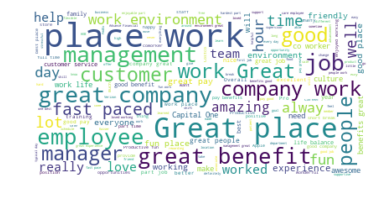

In [48]:
# Generate a word cloud image
wordcloud = WordCloud(max_font_size=40, max_words=200,stopwords=stopwords, background_color="white",random_state=1).generate(pos_text)
# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()
wordcloud.to_file("fig109.png")


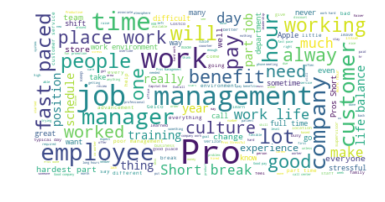

In [49]:
# Generate a word cloud image
wordcloud = WordCloud(max_font_size=40, max_words=200,stopwords=stopwords, background_color="white",random_state=1).generate(neg_text)
# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()
wordcloud.to_file("fig110.png")

There are 187672 words in the combination of all review.


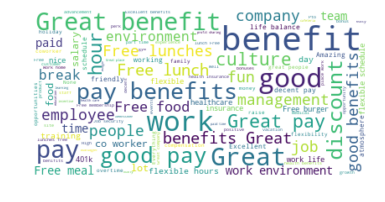

In [50]:
pros = " ".join(review for review in (reviews.pros))
print ("There are {} words in the combination of all review.".format(len(pros)))

stopwords.update(["Pros", "Cons"])
#generate a word cloud for pros of all the companies
# Generate a word cloud image
wordcloud = WordCloud(max_font_size=40, max_words=200,stopwords=stopwords, 
                      background_color="white",random_state=1).generate(pros)
# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()
wordcloud.to_file("fig111.png")

There are 328002 words in the combination of all review.


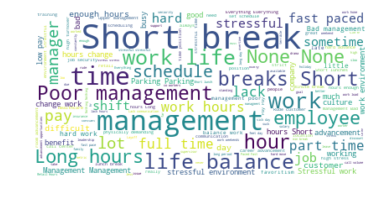

In [52]:
cons = " ".join(review for review in (reviews.cons))
print ("There are {} words in the combination of all review.".format(len(cons)))

stopwords.update(["Pros", "Cons"])
#generate a word cloud for pros of all the companies
# Generate a word cloud image
wordcloud = WordCloud(max_font_size=40, max_words=200,stopwords=stopwords, 
                      background_color="white",random_state=1).generate(cons)
# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

wordcloud.to_file("fig112.png")